# Models

### Importing Libraries + Dataframe / Extra Cleaning

In [1]:
!pip install keras
!pip install xgboost
!pip install matplotlib
!pip install scikit-learn
!pip install statsmodels
!pip install tensorflow
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
import keras
from sklearn.preprocessing import MinMaxScaler
from keras import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from tensorflow.keras.layers import SimpleRNN, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import mean_squared_error, mean_absolute_error
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from xgboost import XGBRegressor
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
df = pd.read_csv('concat_data.csv')

In [4]:
df.head()

,starttime,stoptime,start station id,start station name,start station latitude,start station longitude,end station id,end station name,end station latitude,end station longitude,District,month,day,year,hour,weekday,is_week_day,season
0,2019-01-01 00:09:13.798,2019-01-01 00:15:25.3360,80,MIT Stata Center at Vassar St / Main St,42.362131,-71.091156,179,MIT Vassar St,42.355601,-71.103945,Cambridge,1,1,2019,0,1,1,Winter
1,2019-01-01 00:33:56.182,2019-01-01 00:38:20.8800,117,Binney St / Sixth St,42.366162,-71.086883,189,Kendall T,42.362428,-71.084955,Cambridge,1,1,2019,0,1,1,Winter
2,2019-01-01 00:41:54.600,2019-01-01 00:49:33.2730,68,Central Square at Mass Ave / Essex St,42.365070,-71.103100,96,Cambridge Main Library at Broadway / Trowbridg...,42.373379,-71.111075,Cambridge,1,1,2019,0,1,1,Winter
3,2019-01-01 00:43:32.571,2019-01-01 00:49:37.4260,89,Harvard Law School at Mass Ave / Jarvis St,42.379011,-71.119945,334,Mass Ave at Hadley/Walden,42.391210,-71.122608,Cambridge,1,1,2019,0,1,1,Winter
4,2019-01-01 00:49:56.464,2019-01-01 01:01:17.7010,73,Harvard Square at Brattle St / Eliot St,42.373231,-71.120886,367,Vassal Lane at Tobin/VLUS,42.383932,-71.139613,Cambridge,1,1,2019,0,1,1,Winter


In [5]:
df1 = df

In [6]:
df1['starttime'] = pd.to_datetime(df1['starttime'], format = 'mixed')

In [7]:
column_names = df.columns.tolist()
column_names

['starttime',
 'stoptime',
 'start station id',
 'start station name',
 'start station latitude',
 'start station longitude',
 'end station id',
 'end station name',
 'end station latitude',
 'end station longitude',
 'District',
 'month',
 'day',
 'year',
 'hour',
 'weekday',
 'is_week_day',
 'season']

In [8]:
df1

,starttime,stoptime,start station id,start station name,start station latitude,start station longitude,end station id,end station name,end station latitude,end station longitude,District,month,day,year,hour,weekday,is_week_day,season
0,2019-01-01 00:09:13.798,2019-01-01 00:15:25.3360,80,MIT Stata Center at Vassar St / Main St,42.362131,-71.091156,179,MIT Vassar St,42.355601,-71.103945,Cambridge,1,1,2019,0,1,1,Winter
1,2019-01-01 00:33:56.182,2019-01-01 00:38:20.8800,117,Binney St / Sixth St,42.366162,-71.086883,189,Kendall T,42.362428,-71.084955,Cambridge,1,1,2019,0,1,1,Winter
2,2019-01-01 00:41:54.600,2019-01-01 00:49:33.2730,68,Central Square at Mass Ave / Essex St,42.365070,-71.103100,96,Cambridge Main Library at Broadway / Trowbridg...,42.373379,-71.111075,Cambridge,1,1,2019,0,1,1,Winter
3,2019-01-01 00:43:32.571,2019-01-01 00:49:37.4260,89,Harvard Law School at Mass Ave / Jarvis St,42.379011,-71.119945,334,Mass Ave at Hadley/Walden,42.391210,-71.122608,Cambridge,1,1,2019,0,1,1,Winter
4,2019-01-01 00:49:56.464,2019-01-01 01:01:17.7010,73,Harvard Square at Brattle St / Eliot St,42.373231,-71.120886,367,Vassal Lane at Tobin/VLUS,42.383932,-71.139613,Cambridge,1,1,2019,0,1,1,Winter
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14963818,2023-12-31 23:47:34.000,2024-01-01 00:26:32,C32053,Broadway T Stop,42.343049,-71.058034,C32053,Broadway T Stop,42.343049,-71.058034,Boston,12,31,2023,23,6,0,Winter
14963819,2023-12-31 23:48:09.000,2023-12-31 23:56:43,A32026,Purchase St at Pearl St,42.354659,-71.053181,C32024,State Street at Channel Center,42.344137,-71.052608,Boston,12,31,2023,23,6,0,Winter
14963820,2023-12-31 23:51:58.000,2024-01-01 00:30:50,B32014,Seaport Hotel - Congress St at Seaport Ln,42.348810,-71.041677,B32014,Seaport Hotel - Congress St at Seaport Ln,42.348810,-71.041677,Boston,12,31,2023,23,6,0,Winter
14963821,2023-12-31 23:52:30.000,2024-01-01 00:43:24,D32046,Boylston St at Exeter St,42.349589,-71.079468,D32046,Boylston St at Exeter St,42.349589,-71.079468,Boston,12,31,2023,23,6,0,Winter


In [9]:
df1["District"].unique()

array(['Cambridge', 'Boston', nan, 'Somerville', 'Brookline', 'Everett',
       'Watertown', 'Arlington', 'Newton', 'Revere', 'Chelsea', 'Salem',
       'Medford', 'Malden'], dtype=object)

In [10]:
df2 = df1.dropna(subset=['District'])
df2["District"].unique()

array(['Cambridge', 'Boston', 'Somerville', 'Brookline', 'Everett',
       'Watertown', 'Arlington', 'Newton', 'Revere', 'Chelsea', 'Salem',
       'Medford', 'Malden'], dtype=object)

In [11]:
district_counts = df2['District'].value_counts()
print(district_counts)

District
Boston        7380922
Cambridge     4991966
Somerville     717981
Brookline      405368
Everett         48836
Watertown       31813
Arlington       27212
Newton          25298
Salem           22473
Chelsea          8647
Revere           7368
Medford          7360
Malden           4815
Name: count, dtype: int64


In [12]:
df2

,starttime,stoptime,start station id,start station name,start station latitude,start station longitude,end station id,end station name,end station latitude,end station longitude,District,month,day,year,hour,weekday,is_week_day,season
0,2019-01-01 00:09:13.798,2019-01-01 00:15:25.3360,80,MIT Stata Center at Vassar St / Main St,42.362131,-71.091156,179,MIT Vassar St,42.355601,-71.103945,Cambridge,1,1,2019,0,1,1,Winter
1,2019-01-01 00:33:56.182,2019-01-01 00:38:20.8800,117,Binney St / Sixth St,42.366162,-71.086883,189,Kendall T,42.362428,-71.084955,Cambridge,1,1,2019,0,1,1,Winter
2,2019-01-01 00:41:54.600,2019-01-01 00:49:33.2730,68,Central Square at Mass Ave / Essex St,42.365070,-71.103100,96,Cambridge Main Library at Broadway / Trowbridg...,42.373379,-71.111075,Cambridge,1,1,2019,0,1,1,Winter
3,2019-01-01 00:43:32.571,2019-01-01 00:49:37.4260,89,Harvard Law School at Mass Ave / Jarvis St,42.379011,-71.119945,334,Mass Ave at Hadley/Walden,42.391210,-71.122608,Cambridge,1,1,2019,0,1,1,Winter
4,2019-01-01 00:49:56.464,2019-01-01 01:01:17.7010,73,Harvard Square at Brattle St / Eliot St,42.373231,-71.120886,367,Vassal Lane at Tobin/VLUS,42.383932,-71.139613,Cambridge,1,1,2019,0,1,1,Winter
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14963818,2023-12-31 23:47:34.000,2024-01-01 00:26:32,C32053,Broadway T Stop,42.343049,-71.058034,C32053,Broadway T Stop,42.343049,-71.058034,Boston,12,31,2023,23,6,0,Winter
14963819,2023-12-31 23:48:09.000,2023-12-31 23:56:43,A32026,Purchase St at Pearl St,42.354659,-71.053181,C32024,State Street at Channel Center,42.344137,-71.052608,Boston,12,31,2023,23,6,0,Winter
14963820,2023-12-31 23:51:58.000,2024-01-01 00:30:50,B32014,Seaport Hotel - Congress St at Seaport Ln,42.348810,-71.041677,B32014,Seaport Hotel - Congress St at Seaport Ln,42.348810,-71.041677,Boston,12,31,2023,23,6,0,Winter
14963821,2023-12-31 23:52:30.000,2024-01-01 00:43:24,D32046,Boylston St at Exeter St,42.349589,-71.079468,D32046,Boylston St at Exeter St,42.349589,-71.079468,Boston,12,31,2023,23,6,0,Winter


In [13]:
datatypes1 = df2.dtypes 
  
# Print the data types 
# of each column 
datatypes1

starttime                  datetime64[ns]
stoptime                           object
start station id                   object
start station name                 object
start station latitude            float64
start station longitude           float64
end station id                     object
end station name                   object
end station latitude              float64
end station longitude             float64
District                           object
month                               int64
day                                 int64
year                                int64
hour                                int64
weekday                             int64
is_week_day                         int64
season                             object
dtype: object

In [14]:
df_pred = df2.copy()
df_pred['date'] = df_pred.starttime.dt.date
df_pred = df_pred.groupby(['year', 'month', 'date']).size().reset_index(name='Totalrides')
df_pred['date'] = pd.to_datetime(df_pred.date)

dataset = pd.DataFrame(df_pred.Totalrides.values)
dataset = dataset.astype('float32')
df_pred

,year,month,date,Totalrides
0,2019,1,2019-01-01,1188
1,2019,1,2019-01-02,2367
2,2019,1,2019-01-03,2700
3,2019,1,2019-01-04,3076
4,2019,1,2019-01-05,693
...,...,...,...,...
1819,2023,12,2023-12-27,3367
1820,2023,12,2023-12-28,1285
1821,2023,12,2023-12-29,2804
1822,2023,12,2023-12-30,1965


In [15]:
df_pred['year'].value_counts()[2022]

364

In [16]:
year_entries = df_pred[df_pred['year'] == 2022]

print(year_entries)

      year  month       date  Totalrides
1095  2022      1 2022-01-01        2068
1096  2022      1 2022-01-02        1891
1097  2022      1 2022-01-03        2552
1098  2022      1 2022-01-04        2612
1099  2022      1 2022-01-05        2537
...    ...    ...        ...         ...
1454  2022     12 2022-12-27        2085
1455  2022     12 2022-12-28        2332
1456  2022     12 2022-12-29        3284
1457  2022     12 2022-12-30        4182
1458  2022     12 2022-12-31        2201

[364 rows x 4 columns]


In [17]:
datatypes = df_pred.dtypes 
  
# Print the data types 
# of each column 
datatypes

year                   int64
month                  int64
date          datetime64[ns]
Totalrides             int64
dtype: object

In [18]:
df_pred["date"].unique()

<DatetimeArray>
['2019-01-01 00:00:00', '2019-01-02 00:00:00', '2019-01-03 00:00:00',
 '2019-01-04 00:00:00', '2019-01-05 00:00:00', '2019-01-06 00:00:00',
 '2019-01-07 00:00:00', '2019-01-08 00:00:00', '2019-01-09 00:00:00',
 '2019-01-10 00:00:00',
 ...
 '2023-12-22 00:00:00', '2023-12-23 00:00:00', '2023-12-24 00:00:00',
 '2023-12-25 00:00:00', '2023-12-26 00:00:00', '2023-12-27 00:00:00',
 '2023-12-28 00:00:00', '2023-12-29 00:00:00', '2023-12-30 00:00:00',
 '2023-12-31 00:00:00']
Length: 1824, dtype: datetime64[ns]

In [19]:
dataset

,0
0,1188.0
1,2367.0
2,2700.0
3,3076.0
4,693.0
...,...
1819,3367.0
1820,1285.0
1821,2804.0
1822,1965.0


# Exponential Baseline Model

Train RMSE: 1755.85
Test RMSE: 3872.83
Train MAE: 1244.88
Test MAE: 3290.10


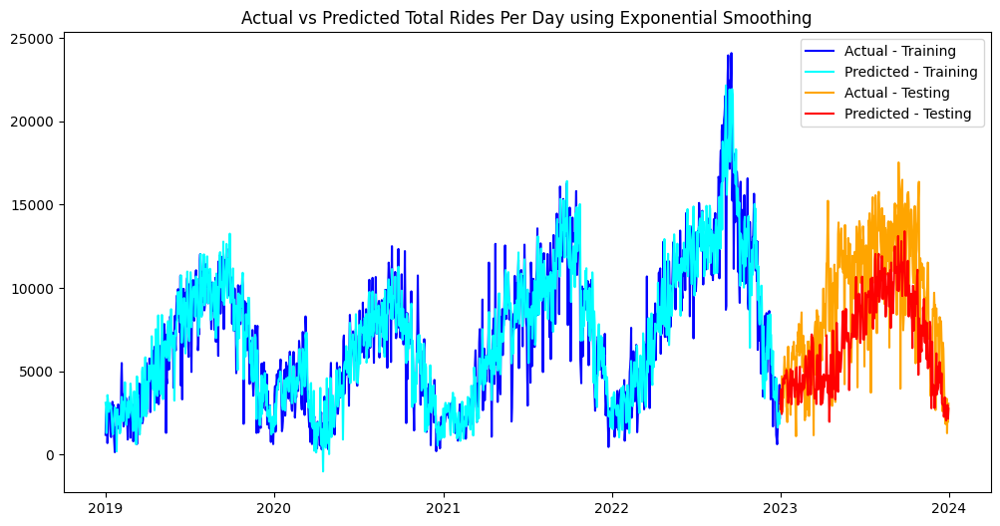

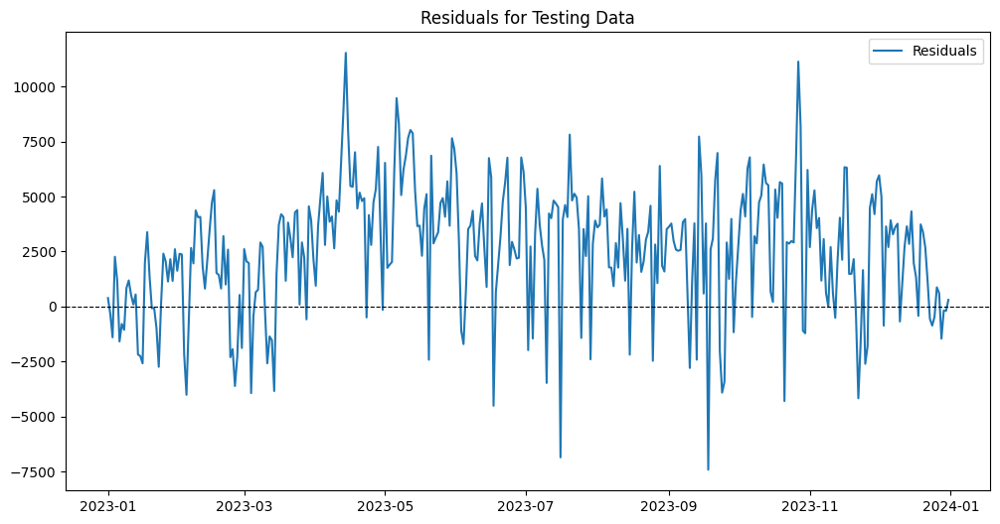

In [20]:
# Sort data by date
data = df_pred

# Split the dataset into training and testing sets
split_date = '2023-01-01'  # Adjust as needed
train = data[data['date'] < split_date]
test = data[data['date'] >= split_date]

# Prepare the training and testing series
train_series = train.set_index('date')['Totalrides']
test_series = test.set_index('date')['Totalrides']

# Fit an Exponential Smoothing model
model = ExponentialSmoothing(
    train_series, 
    seasonal='add',
    trend='add',
    damped_trend=True,
    seasonal_periods = 365
)
fitted_model = model.fit()

# Make predictions
train_predictions = fitted_model.fittedvalues
test_predictions = fitted_model.forecast(len(test_series))

# Ensure that the forecast has the correct index (dates)
test_predictions.index = test_series.index  # Align the forecast to the test dates

# Calculate RMSE
train_rmse = math.sqrt(mean_squared_error(train_series, train_predictions))
test_rmse = math.sqrt(mean_squared_error(test_series, test_predictions))

# Calculate MAE
train_mae = mean_absolute_error(train_series, train_predictions)
test_mae = mean_absolute_error(test_series, test_predictions)

print(f"Train RMSE: {train_rmse:.2f}")
print(f"Test RMSE: {test_rmse:.2f}")

print(f"Train MAE: {train_mae:.2f}")
print(f"Test MAE: {test_mae:.2f}")

# Plot the loss over each epoch (using smoothed loss for simplicity)
plt.figure(figsize=(12, 6))
plt.plot(train_series.index, train_series, label="Actual - Training", color="blue")
plt.plot(train_predictions.index, train_predictions, label="Predicted - Training", color="cyan")
plt.plot(test_series.index, test_series, label="Actual - Testing", color="orange")
plt.plot(test_predictions.index, test_predictions, label="Predicted - Testing", color="red")
plt.title("Actual vs Predicted Total Rides Per Day using Exponential Smoothing")
plt.legend()
plt.show()

# Optional: Visualize residuals
plt.figure(figsize=(12, 6))
residuals = test_series - test_predictions
plt.plot(residuals.index, residuals, label="Residuals")
plt.axhline(y=0, color='black', linestyle='--', linewidth=0.8)
plt.title("Residuals for Testing Data")
plt.legend()
plt.show()

# RNN Model Predictions for Total Rides

Epoch 1/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 0.1217 - val_loss: 0.0153
Epoch 2/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0330 - val_loss: 0.0113
Epoch 3/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0179 - val_loss: 0.0111
Epoch 4/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0145 - val_loss: 0.0107
Epoch 5/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0125 - val_loss: 0.0100
Epoch 6/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0096 - val_loss: 0.0099
Epoch 7/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0101 - val_loss: 0.0105
Epoch 8/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0104 - val_loss: 0.0097
Epoch 9/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0082 - val_loss: 0.0096
Epoch 10/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0082 - val_loss: 0.0099
Epoch 11/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0080 - val_loss: 0.0101
Epoch 12/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0

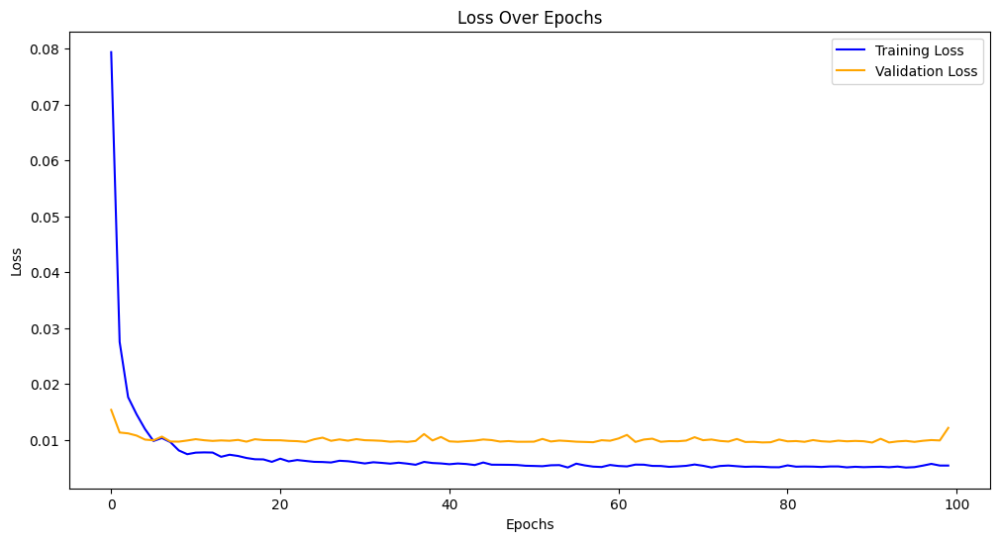

In [28]:
# Load your dataset
data = df_pred.copy()

# Split the dataset into training and testing sets
split_date = '2023-01-01'  # Adjust as needed
train = data[data['date'] < split_date]
test = data[data['date'] >= split_date]

# Prepare the training and testing series
train_series = train.set_index('date')['Totalrides'].values
test_series = test.set_index('date')['Totalrides'].values

# Normalize the data for better performance
scaler = MinMaxScaler(feature_range=(0, 1))
train_scaled = scaler.fit_transform(train_series.reshape(-1, 1))
test_scaled = scaler.transform(test_series.reshape(-1, 1))

# Prepare data for the RNN
def create_sequences(data, time_steps):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i + time_steps])
        y.append(data[i + time_steps])
    return np.array(X), np.array(y)

time_steps = 30  # Lookback window (adjust as needed)
X_train, y_train = create_sequences(train_scaled, time_steps)
X_test, y_test = create_sequences(test_scaled, time_steps)

# Reshape input to match RNN expectations (samples, time_steps, features)
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

# Build the RNN model
model = Sequential([
    SimpleRNN(50, activation='tanh', return_sequences=True, input_shape=(time_steps, 1)),
    Dropout(0.2),
    SimpleRNN(50, activation='tanh'),
    Dropout(0.2),
    Dense(1)
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Train the model
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), verbose=1)

# Make predictions
train_predictions = model.predict(X_train)
test_predictions = model.predict(X_test)

# Inverse transform predictions and actual values
train_predictions = scaler.inverse_transform(train_predictions)
test_predictions = scaler.inverse_transform(test_predictions)
y_train = scaler.inverse_transform(y_train.reshape(-1, 1))
y_test = scaler.inverse_transform(y_test.reshape(-1, 1))

# Calculate RMSE
train_rmse = np.sqrt(mean_squared_error(y_train, train_predictions))
test_rmse = np.sqrt(mean_squared_error(y_test, test_predictions))

# Calculate MAE
train_mae = mean_absolute_error(y_train, train_predictions)
test_mae = mean_absolute_error(y_test, test_predictions)

print(f"Train RMSE: {train_rmse:.2f}")
print(f"Test RMSE: {test_rmse:.2f}")

print(f"Train MAE: {train_mae:.2f}")
print(f"Test MAE: {test_mae:.2f}")

# Plot training and validation loss
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Training Loss', color='blue')
plt.plot(history.history['val_loss'], label='Validation Loss', color='orange')
plt.title('Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


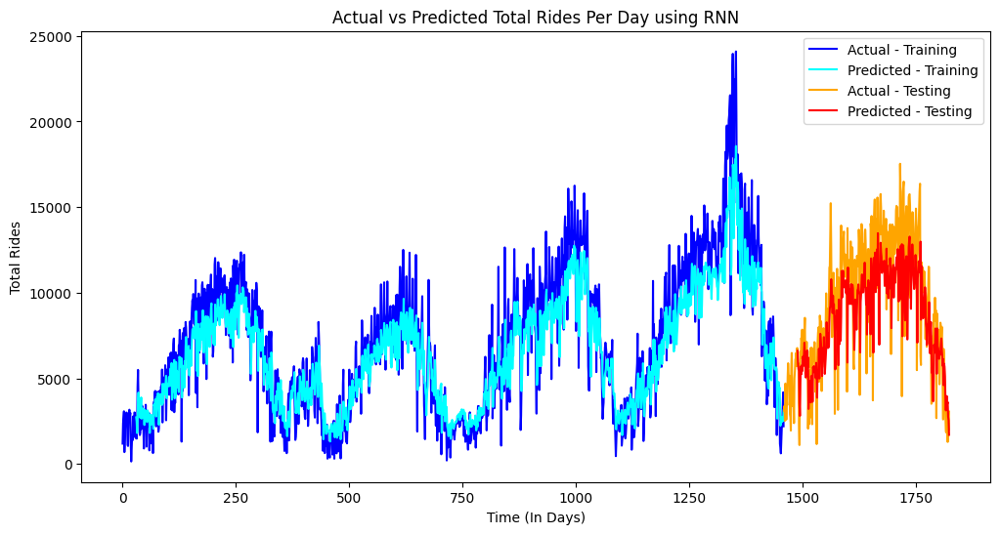

In [29]:
# Plot actual vs predicted
plt.figure(figsize=(12, 6))
plt.plot(range(len(train_series)), train_series, label="Actual - Training", color="blue")
plt.plot(range(time_steps, time_steps + len(train_predictions)), train_predictions, label="Predicted - Training", color="cyan")
plt.plot(range(len(train_series), len(train_series) + len(test_series)), test_series, label="Actual - Testing", color="orange")
plt.plot(range(len(train_series) + time_steps, len(train_series) + time_steps + len(test_predictions)), test_predictions, label="Predicted - Testing", color="red")
plt.title("Actual vs Predicted Total Rides Per Day using RNN")
plt.xlabel('Time (In Days)')
plt.ylabel('Total Rides')
plt.legend()
plt.show()

# LSTM Model Predictions for Total Rides

Epoch 1/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0291 - val_loss: 0.0120
Epoch 2/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0082 - val_loss: 0.0119
Epoch 3/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0075 - val_loss: 0.0118
Epoch 4/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0079 - val_loss: 0.0123
Epoch 5/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0070 - val_loss: 0.0123
Epoch 6/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0077 - val_loss: 0.0111
Epoch 7/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0070 - val_loss: 0.0112
Epoch 8/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0073 - val_loss: 0.0115
Epoch 9/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0073 - val_loss: 0.0110
Epoch 10/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0071 - val_loss: 0.0120
Epoch 11/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0072 - val_loss: 0.0116
Epoch 12/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step

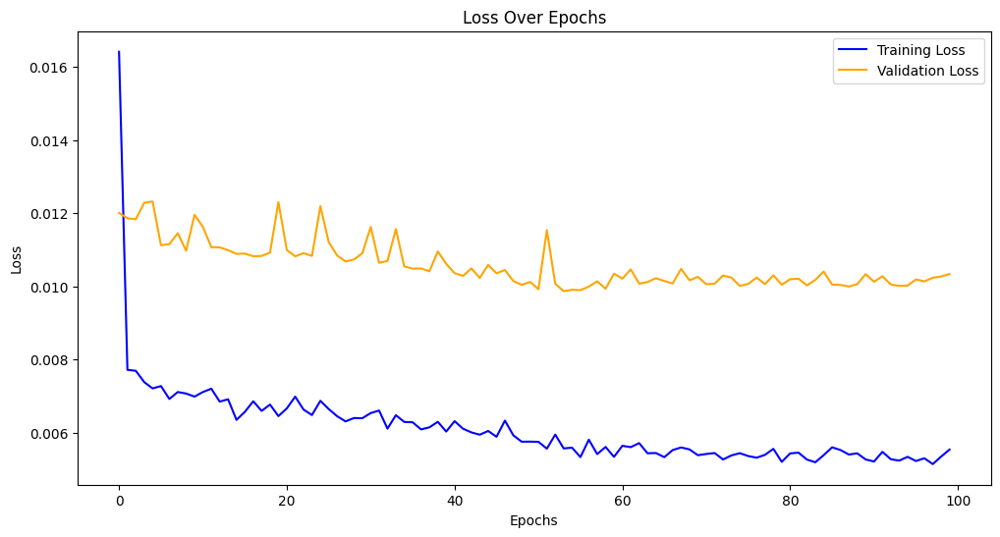

In [30]:
# Load your dataset
data = df_pred.copy()

# Split the dataset into training and testing sets
split_date = '2023-01-01'  # Adjust as needed
train = data[data['date'] < split_date]
test = data[data['date'] >= split_date]

# Prepare the training and testing series
train_series = train.set_index('date')['Totalrides'].values
test_series = test.set_index('date')['Totalrides'].values

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
train_scaled = scaler.fit_transform(train_series.reshape(-1, 1))
test_scaled = scaler.transform(test_series.reshape(-1, 1))

# Prepare data for the LSTM
def create_sequences(data, time_steps):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i + time_steps])
        y.append(data[i + time_steps])
    return np.array(X), np.array(y)

time_steps = 30  # Lookback window (adjust as needed)
X_train, y_train = create_sequences(train_scaled, time_steps)
X_test, y_test = create_sequences(test_scaled, time_steps)

# Reshape input to match LSTM expectations (samples, time_steps, features)
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

# Build the LSTM model
model = Sequential([
    LSTM(50, activation='tanh', return_sequences=True, input_shape=(time_steps, 1)),
    Dropout(0.2),
    LSTM(50, activation='tanh'),
    Dropout(0.2),
    Dense(1)
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Train the model
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), verbose=1)

# Make predictions
train_predictions = model.predict(X_train)
test_predictions = model.predict(X_test)

# Inverse transform predictions and actual values
train_predictions = scaler.inverse_transform(train_predictions)
test_predictions = scaler.inverse_transform(test_predictions)
y_train = scaler.inverse_transform(y_train.reshape(-1, 1))
y_test = scaler.inverse_transform(y_test.reshape(-1, 1))

# Calculate RMSE
train_rmse = np.sqrt(mean_squared_error(y_train, train_predictions))
test_rmse = np.sqrt(mean_squared_error(y_test, test_predictions))

# Calculate MAE
train_mae = mean_absolute_error(y_train, train_predictions)
test_mae = mean_absolute_error(y_test, test_predictions)

print(f"Train RMSE: {train_rmse:.2f}")
print(f"Test RMSE: {test_rmse:.2f}")

print(f"Train MAE: {train_mae:.2f}")
print(f"Test MAE: {test_mae:.2f}")

# Plot training and validation loss
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Training Loss', color='blue')
plt.plot(history.history['val_loss'], label='Validation Loss', color='orange')
plt.title('Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

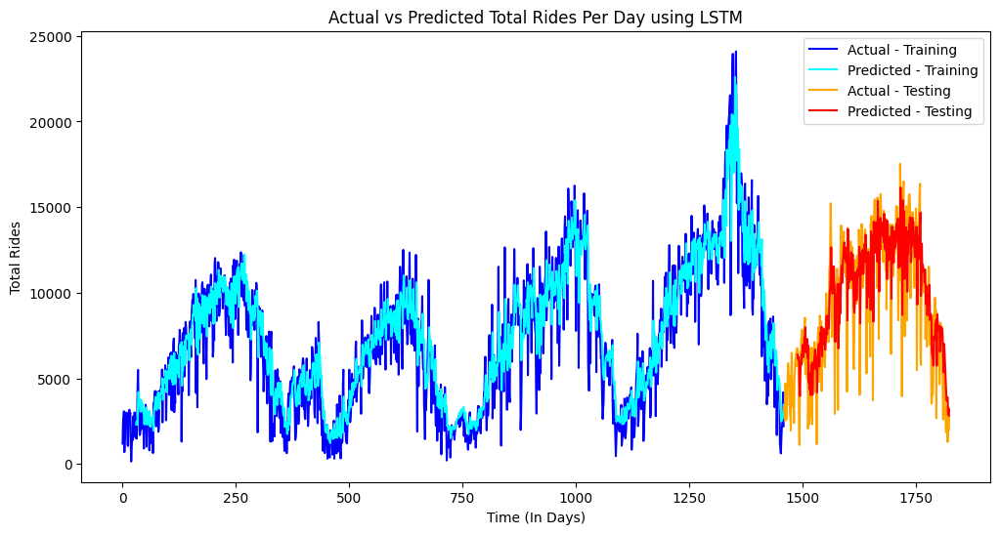

In [31]:
# Plot actual vs predicted
plt.figure(figsize=(12, 6))
plt.plot(range(len(train_series)), train_series, label="Actual - Training", color="blue")
plt.plot(range(time_steps, time_steps + len(train_predictions)), train_predictions, label="Predicted - Training", color="cyan")
plt.plot(range(len(train_series), len(train_series) + len(test_series)), test_series, label="Actual - Testing", color="orange")
plt.plot(range(len(train_series) + time_steps, len(train_series) + time_steps + len(test_predictions)), test_predictions, label="Predicted - Testing", color="red")
plt.title("Actual vs Predicted Total Rides Per Day using LSTM")
plt.xlabel('Time (In Days)')
plt.ylabel('Total Rides')
plt.legend()
plt.show()

# XGBoost Model Predictions for Total Rides

[0]	validation_0-rmse:4115.03072	validation_1-rmse:4453.73925
[10]	validation_0-rmse:3783.52037	validation_1-rmse:4156.21534
[20]	validation_0-rmse:3486.74138	validation_1-rmse:3897.65807
[30]	validation_0-rmse:3218.81430	validation_1-rmse:3670.83269
[40]	validation_0-rmse:2977.17372	validation_1-rmse:3469.32329
[50]	validation_0-rmse:2757.55291	validation_1-rmse:3295.53213
[60]	validation_0-rmse:2560.89809	validation_1-rmse:3144.99068
[70]	validation_0-rmse:2384.24549	validation_1-rmse:3018.31126
[80]	validation_0-rmse:2224.70136	validation_1-rmse:2905.68718
[90]	validation_0-rmse:2082.86800	validation_1-rmse:2812.72094
[100]	validation_0-rmse:1955.02823	validation_1-rmse:2730.06831
[110]	validation_0-rmse:1840.42990	validation_1-rmse:2660.65275
[120]	validation_0-rmse:1736.52311	validation_1-rmse:2602.63346
[130]	validation_0-rmse:1642.56902	validation_1-rmse:2551.31872
[140]	validation_0-rmse:1559.10873	validation_1-rmse:2506.99363
[150]	validation_0-rmse:1484.90093	validation_1-rms

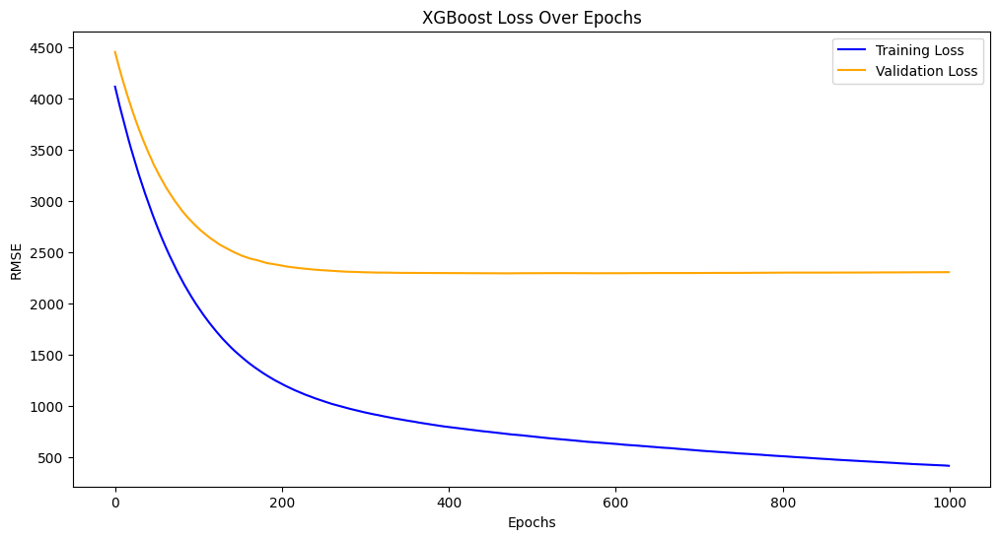

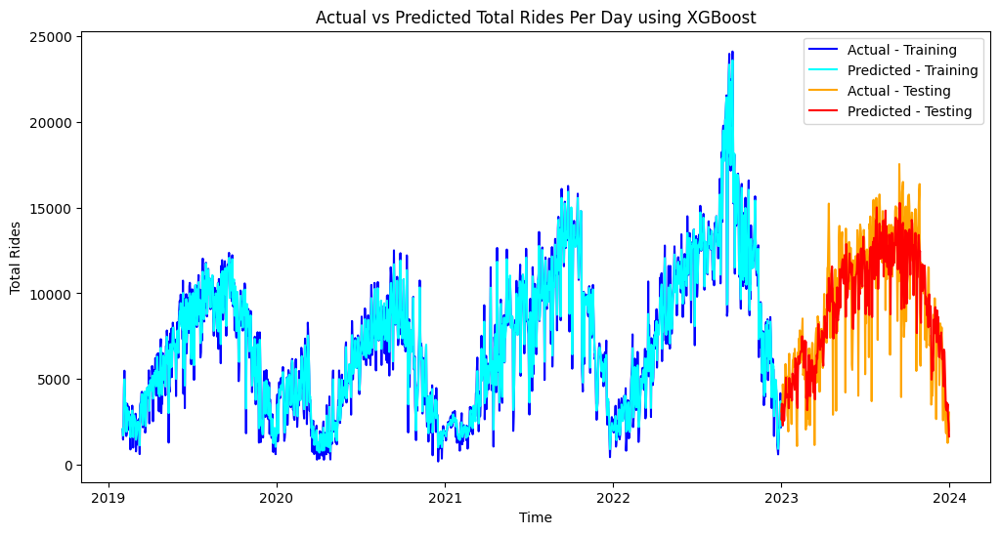

In [53]:
# Load your dataset
data = df_pred.copy()


# Prepare lag features for supervised learning
def create_lag_features(df, lag, target_col):
    for i in range(1, lag + 1):
        df[f'lag_{i}'] = df[target_col].shift(i)
    return df

# Add lag features
lag = 30  # Number of lag days to include
data = create_lag_features(data, lag, target_col='Totalrides')

# Drop rows with NaN values caused by lagging
data.dropna(inplace=True)

# Split the dataset into training and testing sets
split_date = '2023-01-01'
train = data[data['date'] < split_date]
test = data[data['date'] >= split_date]

# Define features and target
X_train = train[[f'lag_{i}' for i in range(1, lag + 1)]]
y_train = train['Totalrides']
X_test = test[[f'lag_{i}' for i in range(1, lag + 1)]]
y_test = test['Totalrides']

# Initialize and train the XGBoost model
xgb_model = XGBRegressor(
    n_estimators=1000,
    learning_rate=0.01,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)

xgb_model.fit(
    X_train, y_train,
    eval_set=[(X_train, y_train), (X_test, y_test)],
    verbose=10
)

# Make predictions
train_predictions = xgb_model.predict(X_train)
test_predictions = xgb_model.predict(X_test)

# Calculate RMSE
train_rmse = np.sqrt(mean_squared_error(y_train, train_predictions))
test_rmse = np.sqrt(mean_squared_error(y_test, test_predictions))

# Calculate MAE
train_mae = mean_absolute_error(y_train, train_predictions)
test_mae = mean_absolute_error(y_test, test_predictions)

print(f"Train RMSE: {train_rmse:.2f}")
print(f"Test RMSE: {test_rmse:.2f}")

print(f"Train MAE: {train_mae:.2f}")
print(f"Test MAE: {test_mae:.2f}")

# Plot training and validation loss from XGBoost logs
results = xgb_model.evals_result_
plt.figure(figsize=(12, 6))
plt.plot(results['validation_0']['rmse'], label='Training Loss', color='blue')
plt.plot(results['validation_1']['rmse'], label='Validation Loss', color='orange')
plt.title('XGBoost Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('RMSE')
plt.legend()
plt.show()

# Plot actual vs predicted
plt.figure(figsize=(12, 6))
plt.plot(train['date'], y_train, label="Actual - Training", color="blue")
plt.plot(train['date'], train_predictions, label="Predicted - Training", color="cyan")
plt.plot(test['date'], y_test, label="Actual - Testing", color="orange")
plt.plot(test['date'], test_predictions, label="Predicted - Testing", color="red")
plt.title("Actual vs Predicted Total Rides Per Day using XGBoost")
plt.xlabel('Time')
plt.ylabel('Total Rides')
plt.legend()
plt.show()

In [21]:
import xgboost as xgb
print(xgb.__version__)

2.1.2


# XGBoost Ride Predictions per District

### Original Hyperparameters


--- Forecasting for District: Arlington ---
Train RMSE: 2.11
Test RMSE: 14.73
Ratio: 6.98


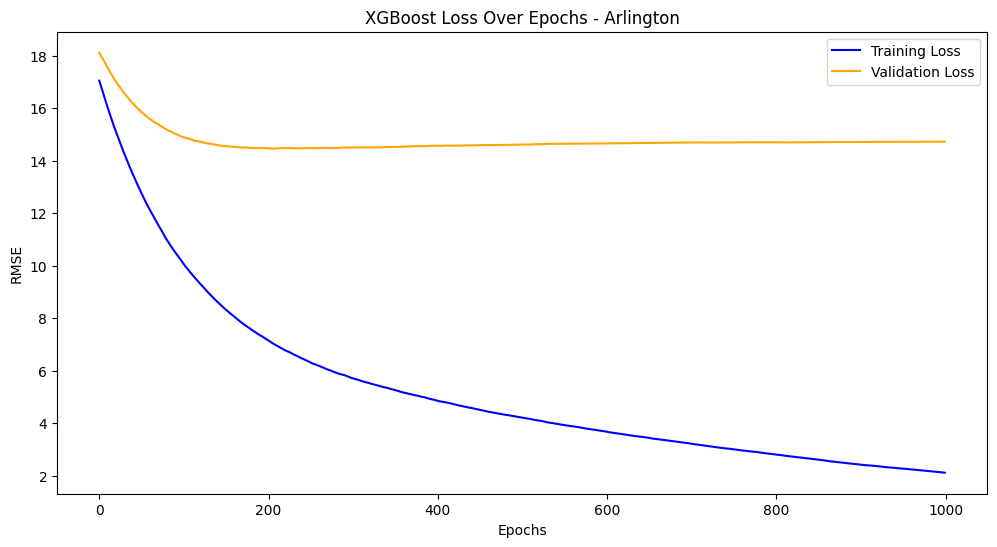

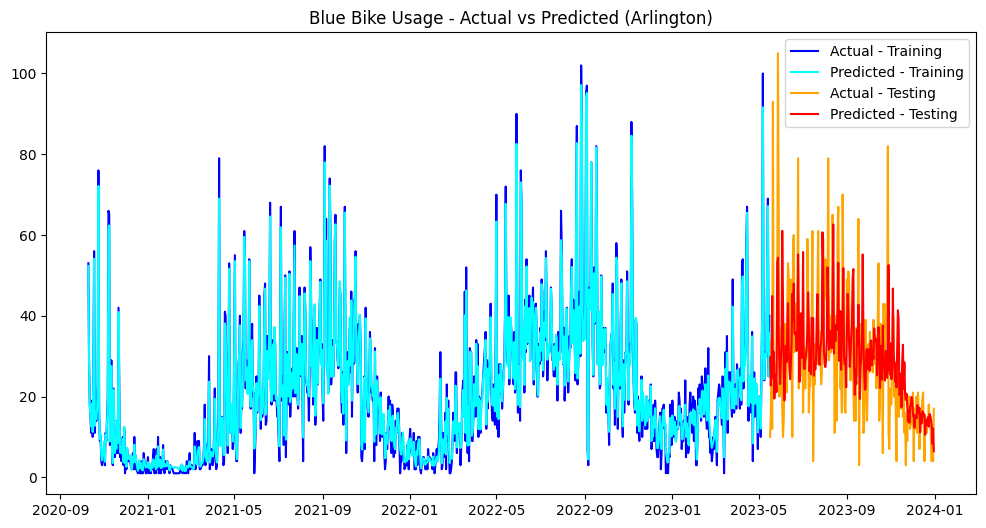


--- Forecasting for District: Boston ---
Train RMSE: 247.84
Test RMSE: 1227.64
Ratio: 4.95


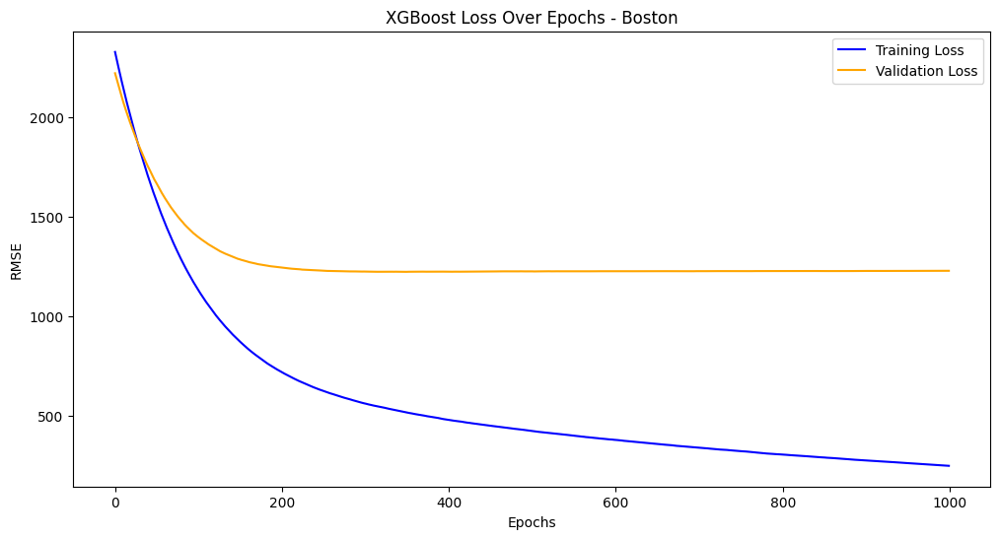

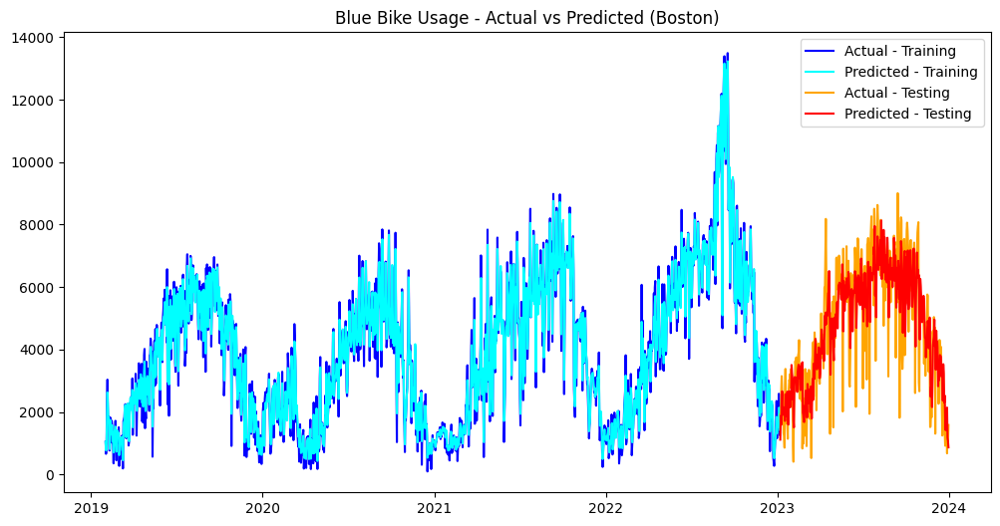


--- Forecasting for District: Brookline ---
Train RMSE: 13.55
Test RMSE: 68.09
Ratio: 5.02


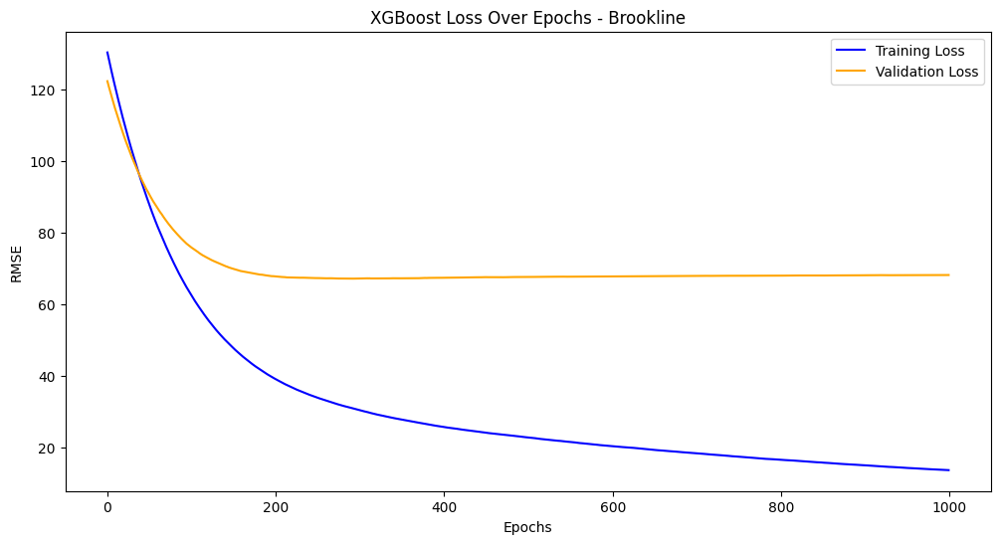

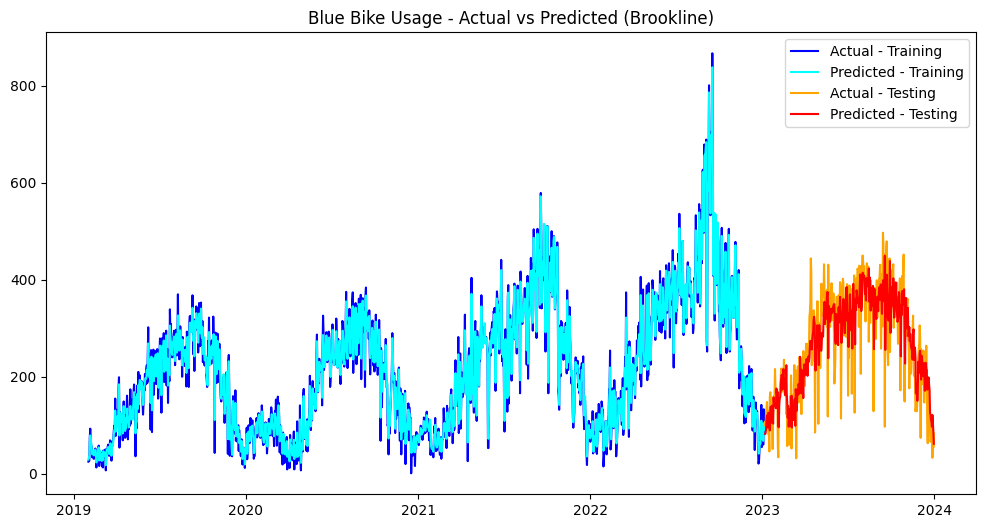


--- Forecasting for District: Cambridge ---
Train RMSE: 135.95
Test RMSE: 842.71
Ratio: 6.20


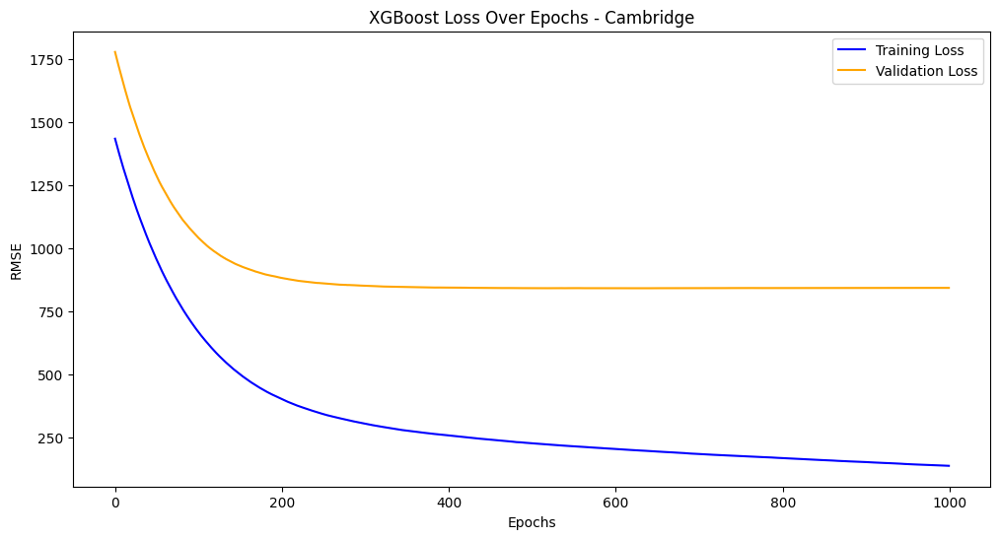

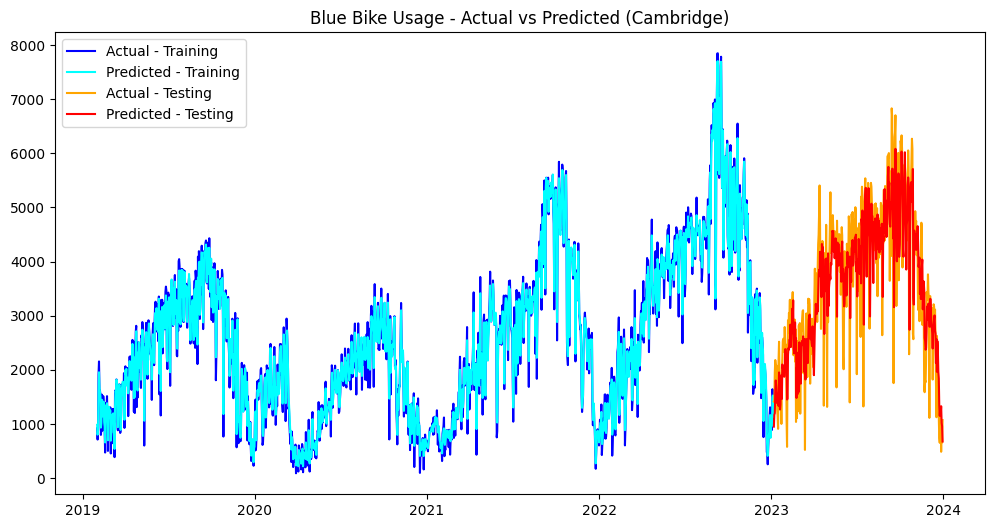


--- Forecasting for District: Chelsea ---
Train RMSE: 0.63
Test RMSE: 4.66
Ratio: 7.34


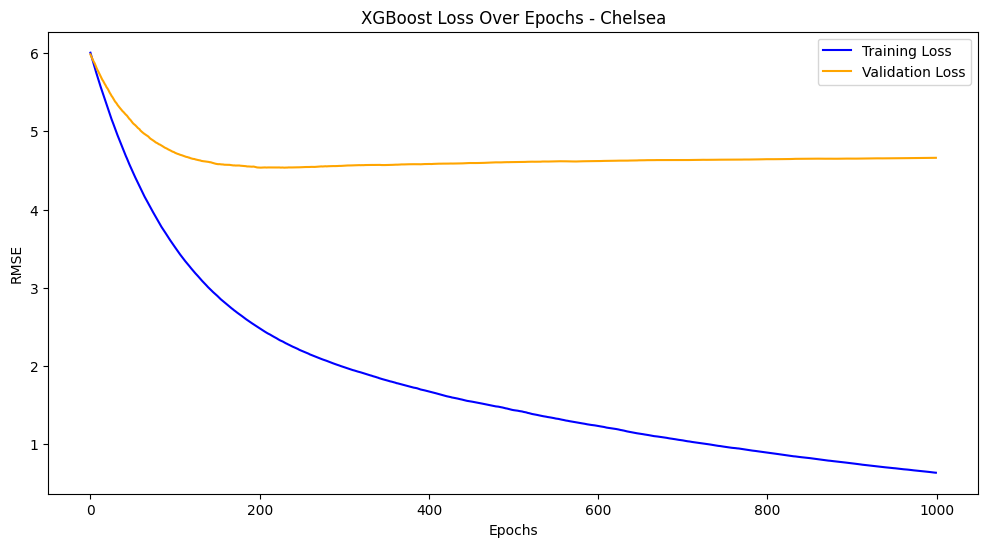

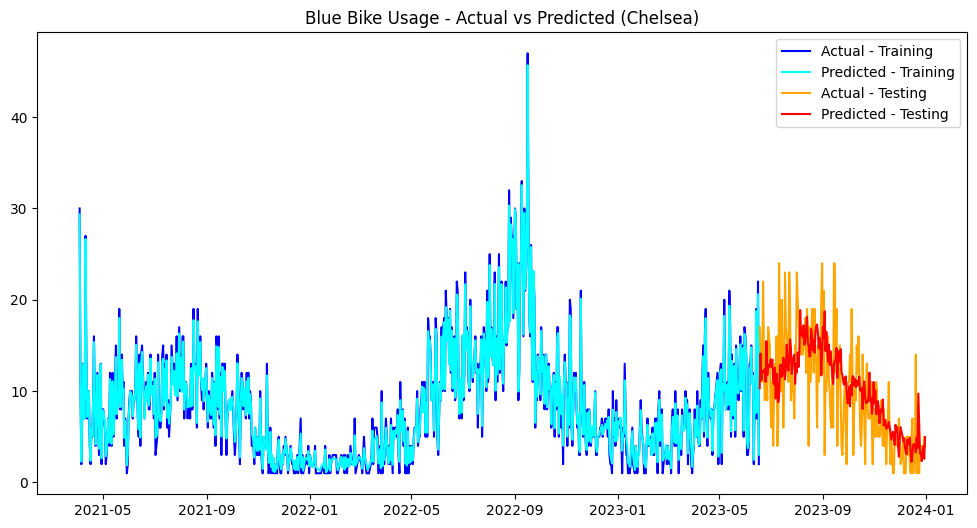


--- Forecasting for District: Everett ---
Train RMSE: 2.37
Test RMSE: 15.30
Ratio: 6.47


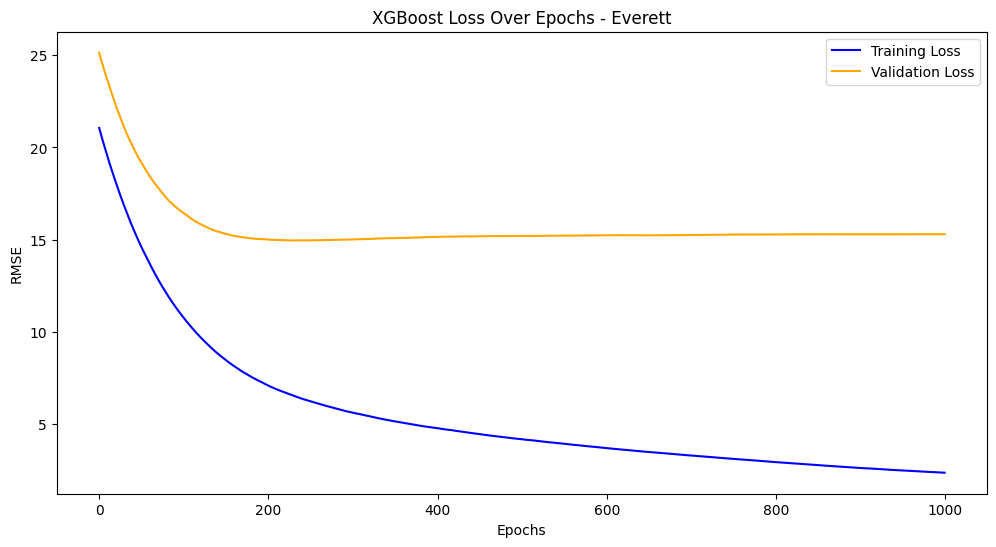

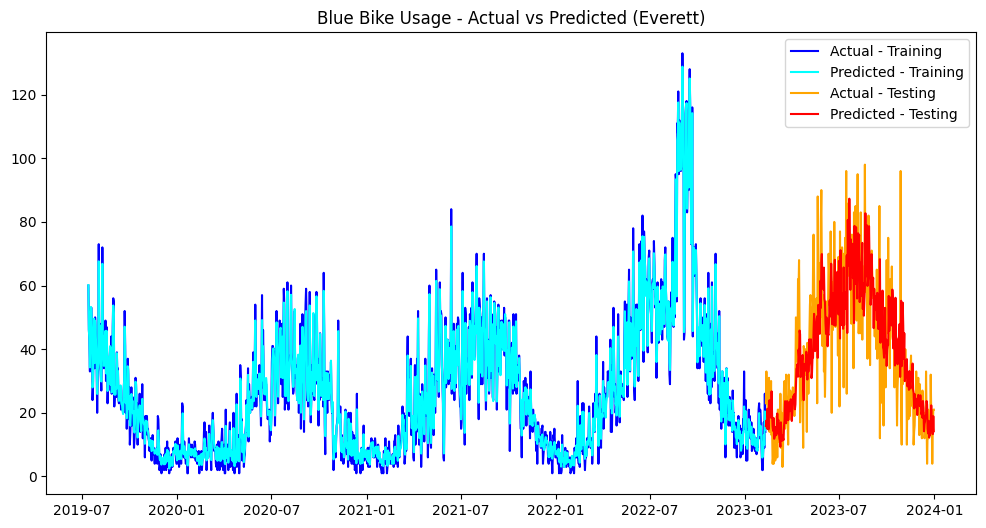


--- Forecasting for District: Malden ---
Train RMSE: 0.35
Test RMSE: 4.75
Ratio: 13.43


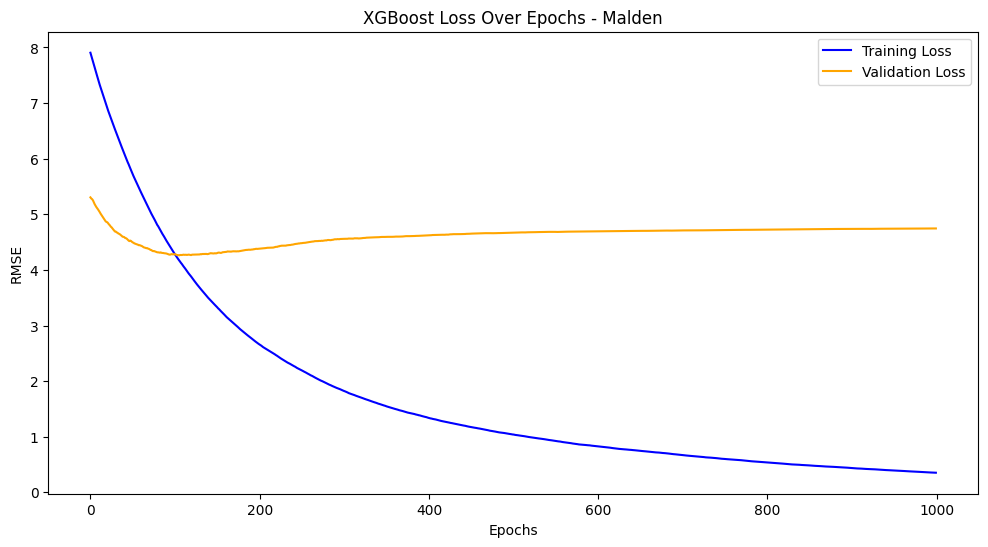

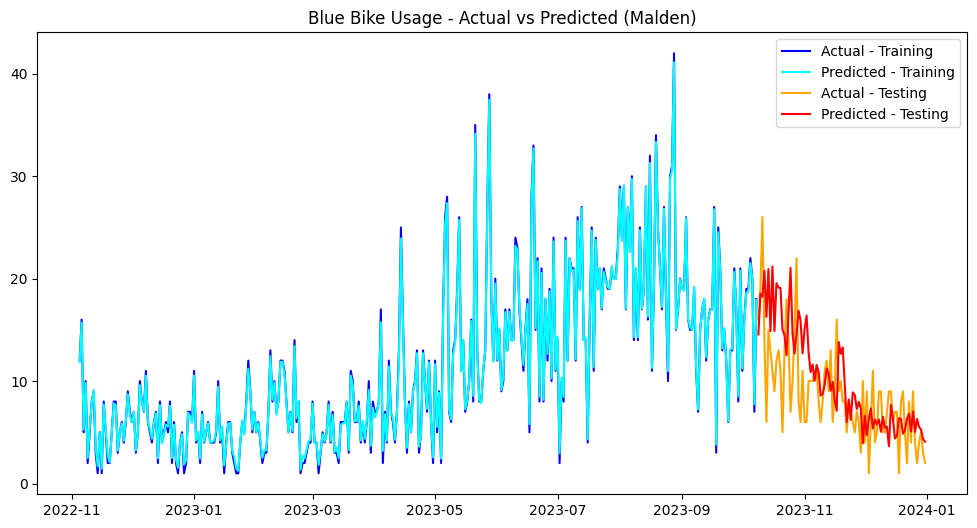


--- Forecasting for District: Medford ---
Train RMSE: 0.37
Test RMSE: 8.71
Ratio: 23.55


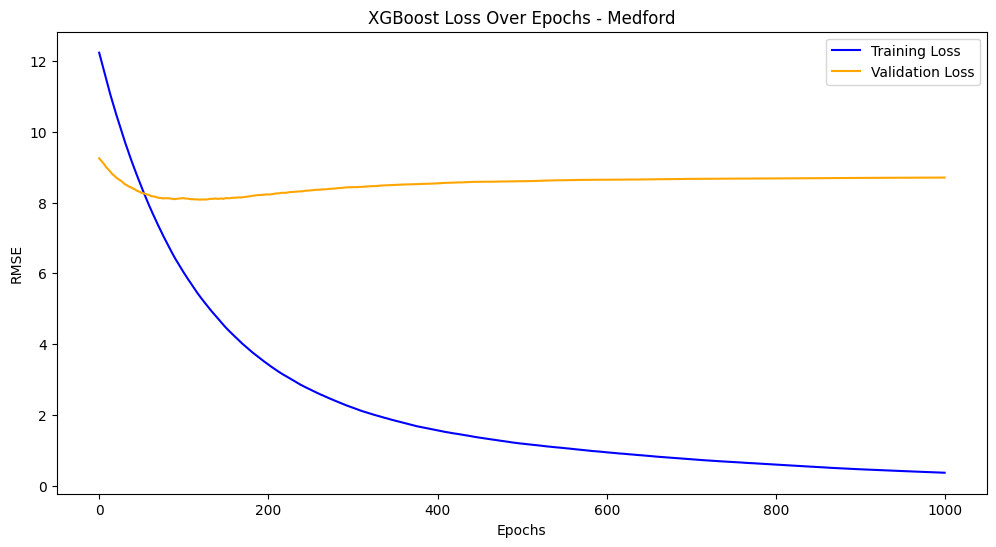

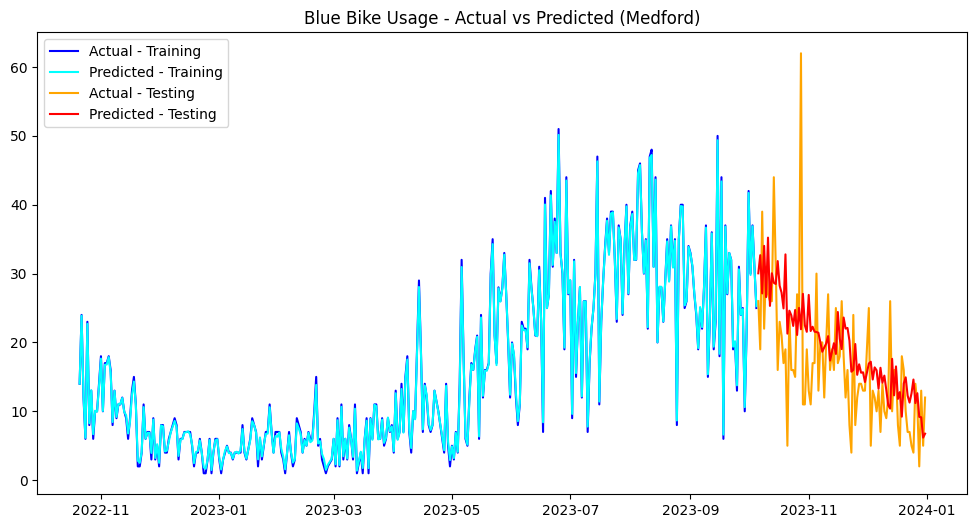


--- Forecasting for District: Newton ---
Train RMSE: 1.70
Test RMSE: 12.19
Ratio: 7.17


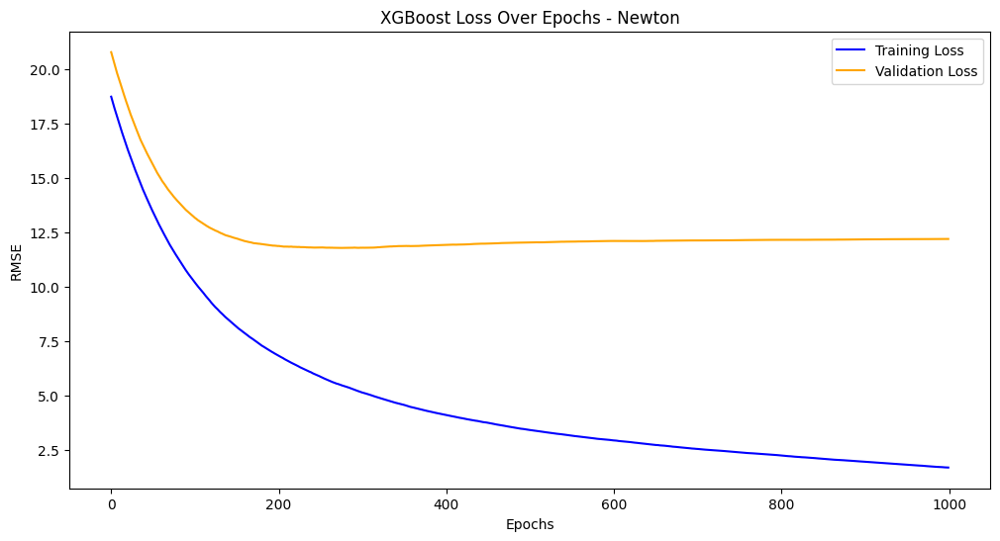

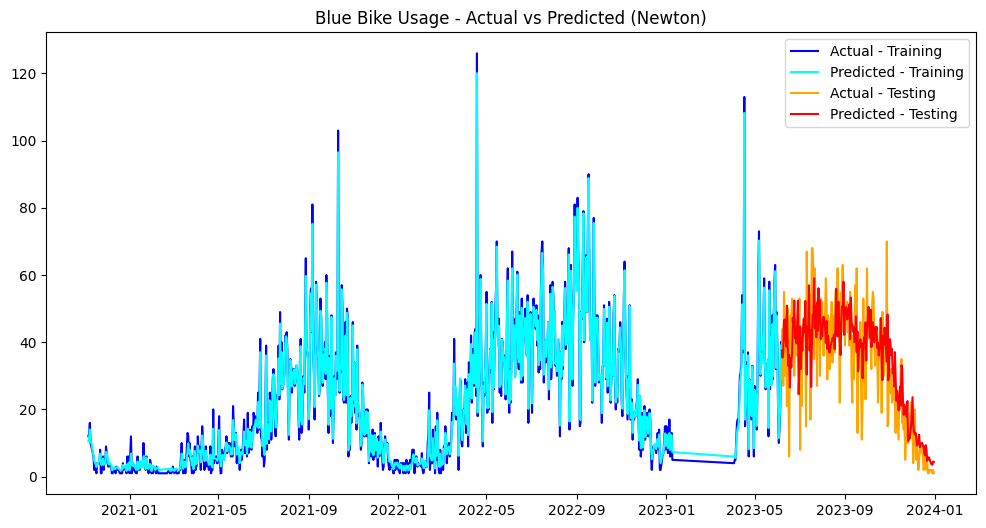


--- Forecasting for District: Revere ---
Train RMSE: 0.74
Test RMSE: 6.17
Ratio: 8.37


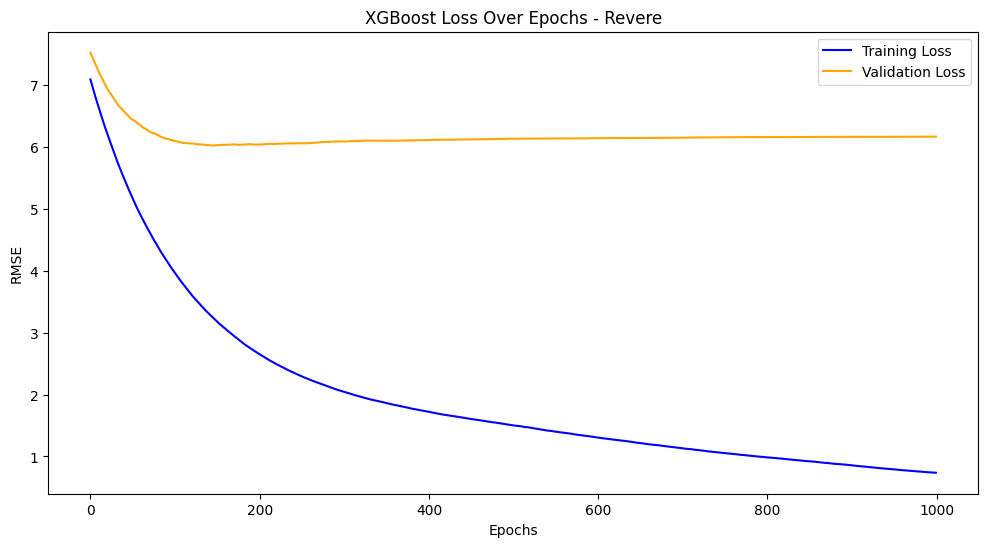

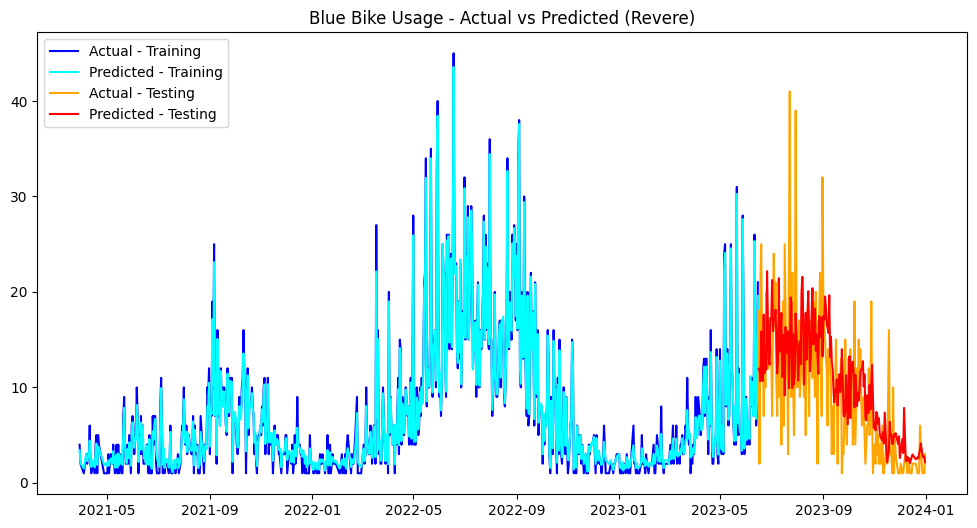


--- Forecasting for District: Salem ---
Train RMSE: 1.68
Test RMSE: 27.72
Ratio: 16.50


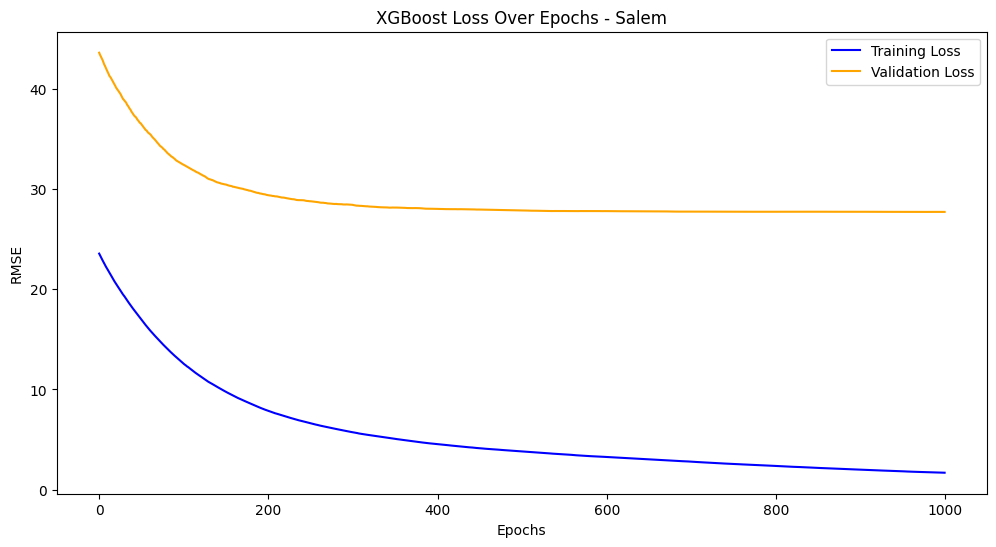

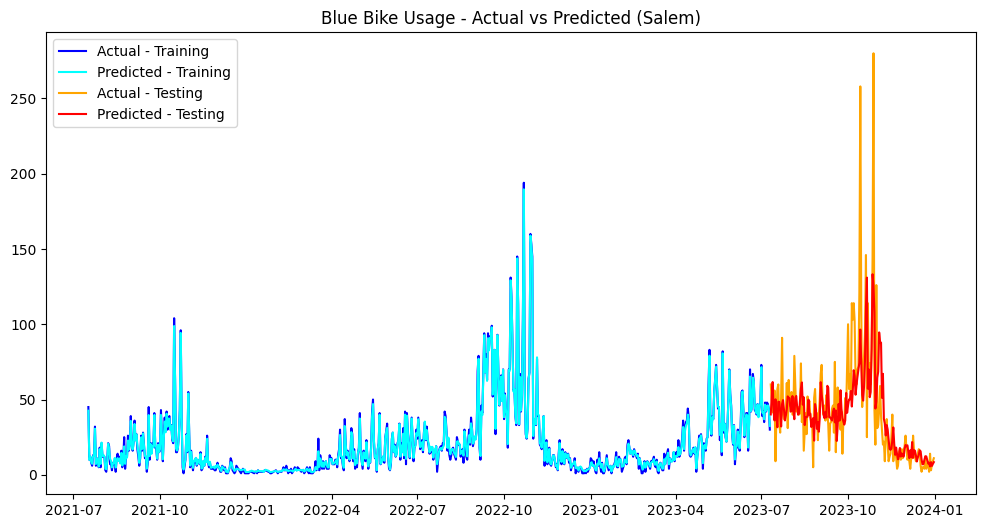


--- Forecasting for District: Somerville ---
Train RMSE: 23.35
Test RMSE: 139.87
Ratio: 5.99


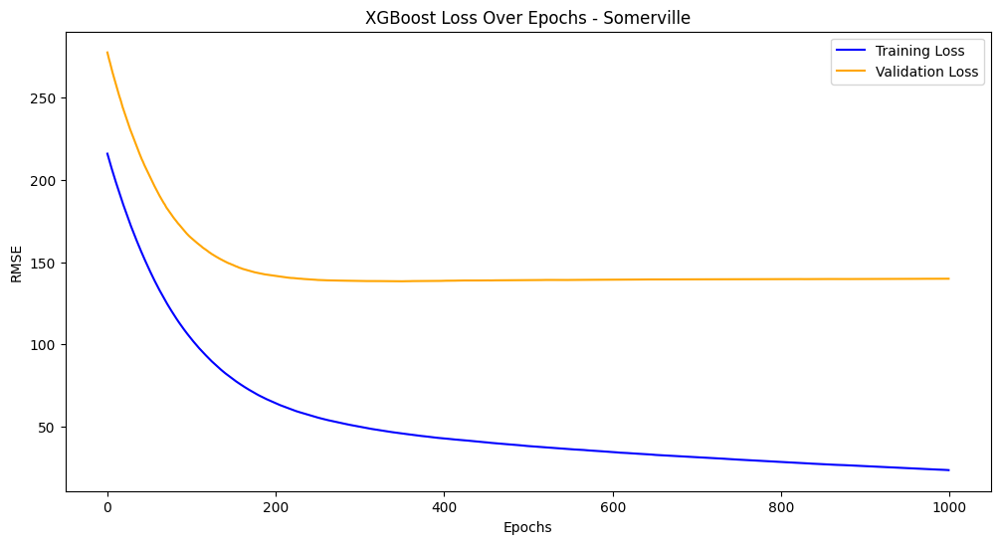

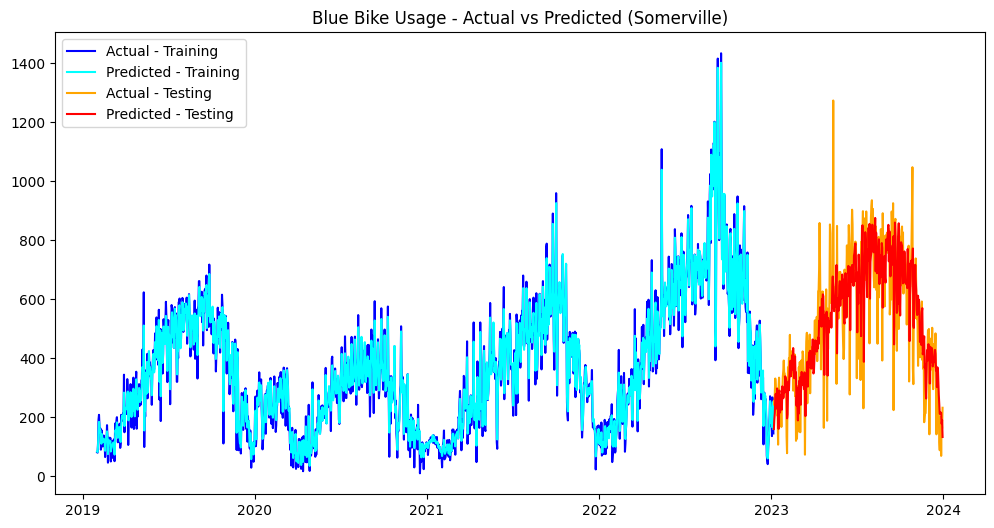


--- Forecasting for District: Watertown ---
Train RMSE: 1.80
Test RMSE: 14.76
Ratio: 8.19


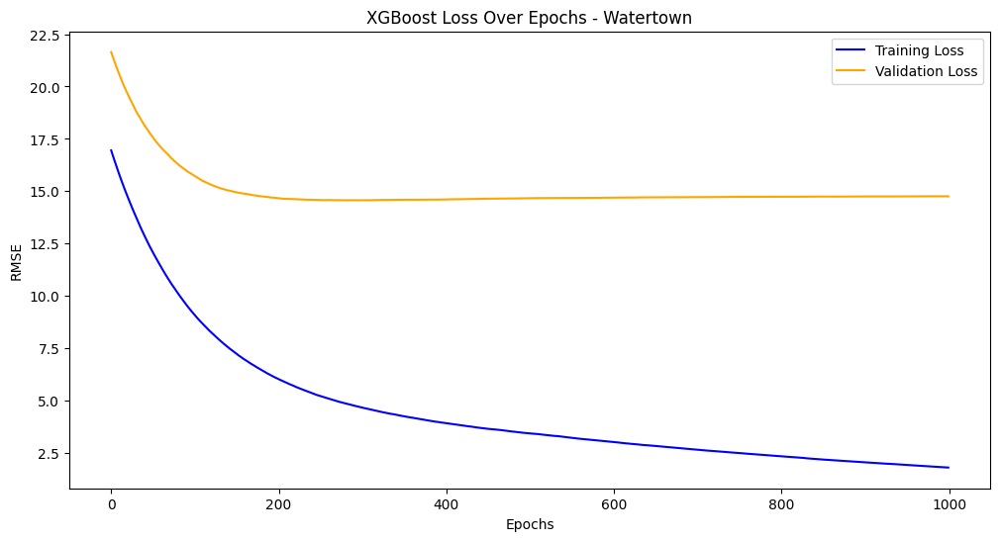

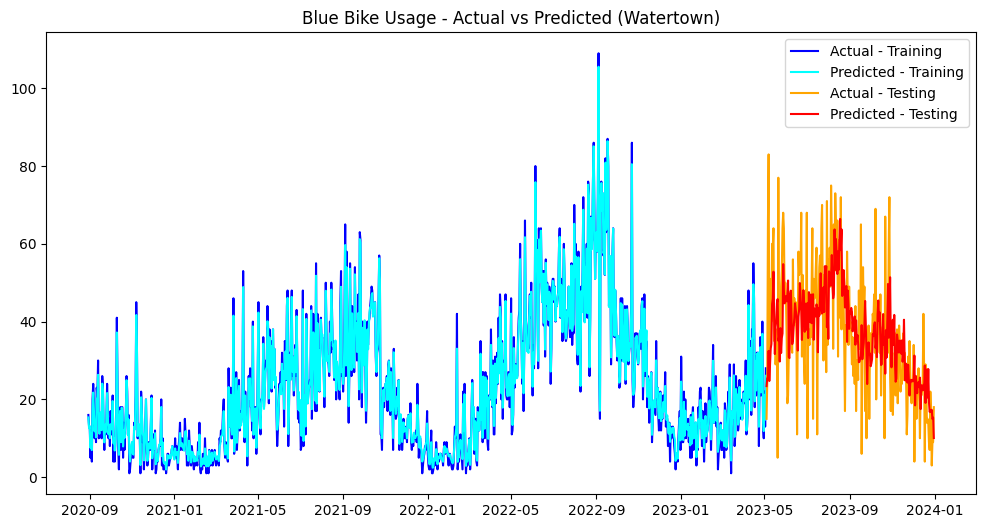


District: Arlington
  Train RMSE: 2.11
  Test RMSE: 14.73
  Test/Train RMSE: 6.98

District: Boston
  Train RMSE: 247.84
  Test RMSE: 1227.64
  Test/Train RMSE: 4.95

District: Brookline
  Train RMSE: 13.55
  Test RMSE: 68.09
  Test/Train RMSE: 5.02

District: Cambridge
  Train RMSE: 135.95
  Test RMSE: 842.71
  Test/Train RMSE: 6.20

District: Chelsea
  Train RMSE: 0.63
  Test RMSE: 4.66
  Test/Train RMSE: 7.34

District: Everett
  Train RMSE: 2.37
  Test RMSE: 15.30
  Test/Train RMSE: 6.47

District: Malden
  Train RMSE: 0.35
  Test RMSE: 4.75
  Test/Train RMSE: 13.43

District: Medford
  Train RMSE: 0.37
  Test RMSE: 8.71
  Test/Train RMSE: 23.55

District: Newton
  Train RMSE: 1.70
  Test RMSE: 12.19
  Test/Train RMSE: 7.17

District: Revere
  Train RMSE: 0.74
  Test RMSE: 6.17
  Test/Train RMSE: 8.37

District: Salem
  Train RMSE: 1.68
  Test RMSE: 27.72
  Test/Train RMSE: 16.50

District: Somerville
  Train RMSE: 23.35
  Test RMSE: 139.87
  Test/Train RMSE: 5.99

District: Water

In [46]:
# Load the original dataset (df2) and process for district-based forecasts
df2['date'] = df2['starttime'].dt.date  # Convert starttime to date
df2['date'] = pd.to_datetime(df2['date'])  # Ensure datetime format

# Group data by district and date, calculating total rides per day
df_grouped = df2.groupby(['District', 'date']).size().reset_index(name='Totalrides')

# Prepare lag features for each district
def create_lag_features_by_district(df, lag, target_col):
    districts = df['District'].unique()
    all_dfs = []
    for district in districts:
        district_df = df[df['District'] == district].copy()
        for i in range(1, lag + 1):
            district_df[f'lag_{i}'] = district_df[target_col].shift(i)
        all_dfs.append(district_df)
    return pd.concat(all_dfs)

# Add lag features
lag = 30  # Number of lag days to include
df_with_lags = create_lag_features_by_district(df_grouped, lag, target_col='Totalrides')

# Drop rows with NaN values caused by lagging
df_with_lags.dropna(inplace=True)

# Iterate over each district and train the XGBoost model
districts = df_with_lags['District'].unique()
results = {}

# Set the train-test ratio to 80/20 (train_ratio = 0.8)
train_ratio = 0.8

for district in districts:
    print(f"\n--- Forecasting for District: {district} ---")
    
    # Filter data for the current district
    district_data = df_with_lags[df_with_lags['District'] == district]
    
    # Sort data chronologically
    district_data = district_data.sort_values('date')
    
    # Determine the split index
    split_index = int(len(district_data) * train_ratio)
    
    # Split into training and testing sets
    train = district_data.iloc[:split_index]
    test = district_data.iloc[split_index:]
    
    # Define features and target
    X_train = train[[f'lag_{i}' for i in range(1, lag + 1)]]
    y_train = train['Totalrides']
    X_test = test[[f'lag_{i}' for i in range(1, lag + 1)]]
    y_test = test['Totalrides']
    
    # Initialize and train the XGBoost model
    xgb_model = XGBRegressor(
        n_estimators=1000,
        learning_rate=0.01,
        max_depth=6,
        subsample=0.8,
        colsample_bytree=0.8,
        random_state=42
    )
    
    xgb_model.fit(
        X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        verbose=False
    )
    
    # Make predictions
    train_predictions = xgb_model.predict(X_train)
    test_predictions = xgb_model.predict(X_test)
    
    # Calculate RMSE
    train_rmse = np.sqrt(mean_squared_error(y_train, train_predictions))
    test_rmse = np.sqrt(mean_squared_error(y_test, test_predictions))
    
    # Store results
    results[district] = {
        "model": xgb_model,
        "train_rmse": train_rmse,
        "test_rmse": test_rmse,
        "train_predictions": train_predictions,
        "test_predictions": test_predictions,
        "X_train": X_train,
        "X_test": X_test,
        "y_train": y_train,
        "y_test": y_test,
        "train_dates": train['date'],
        "test_dates": test['date']
    }
    
    # Print RMSE for the district
    print(f"Train RMSE: {train_rmse:.2f}")
    print(f"Test RMSE: {test_rmse:.2f}")
    print(f"Ratio: {(test_rmse/train_rmse):.2f}")
    
    # Plot training and validation loss
    results_eval = xgb_model.evals_result_
    plt.figure(figsize=(12, 6))
    plt.plot(results_eval['validation_0']['rmse'], label='Training Loss', color='blue')
    plt.plot(results_eval['validation_1']['rmse'], label='Validation Loss', color='orange')
    plt.title(f'XGBoost Loss Over Epochs - {district}')
    plt.xlabel('Epochs')
    plt.ylabel('RMSE')
    plt.legend()
    plt.show()
    
    # Plot actual vs predicted
    plt.figure(figsize=(12, 6))
    plt.plot(train['date'], y_train, label="Actual - Training", color="blue")
    plt.plot(train['date'], train_predictions, label="Predicted - Training", color="cyan")
    plt.plot(test['date'], y_test, label="Actual - Testing", color="orange")
    plt.plot(test['date'], test_predictions, label="Predicted - Testing", color="red")
    plt.title(f"Blue Bike Usage - Actual vs Predicted ({district})")
    plt.legend()
    plt.show()

# Display overall results summary
for district, result in results.items():
    print(f"\nDistrict: {district}")
    print(f"  Train RMSE: {result['train_rmse']:.2f}")
    print(f"  Test RMSE: {result['test_rmse']:.2f}")
    print(f"  Test/Train RMSE: {(result['test_rmse']/result['train_rmse']):.2f}")

### Fine-Tuned Hyperparameters


--- Forecasting for District: Arlington ---
Train RMSE: 7.31
Test RMSE: 14.69
Ratio: 2.01


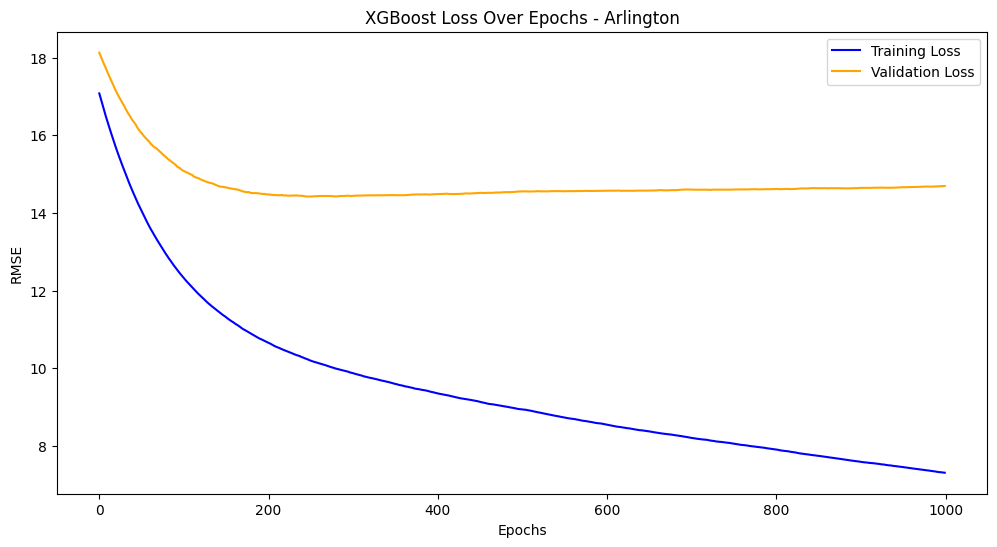

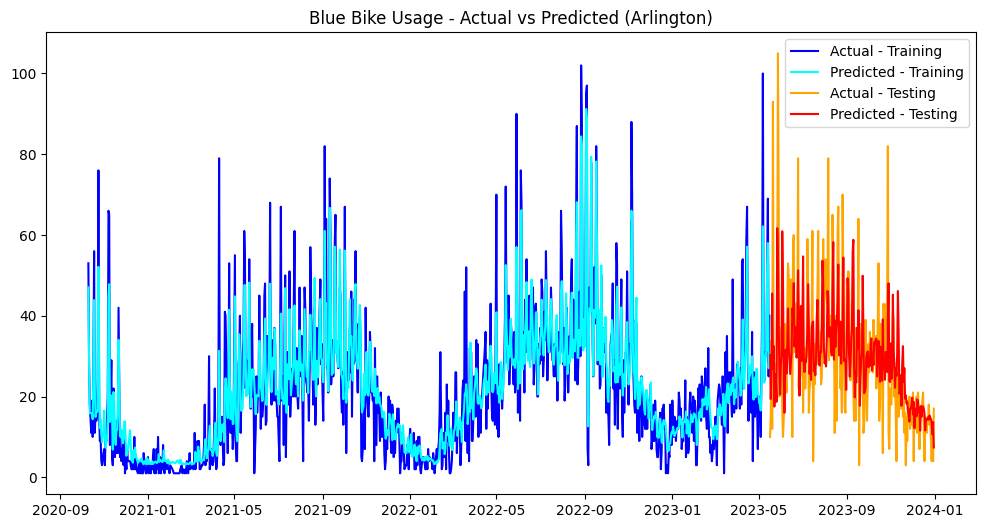


--- Forecasting for District: Boston ---
Train RMSE: 684.20
Test RMSE: 1231.17
Ratio: 1.80


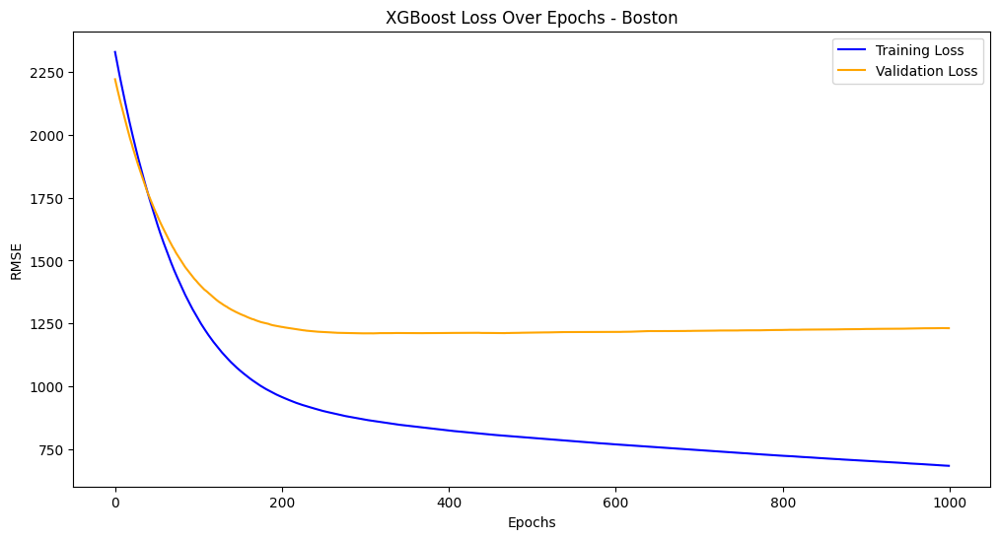

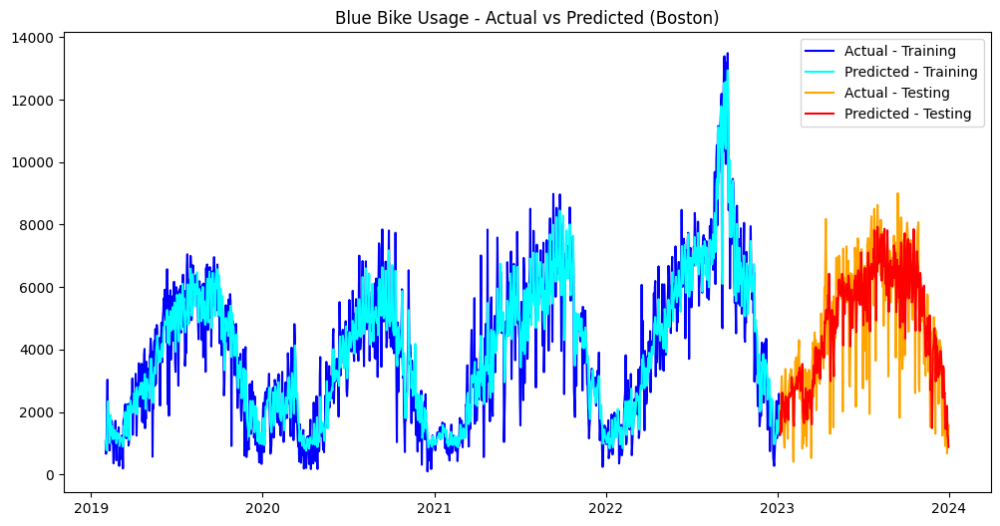


--- Forecasting for District: Brookline ---
Train RMSE: 37.35
Test RMSE: 67.65
Ratio: 1.81


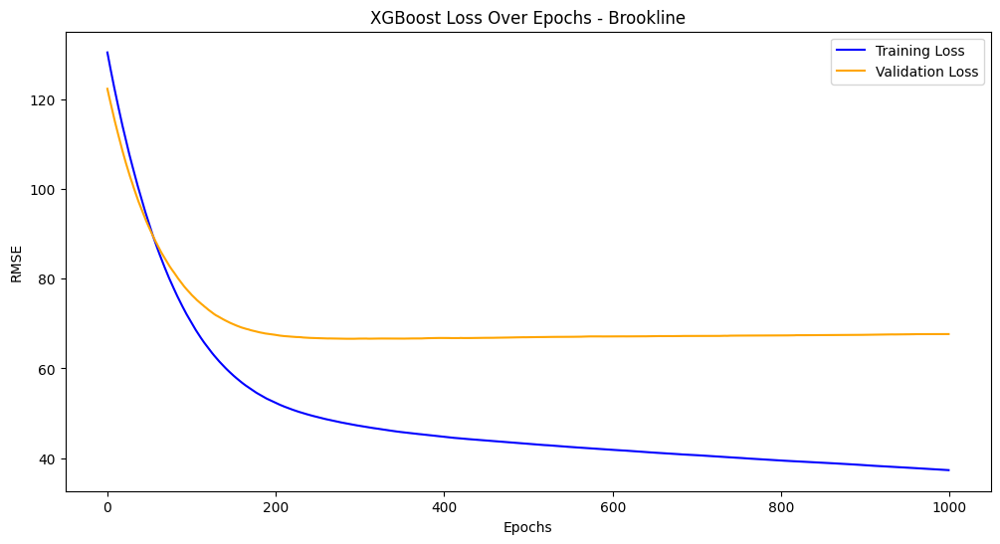

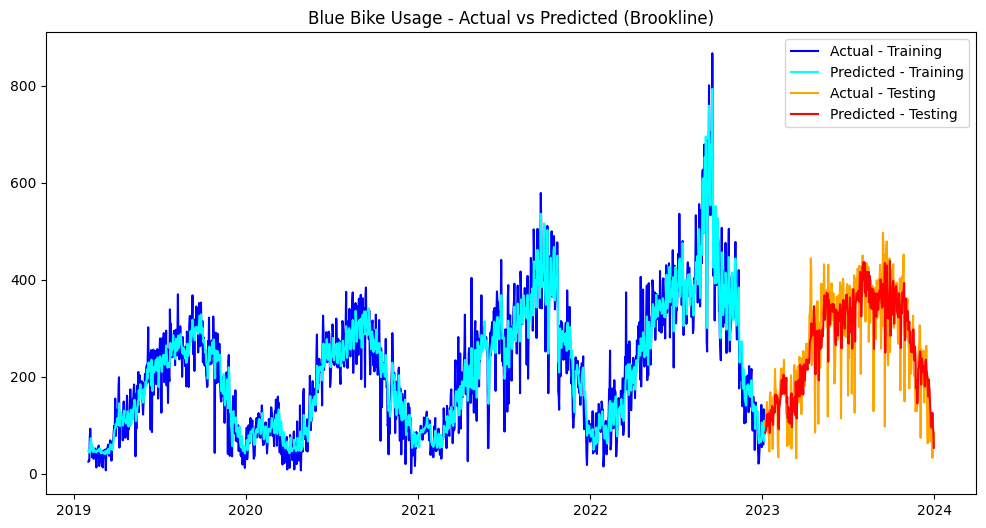


--- Forecasting for District: Cambridge ---
Train RMSE: 383.16
Test RMSE: 841.30
Ratio: 2.20


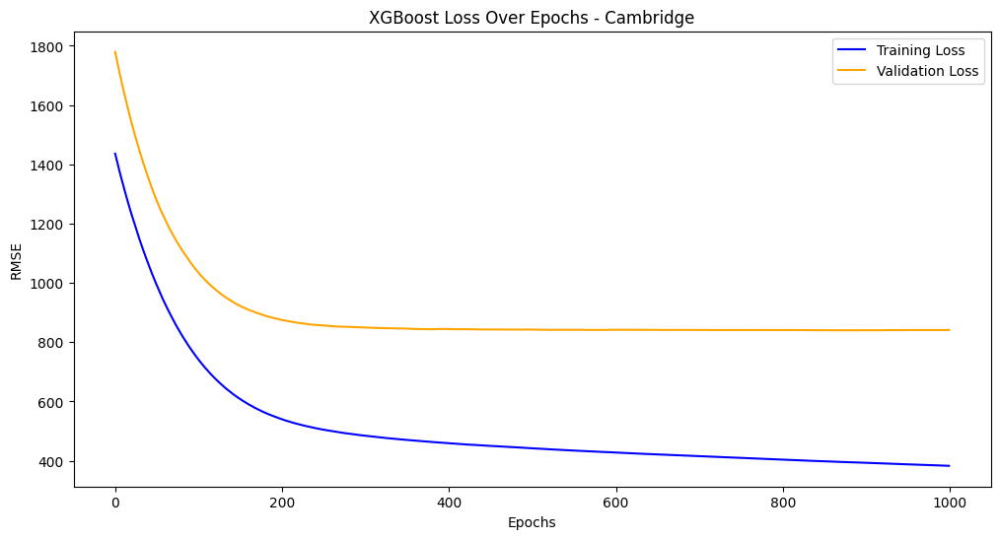

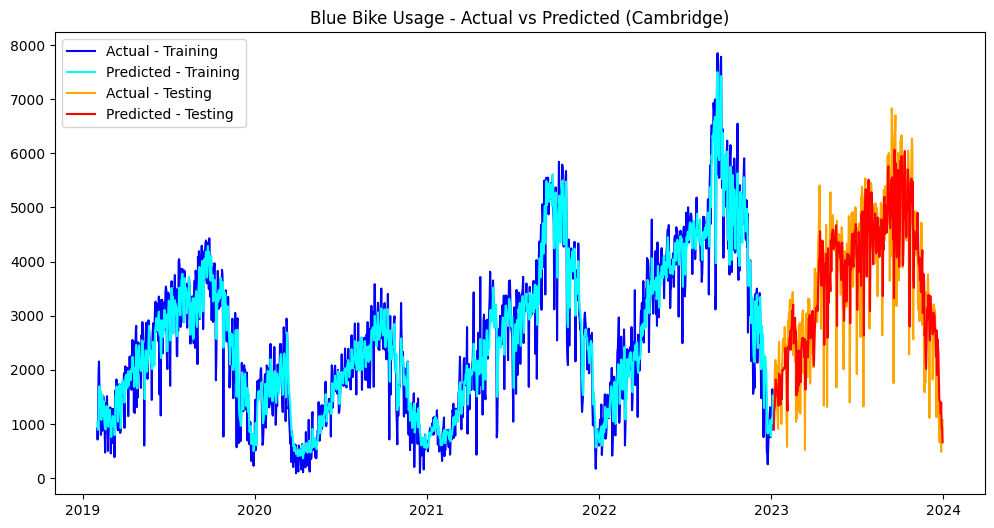


--- Forecasting for District: Chelsea ---
Train RMSE: 2.52
Test RMSE: 4.57
Ratio: 1.82


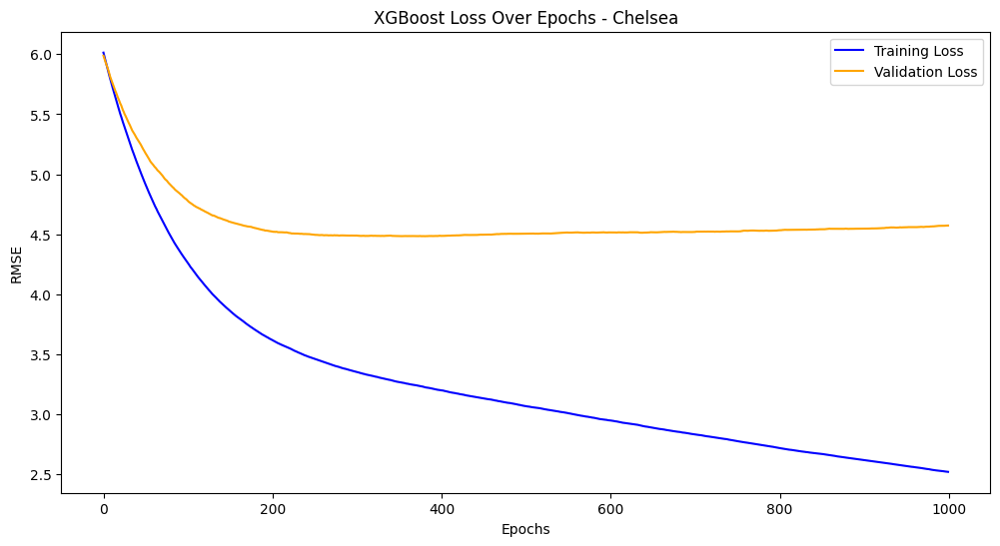

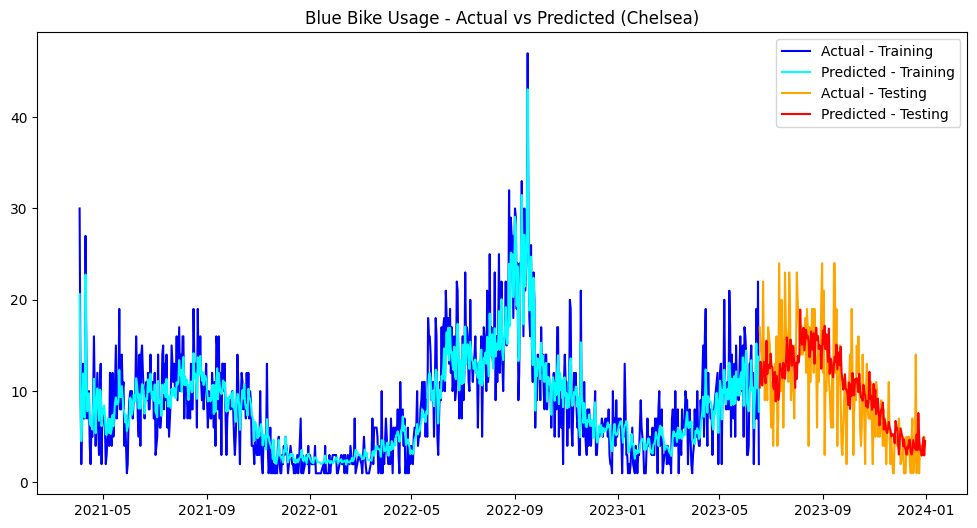


--- Forecasting for District: Everett ---
Train RMSE: 6.76
Test RMSE: 14.87
Ratio: 2.20


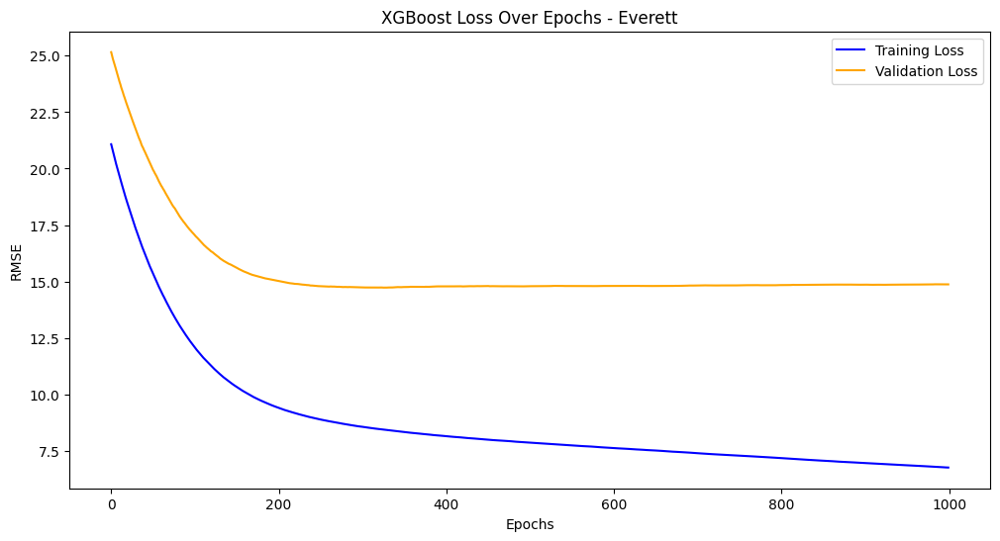

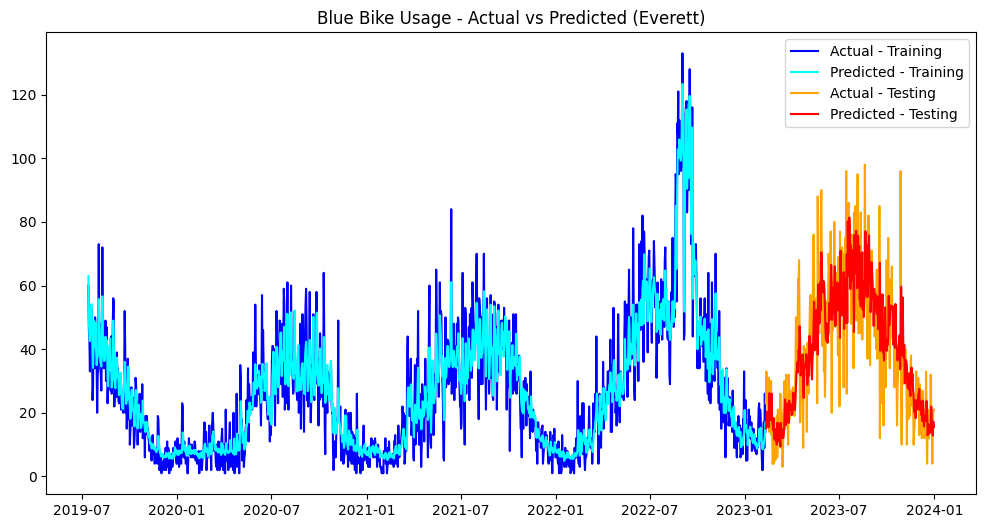


--- Forecasting for District: Malden ---
Train RMSE: 2.17
Test RMSE: 4.65
Ratio: 2.14


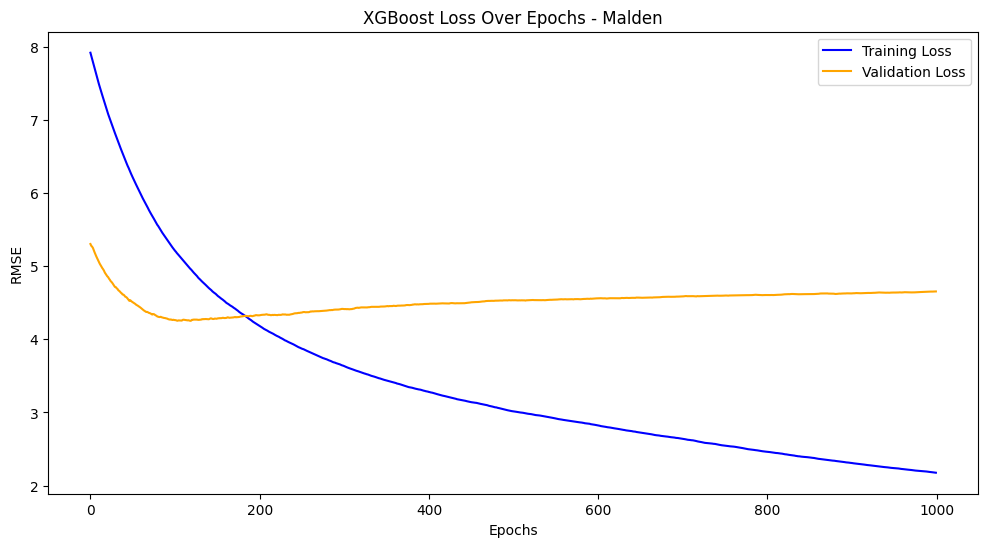

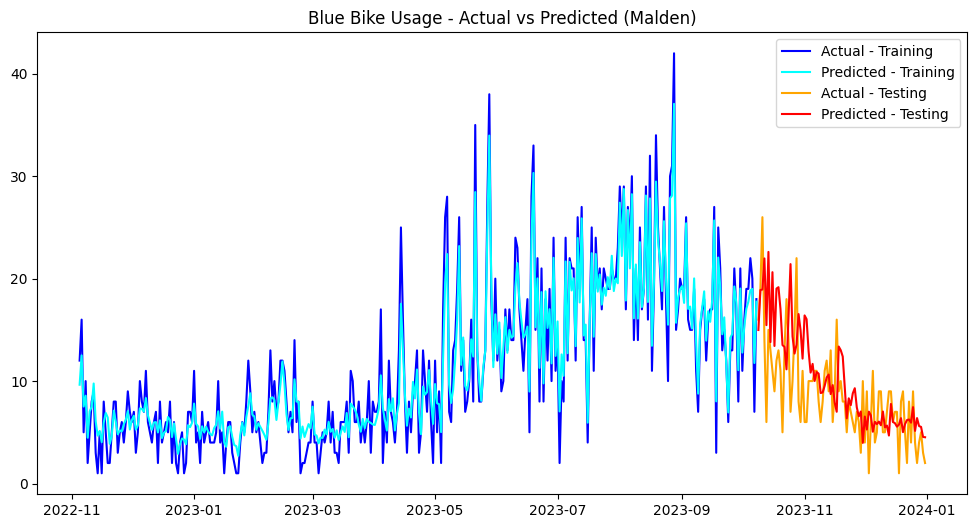


--- Forecasting for District: Medford ---
Train RMSE: 2.61
Test RMSE: 8.90
Ratio: 3.41


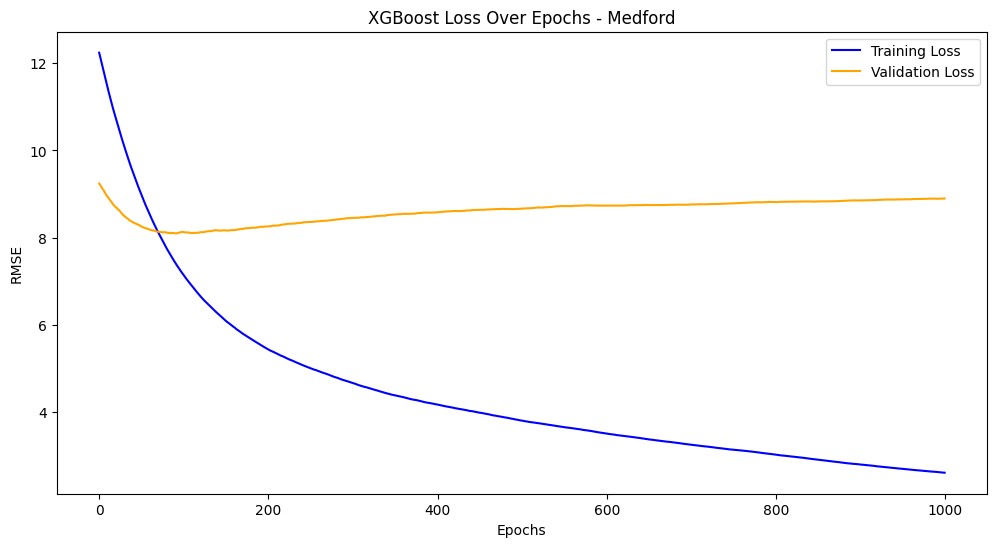

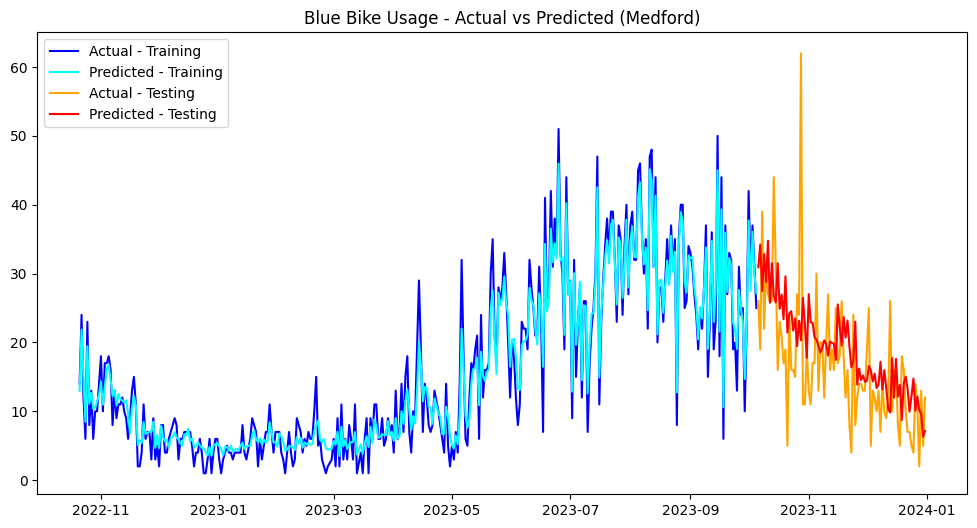


--- Forecasting for District: Newton ---
Train RMSE: 6.49
Test RMSE: 12.11
Ratio: 1.87


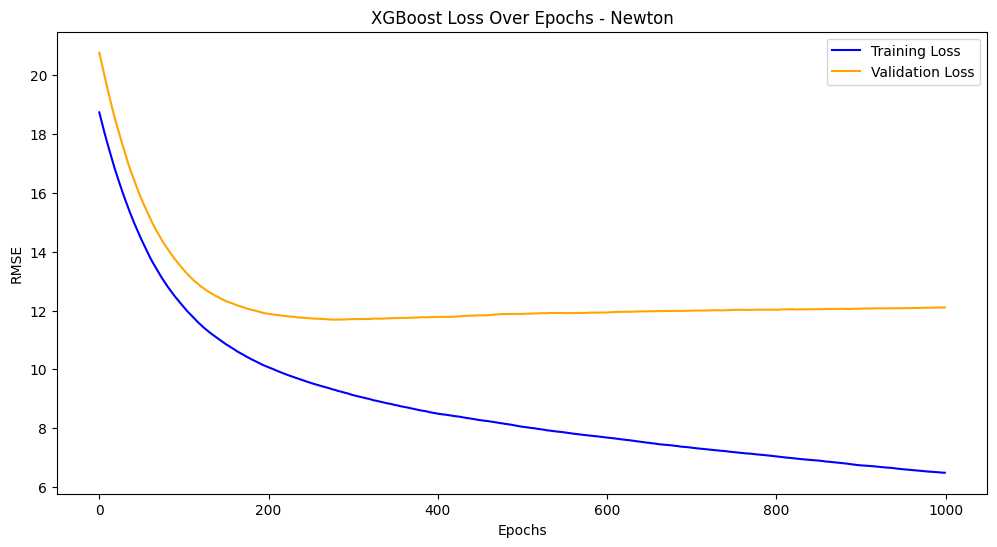

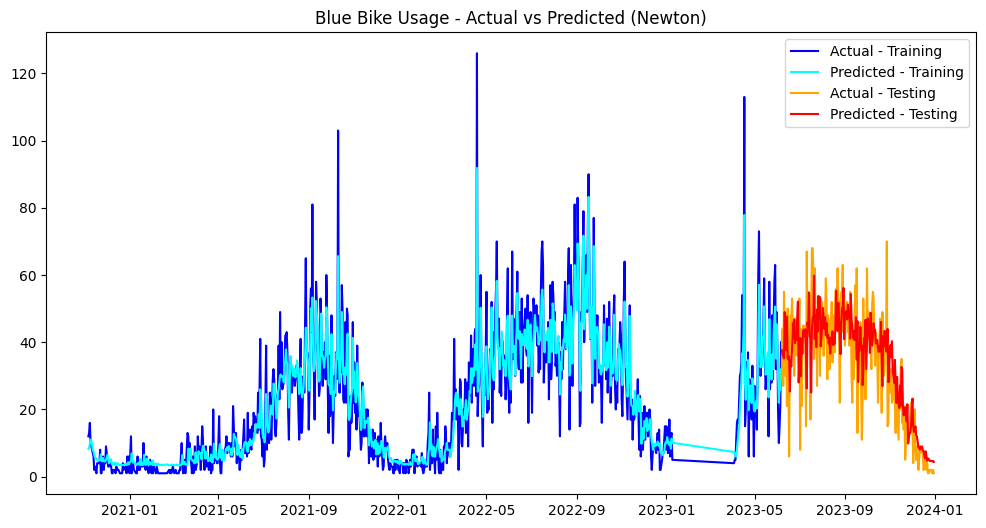


--- Forecasting for District: Revere ---
Train RMSE: 2.65
Test RMSE: 5.93
Ratio: 2.24


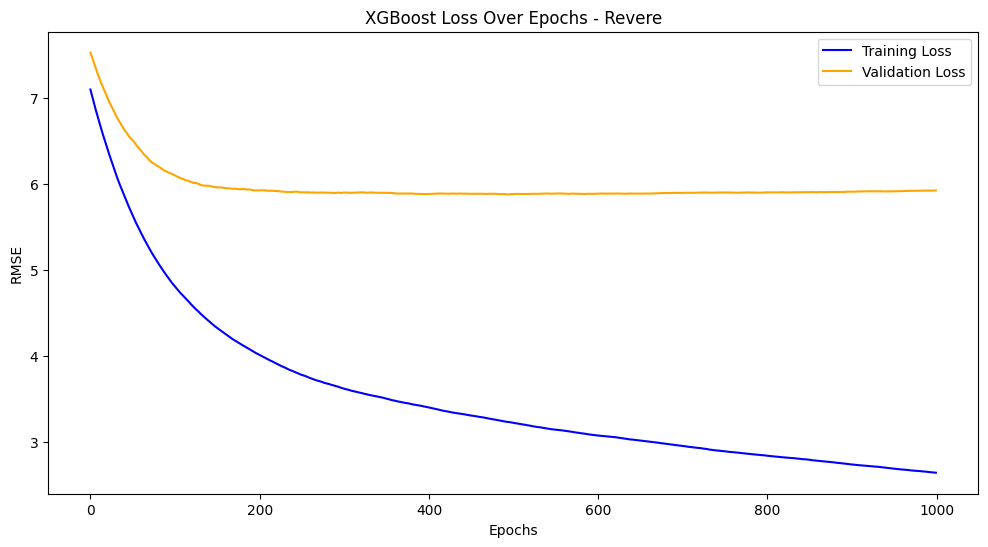

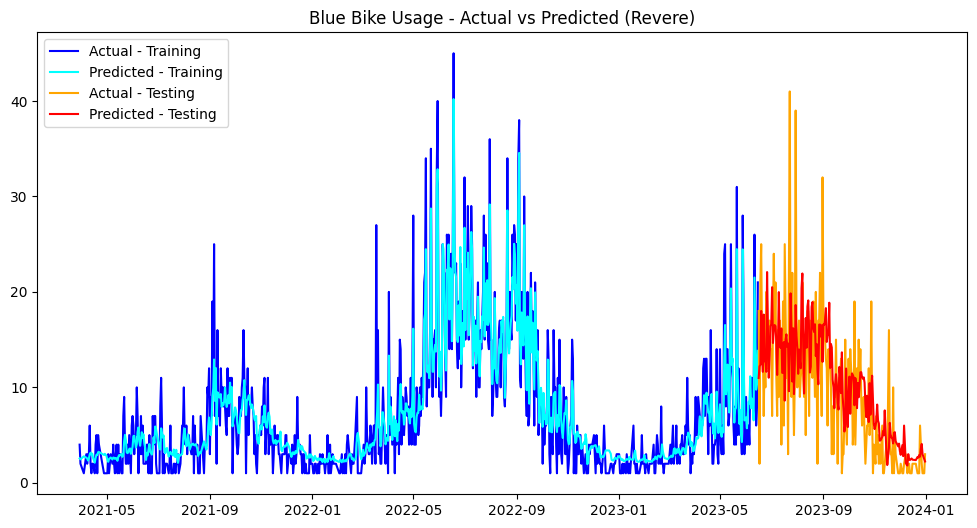


--- Forecasting for District: Salem ---
Train RMSE: 6.47
Test RMSE: 27.33
Ratio: 4.22


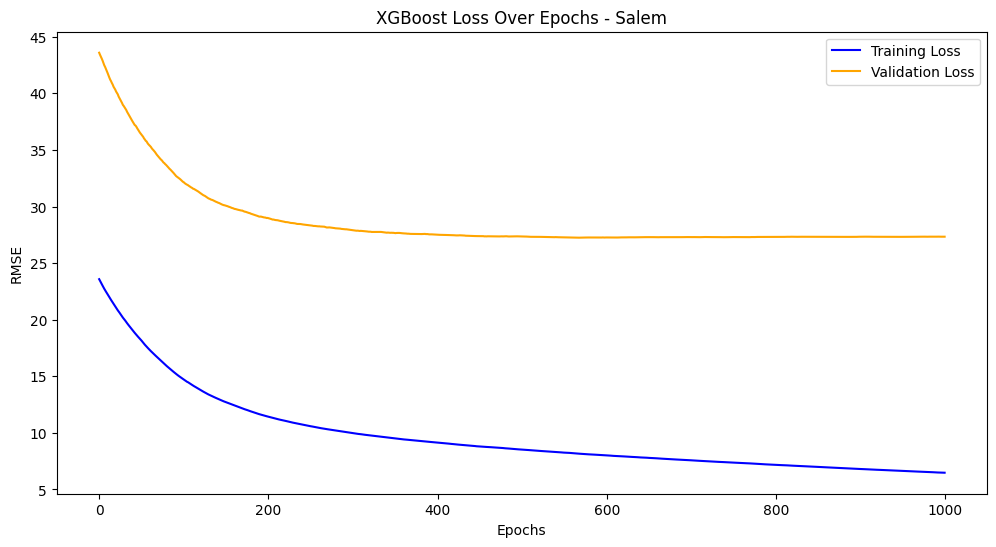

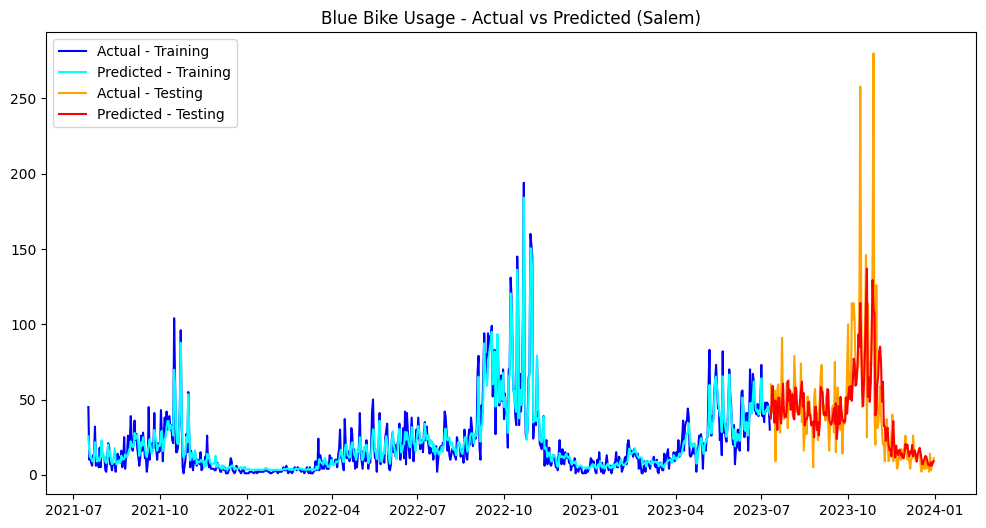


--- Forecasting for District: Somerville ---
Train RMSE: 61.94
Test RMSE: 140.30
Ratio: 2.27


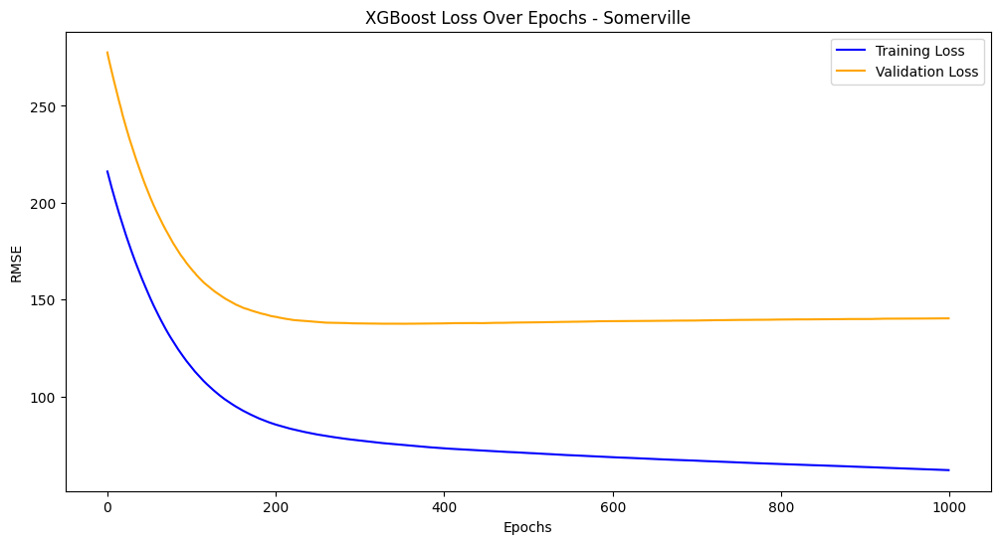

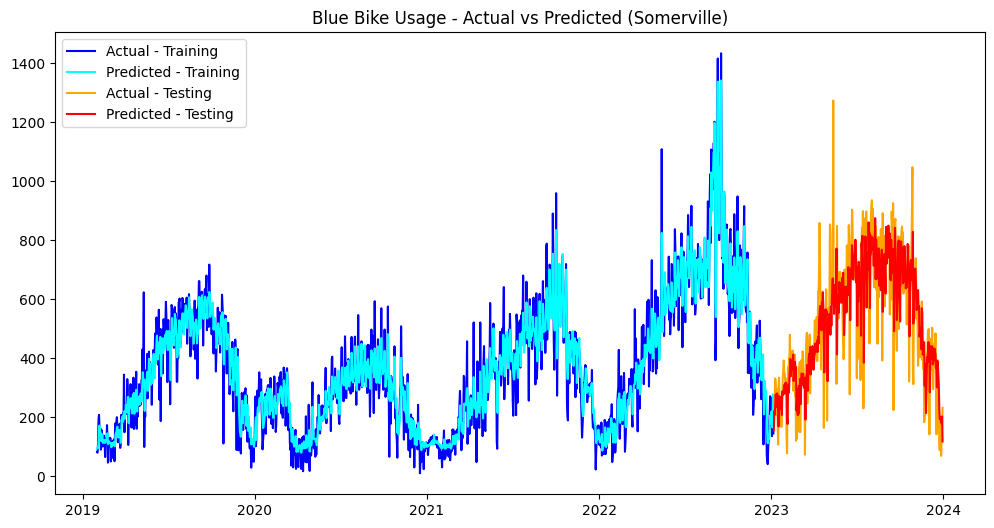


--- Forecasting for District: Watertown ---
Train RMSE: 6.10
Test RMSE: 14.86
Ratio: 2.43


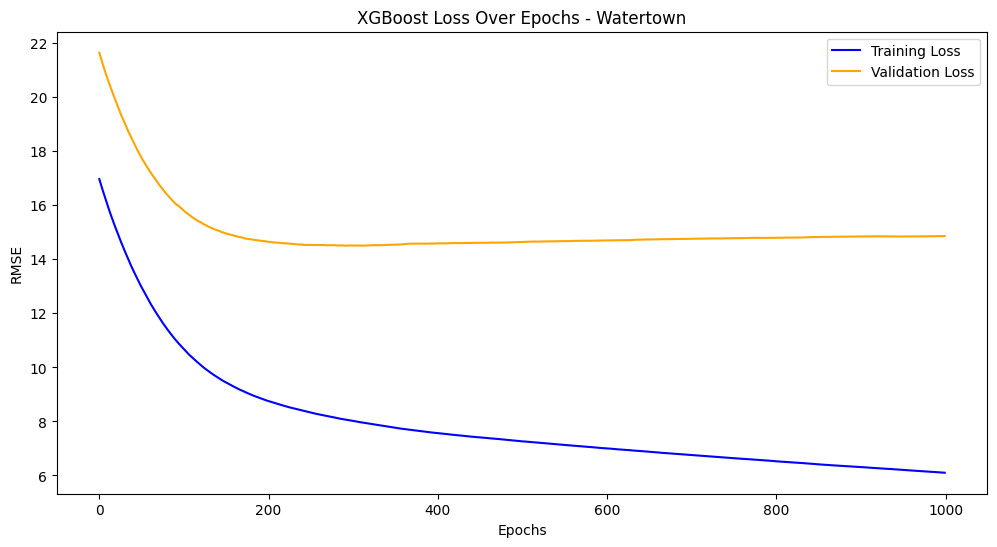

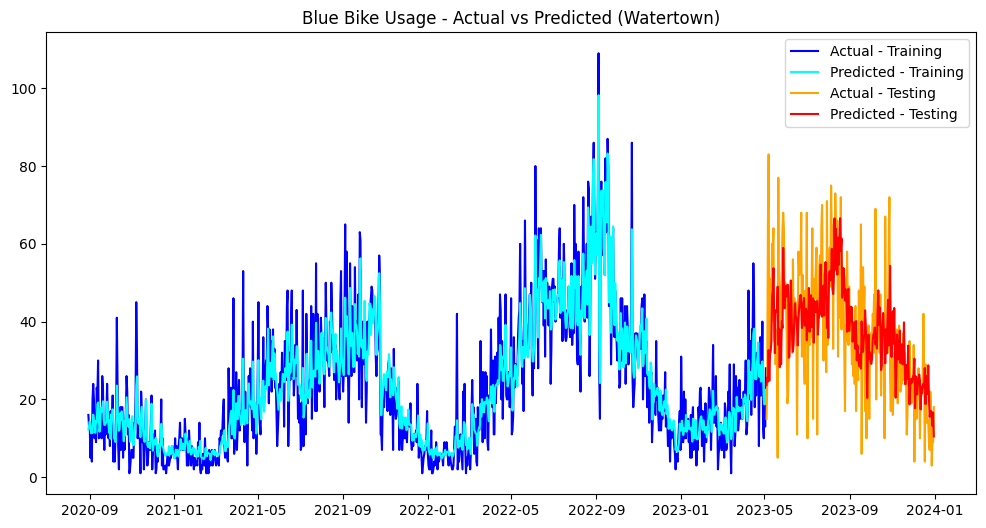


District: Arlington
  Train RMSE: 7.31
  Test RMSE: 14.69
  Test/Train RMSE: 2.01

District: Boston
  Train RMSE: 684.20
  Test RMSE: 1231.17
  Test/Train RMSE: 1.80

District: Brookline
  Train RMSE: 37.35
  Test RMSE: 67.65
  Test/Train RMSE: 1.81

District: Cambridge
  Train RMSE: 383.16
  Test RMSE: 841.30
  Test/Train RMSE: 2.20

District: Chelsea
  Train RMSE: 2.52
  Test RMSE: 4.57
  Test/Train RMSE: 1.82

District: Everett
  Train RMSE: 6.76
  Test RMSE: 14.87
  Test/Train RMSE: 2.20

District: Malden
  Train RMSE: 2.17
  Test RMSE: 4.65
  Test/Train RMSE: 2.14

District: Medford
  Train RMSE: 2.61
  Test RMSE: 8.90
  Test/Train RMSE: 3.41

District: Newton
  Train RMSE: 6.49
  Test RMSE: 12.11
  Test/Train RMSE: 1.87

District: Revere
  Train RMSE: 2.65
  Test RMSE: 5.93
  Test/Train RMSE: 2.24

District: Salem
  Train RMSE: 6.47
  Test RMSE: 27.33
  Test/Train RMSE: 4.22

District: Somerville
  Train RMSE: 61.94
  Test RMSE: 140.30
  Test/Train RMSE: 2.27

District: Watertow

In [41]:
results = {}

# Set the train-test ratio to 80/20 (train_ratio = 0.8)
train_ratio = 0.8

for district in districts:
    print(f"\n--- Forecasting for District: {district} ---")
    
    # Filter data for the current district
    district_data = df_with_lags[df_with_lags['District'] == district]
    
    # Sort data chronologically
    district_data = district_data.sort_values('date')
    
    # Determine the split index
    split_index = int(len(district_data) * train_ratio)
    
    # Split into training and testing sets
    train = district_data.iloc[:split_index]
    test = district_data.iloc[split_index:]
    
    # Define features and target
    X_train = train[[f'lag_{i}' for i in range(1, lag + 1)]]
    y_train = train['Totalrides']
    X_test = test[[f'lag_{i}' for i in range(1, lag + 1)]]
    y_test = test['Totalrides']
    
    # Initialize and train the XGBoost model
    xgb_model = XGBRegressor(
        n_estimators=1000,
        learning_rate=0.01,
        max_depth=3,
        subsample=0.8,
        colsample_bytree=0.8,
        random_state=42
    )
    
    xgb_model.fit(
        X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        verbose=False
    )
    
    # Make predictions
    train_predictions = xgb_model.predict(X_train)
    test_predictions = xgb_model.predict(X_test)
    
    # Calculate RMSE
    train_rmse = np.sqrt(mean_squared_error(y_train, train_predictions))
    test_rmse = np.sqrt(mean_squared_error(y_test, test_predictions))
    
    # Store results
    results[district] = {
        "model": xgb_model,
        "train_rmse": train_rmse,
        "test_rmse": test_rmse,
        "train_predictions": train_predictions,
        "test_predictions": test_predictions,
        "X_train": X_train,
        "X_test": X_test,
        "y_train": y_train,
        "y_test": y_test,
        "train_dates": train['date'],
        "test_dates": test['date']
    }
    
    # Print RMSE for the district
    print(f"Train RMSE: {train_rmse:.2f}")
    print(f"Test RMSE: {test_rmse:.2f}")
    print(f"Ratio: {(test_rmse/train_rmse):.2f}")
    
    # Plot training and validation loss
    results_eval = xgb_model.evals_result_
    plt.figure(figsize=(12, 6))
    plt.plot(results_eval['validation_0']['rmse'], label='Training Loss', color='blue')
    plt.plot(results_eval['validation_1']['rmse'], label='Validation Loss', color='orange')
    plt.title(f'XGBoost Loss Over Epochs - {district}')
    plt.xlabel('Epochs')
    plt.ylabel('RMSE')
    plt.legend()
    plt.show()
    
    # Plot actual vs predicted
    plt.figure(figsize=(12, 6))
    plt.plot(train['date'], y_train, label="Actual - Training", color="blue")
    plt.plot(train['date'], train_predictions, label="Predicted - Training", color="cyan")
    plt.plot(test['date'], y_test, label="Actual - Testing", color="orange")
    plt.plot(test['date'], test_predictions, label="Predicted - Testing", color="red")
    plt.title(f"Blue Bike Usage - Actual vs Predicted ({district})")
    plt.legend()
    plt.show()

# Display overall results summary
for district, result in results.items():
    print(f"\nDistrict: {district}")
    print(f"  Train RMSE: {result['train_rmse']:.2f}")
    print(f"  Test RMSE: {result['test_rmse']:.2f}")
    print(f"  Test/Train RMSE: {(result['test_rmse']/result['train_rmse']):.2f}")

### Predictions Per District with Data Augmentation - Noise Injection and Scaling


--- Forecasting for District: Arlington ---
Train RMSE: 7.30
Test RMSE: 14.70
Ratio: 2.01


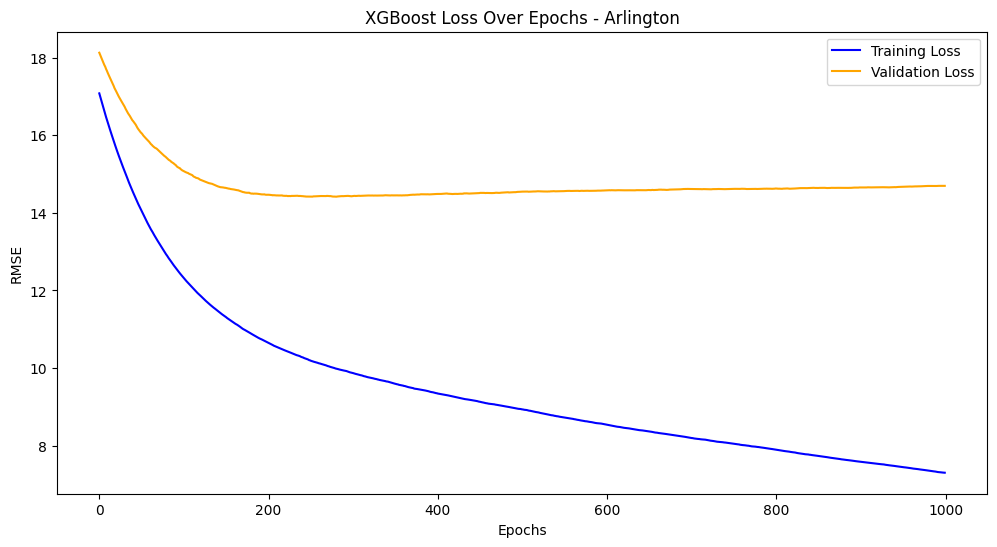

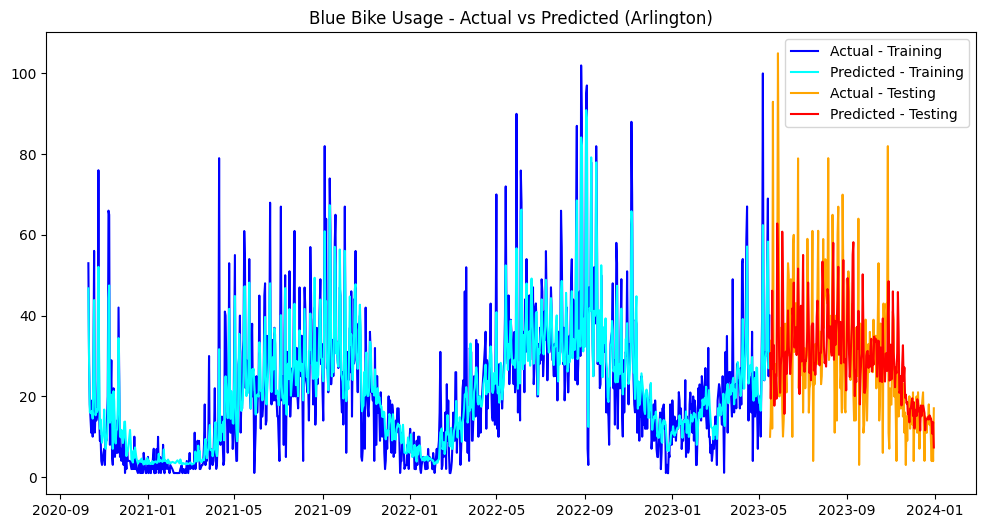


--- Forecasting for District: Boston ---
Train RMSE: 684.20
Test RMSE: 1231.17
Ratio: 1.80


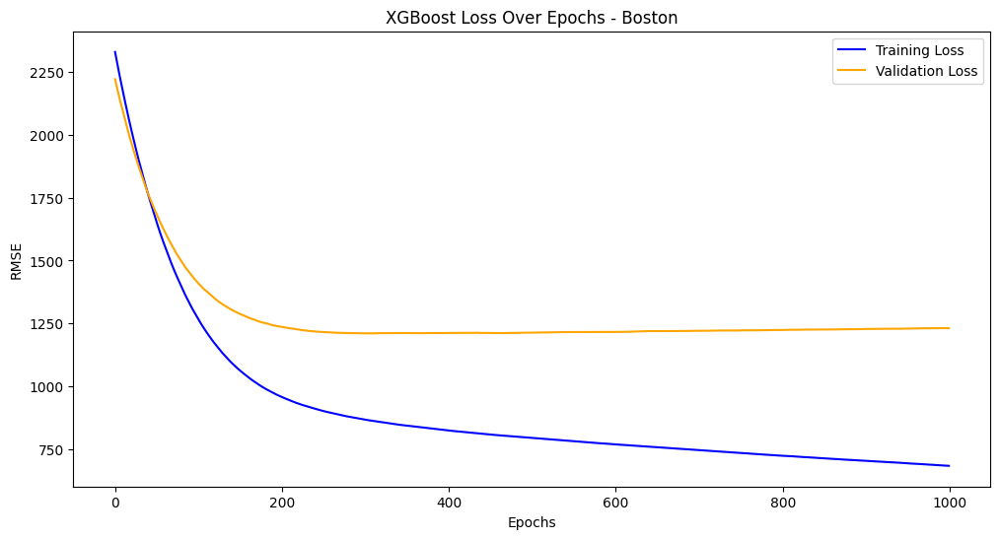

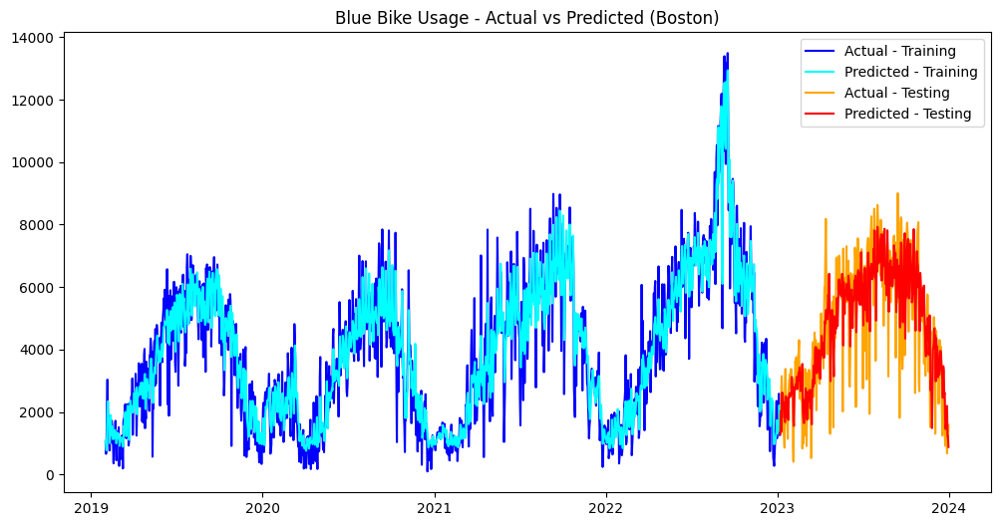


--- Forecasting for District: Brookline ---
Train RMSE: 37.37
Test RMSE: 67.61
Ratio: 1.81


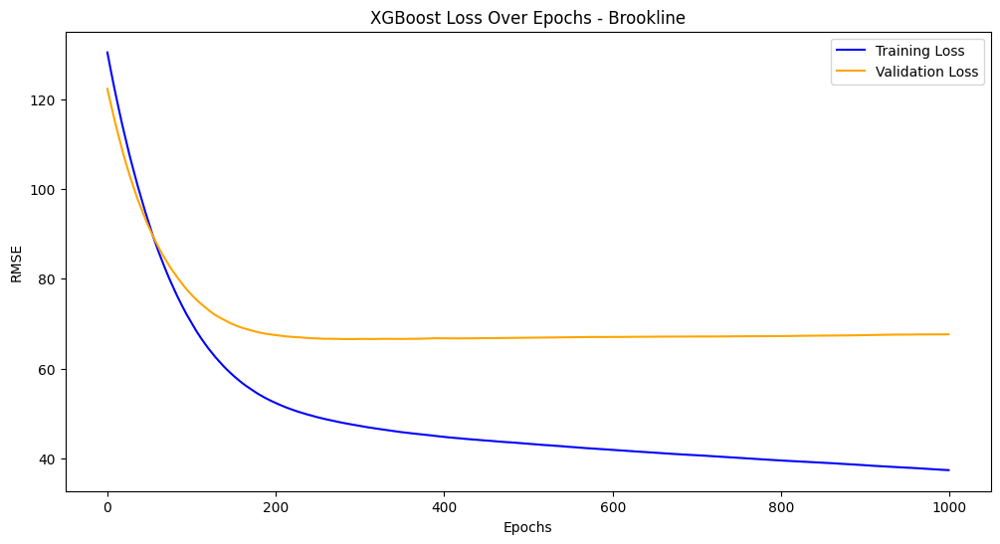

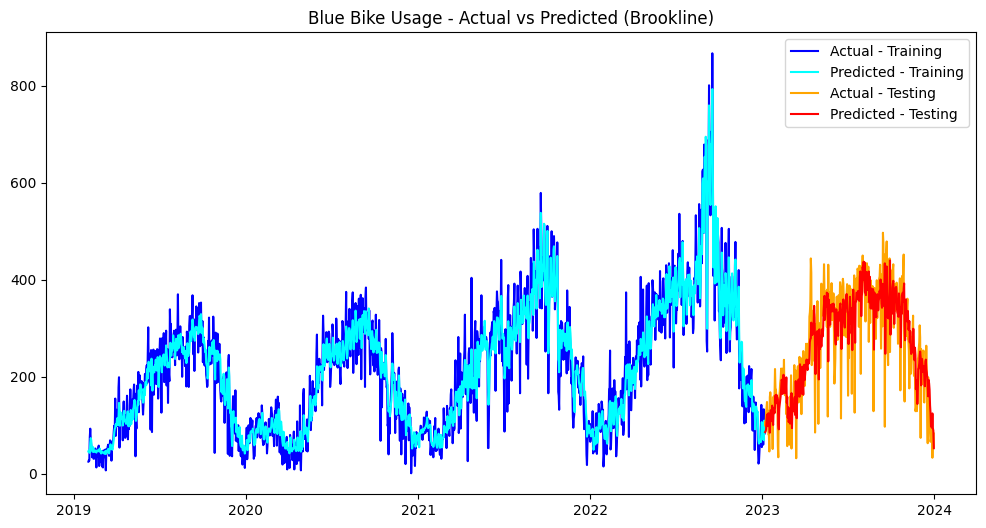


--- Forecasting for District: Cambridge ---
Train RMSE: 383.16
Test RMSE: 841.97
Ratio: 2.20


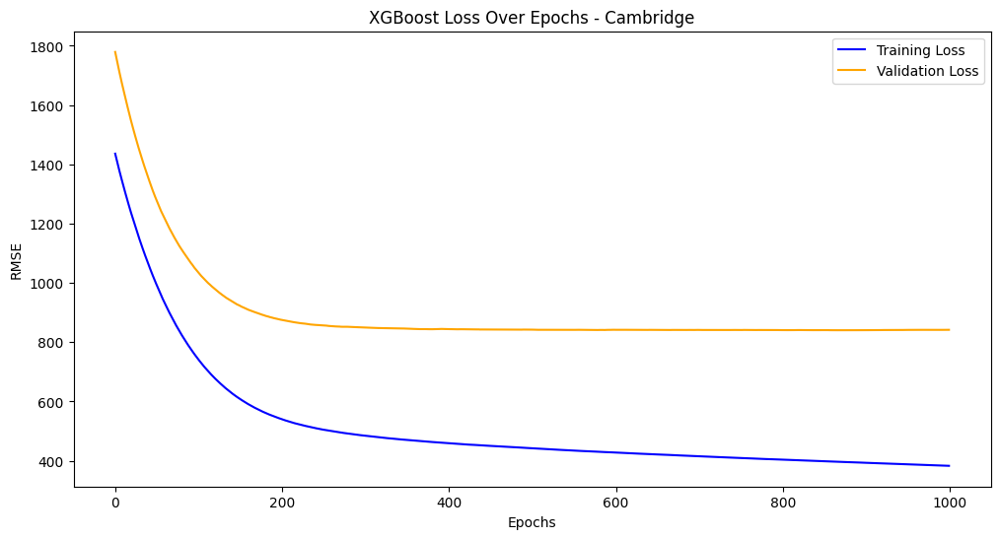

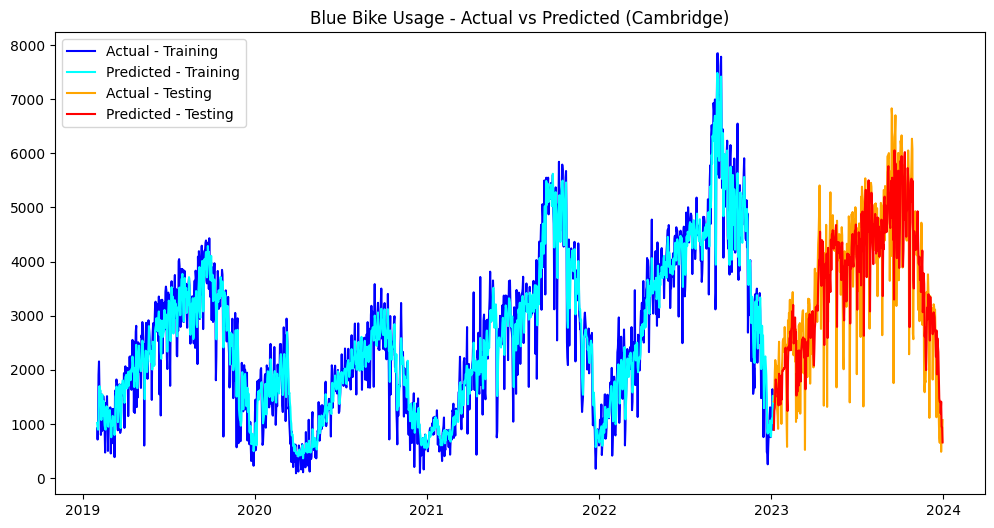


--- Forecasting for District: Chelsea ---
Train RMSE: 2.52
Test RMSE: 4.58
Ratio: 1.82


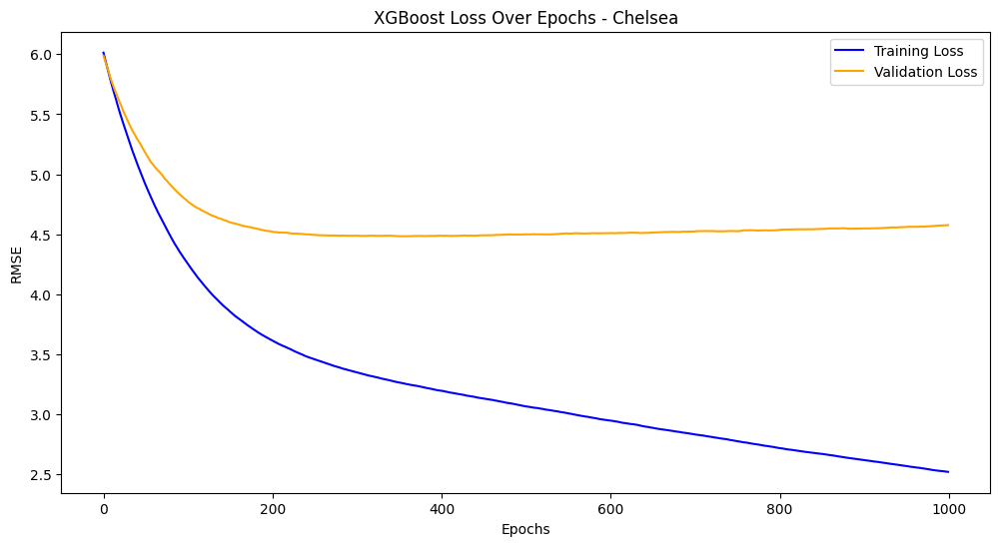

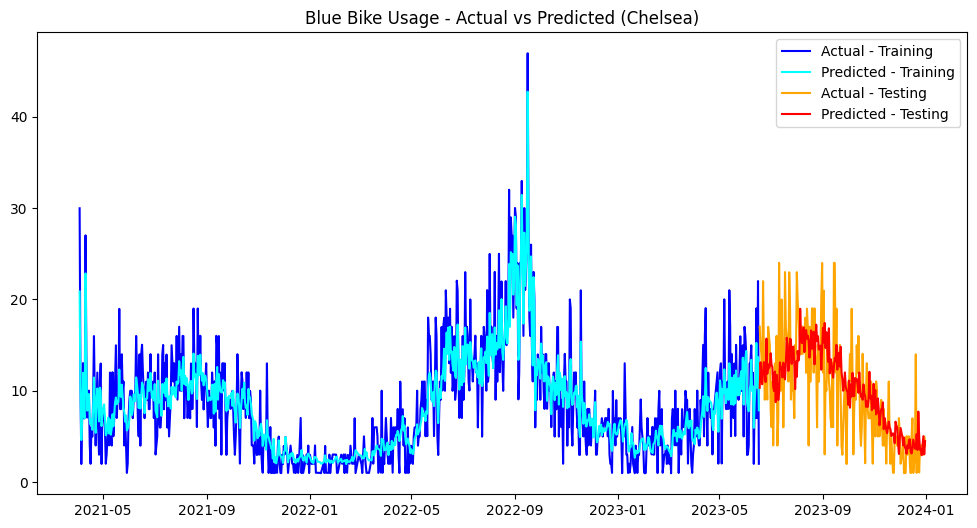


--- Forecasting for District: Everett ---
Train RMSE: 6.76
Test RMSE: 14.87
Ratio: 2.20


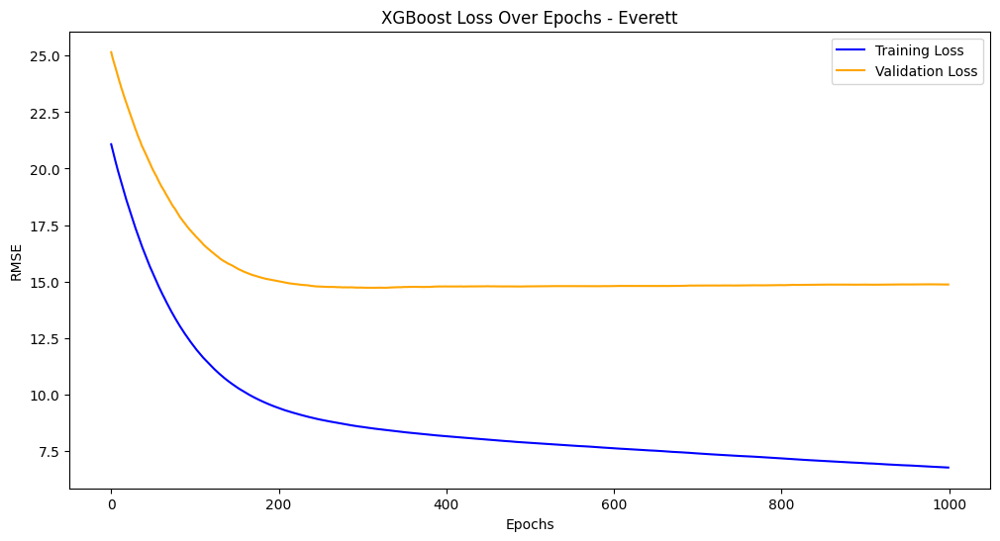

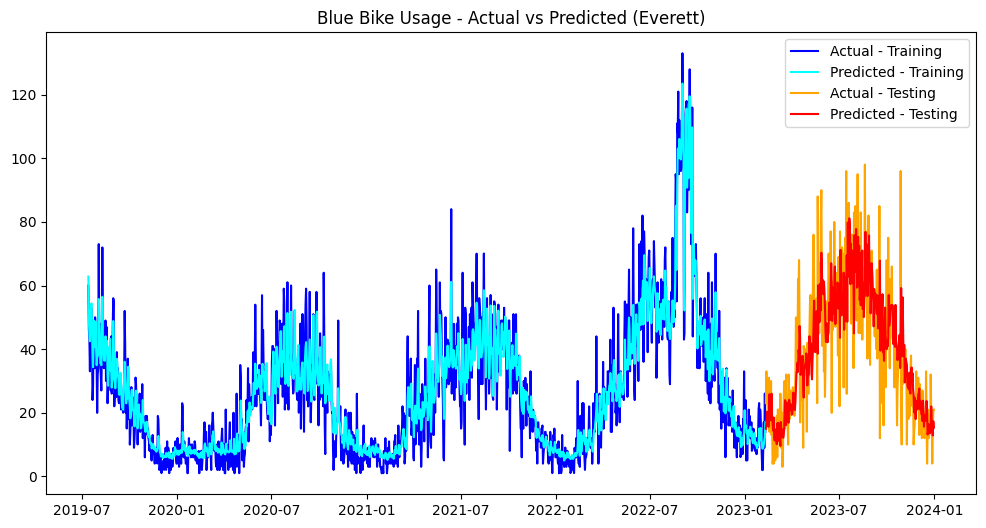


--- Forecasting for District: Malden ---
Train RMSE: 2.17
Test RMSE: 4.65
Ratio: 2.14


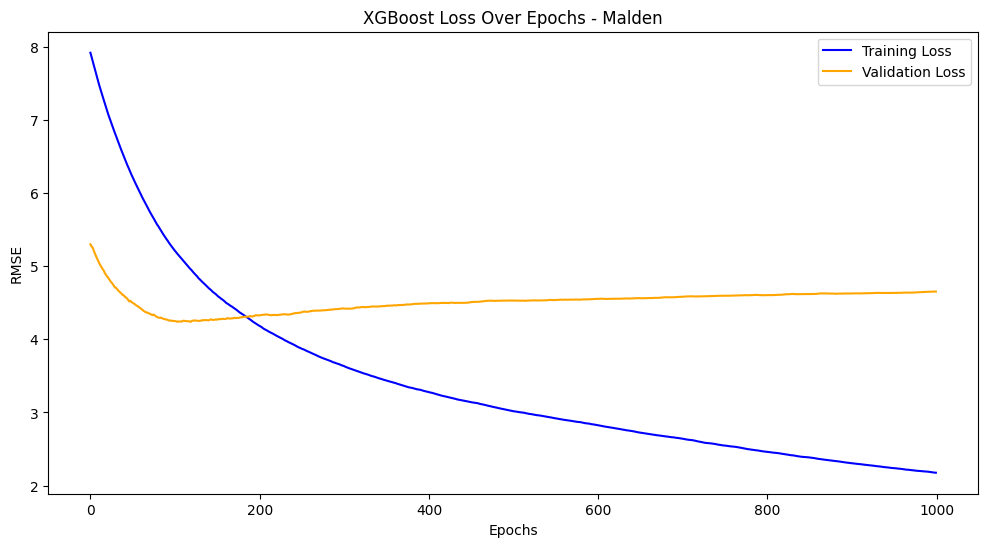

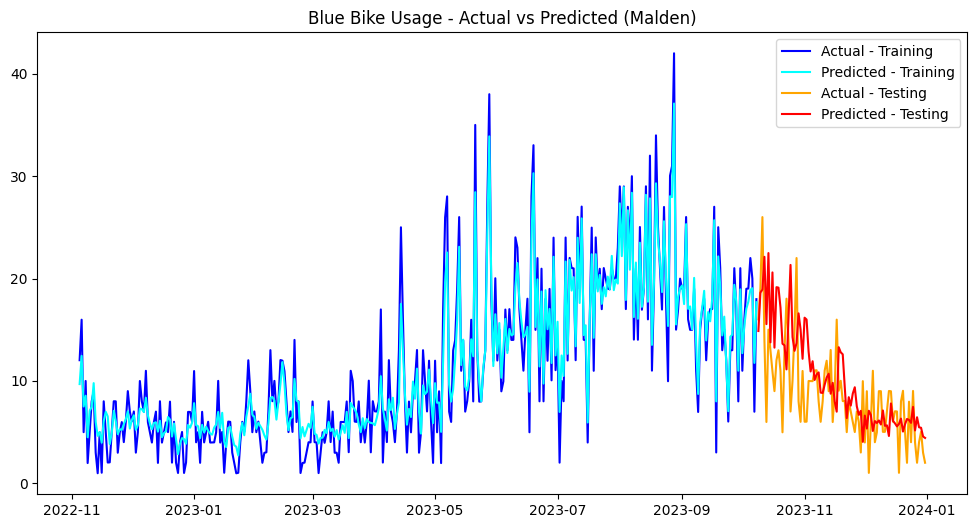


--- Forecasting for District: Medford ---
Train RMSE: 2.61
Test RMSE: 8.91
Ratio: 3.41


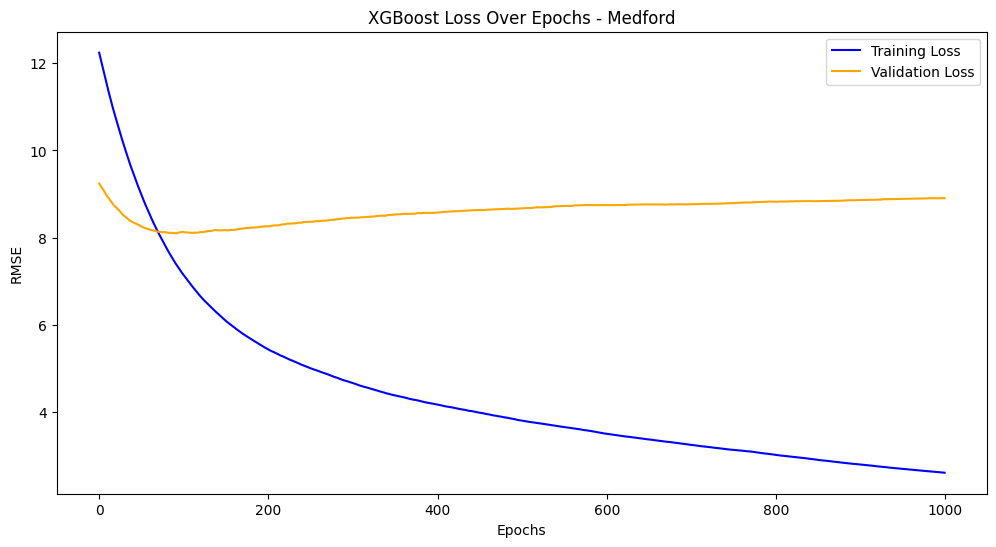

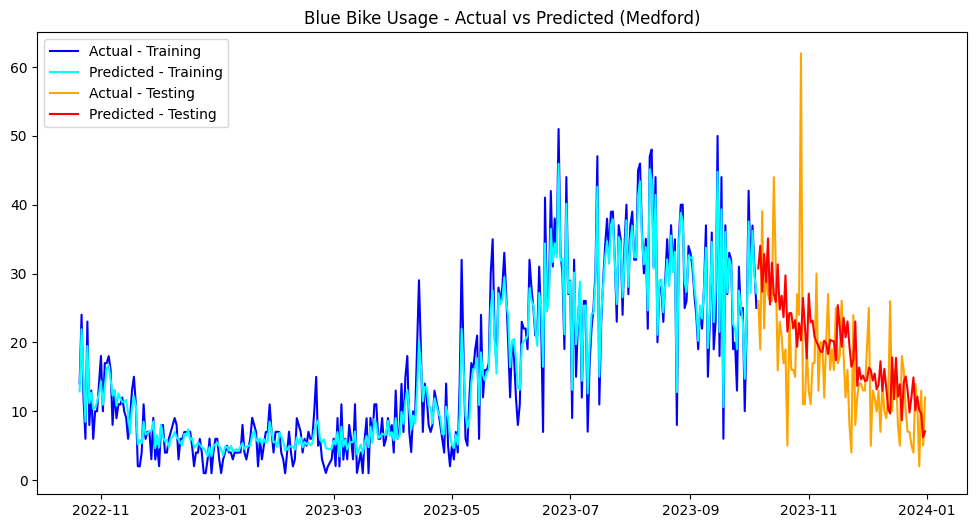


--- Forecasting for District: Newton ---
Train RMSE: 6.48
Test RMSE: 12.11
Ratio: 1.87


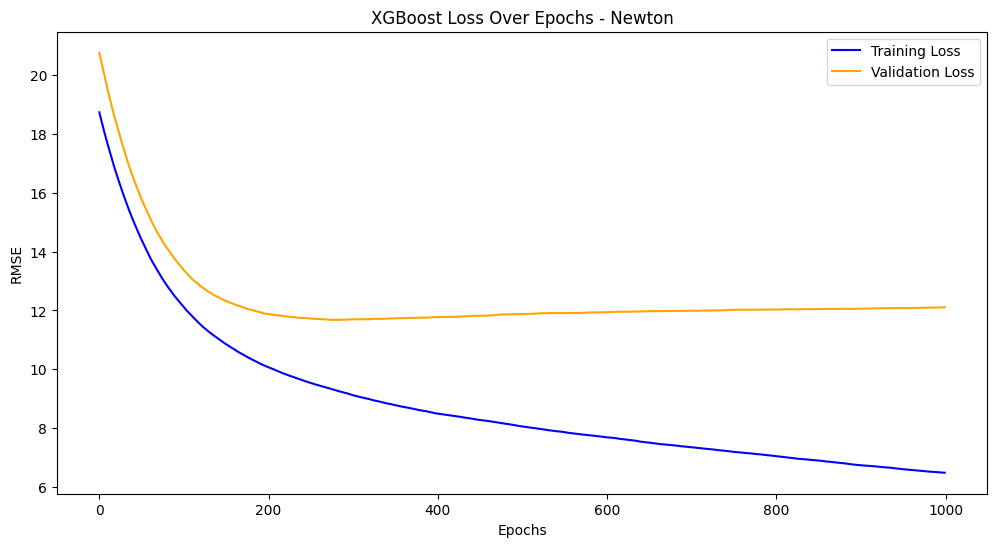

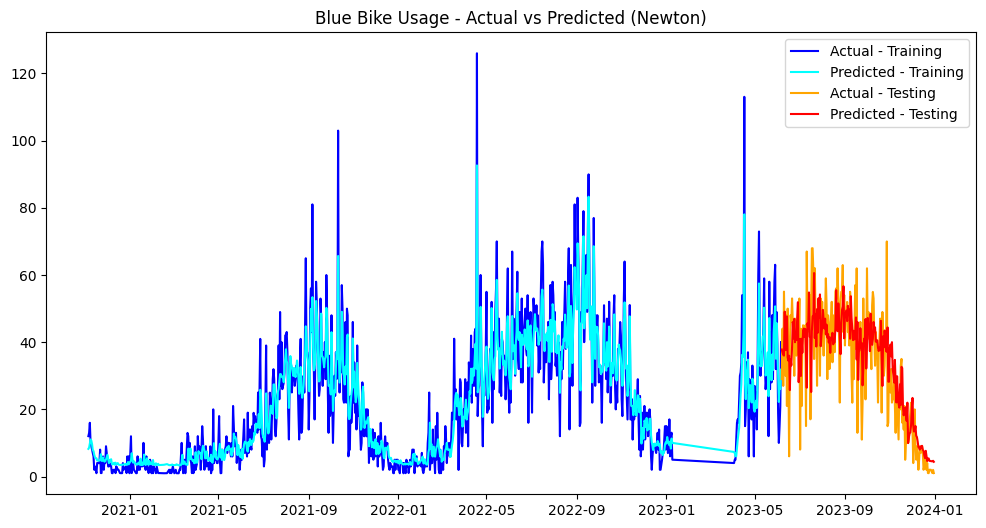


--- Forecasting for District: Revere ---
Train RMSE: 2.64
Test RMSE: 5.93
Ratio: 2.24


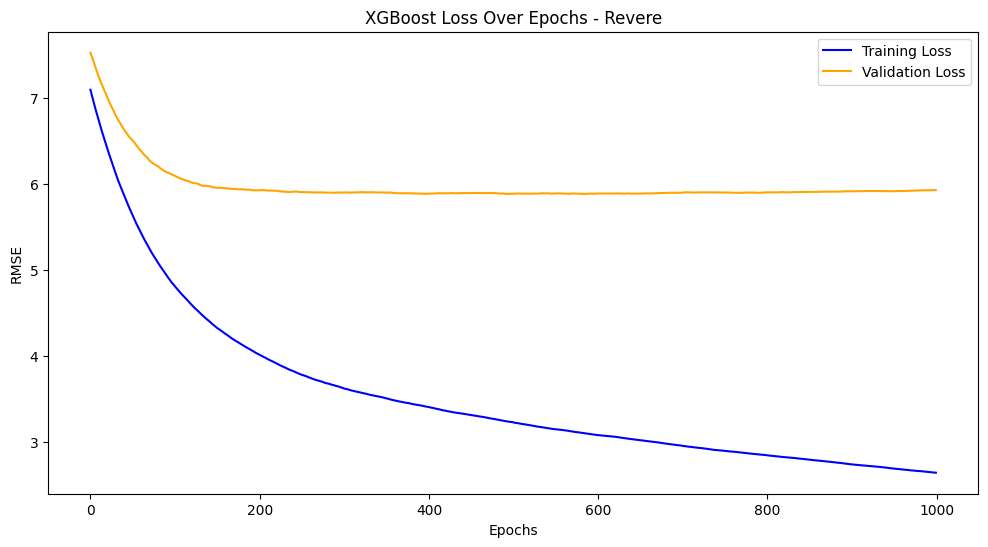

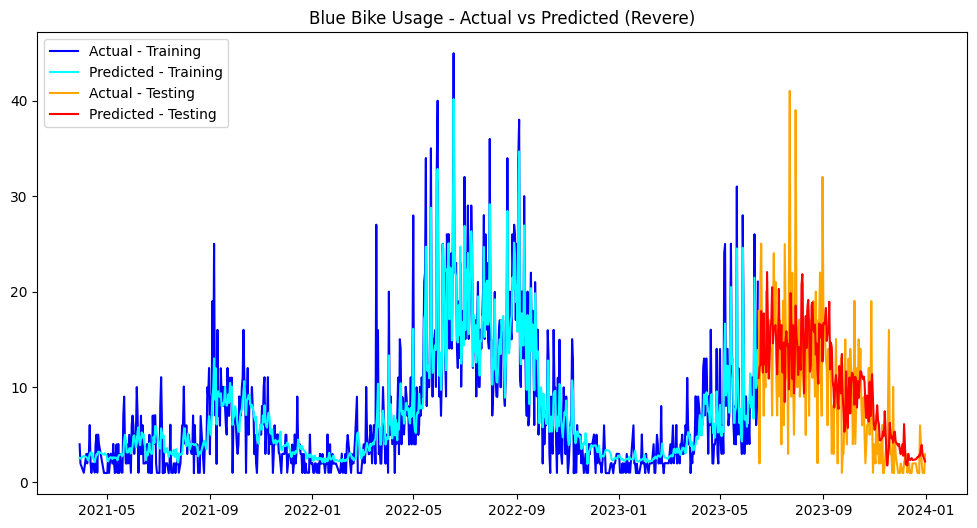


--- Forecasting for District: Salem ---
Train RMSE: 6.49
Test RMSE: 27.37
Ratio: 4.22


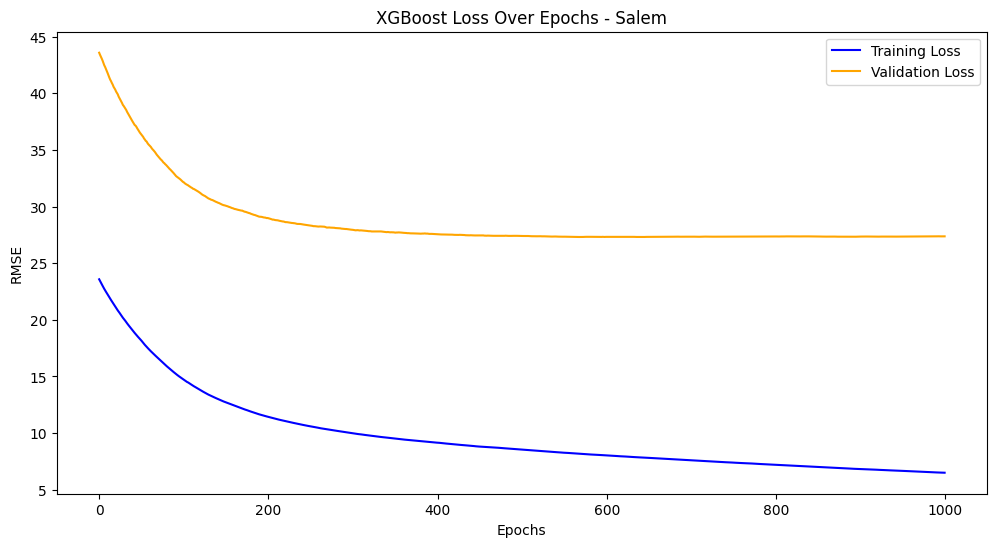

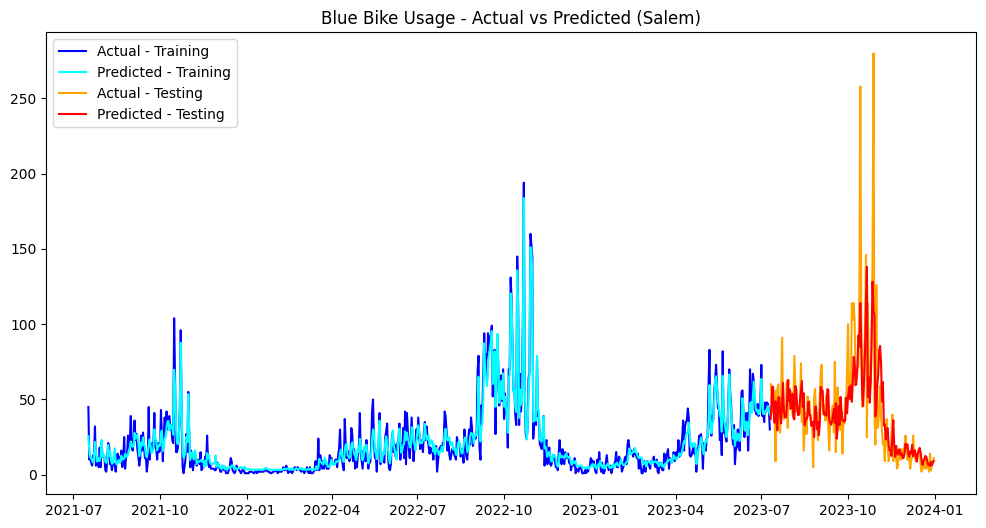


--- Forecasting for District: Somerville ---
Train RMSE: 61.94
Test RMSE: 140.24
Ratio: 2.26


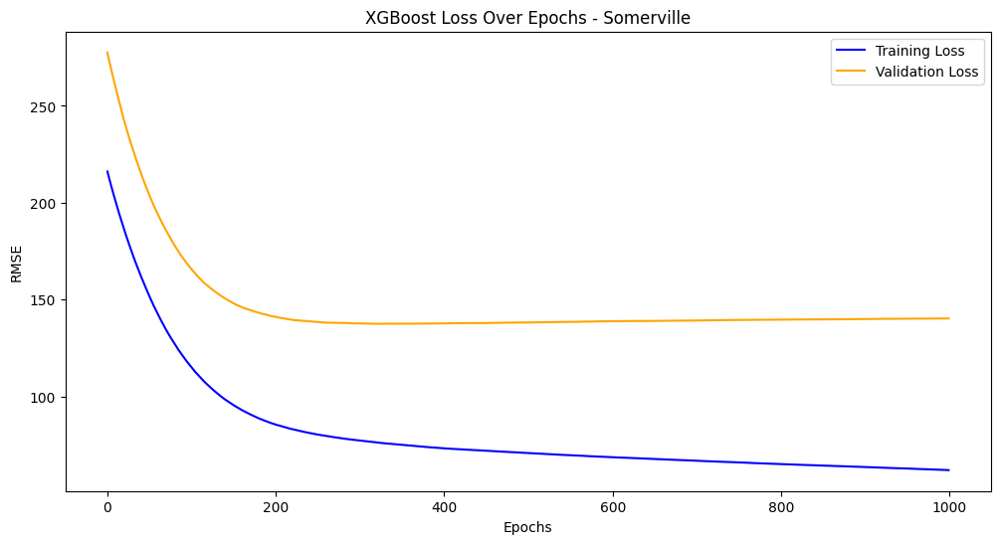

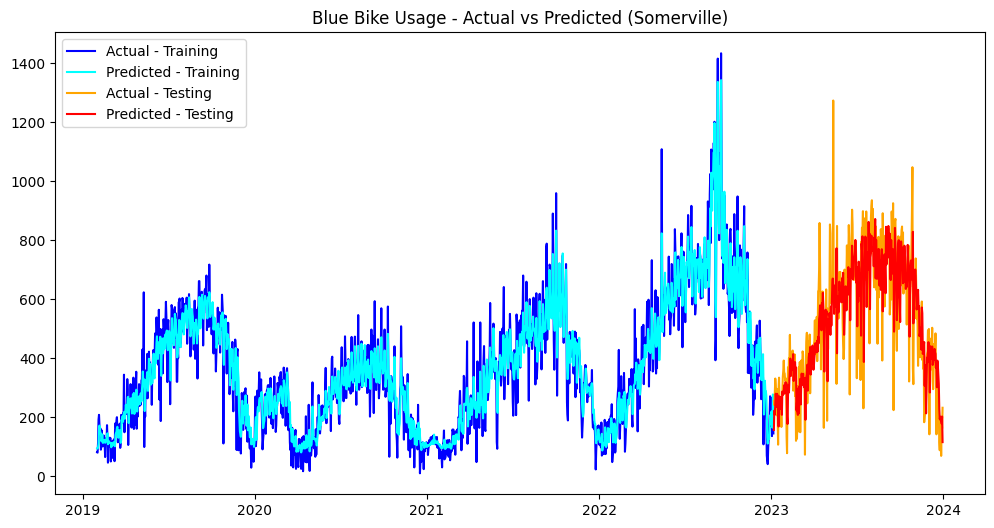


--- Forecasting for District: Watertown ---
Train RMSE: 6.10
Test RMSE: 14.84
Ratio: 2.43


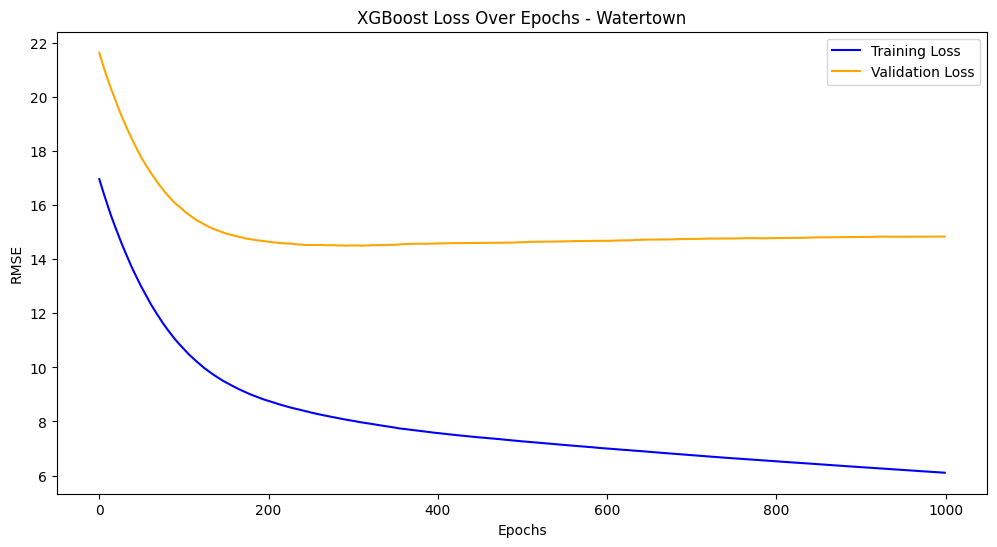

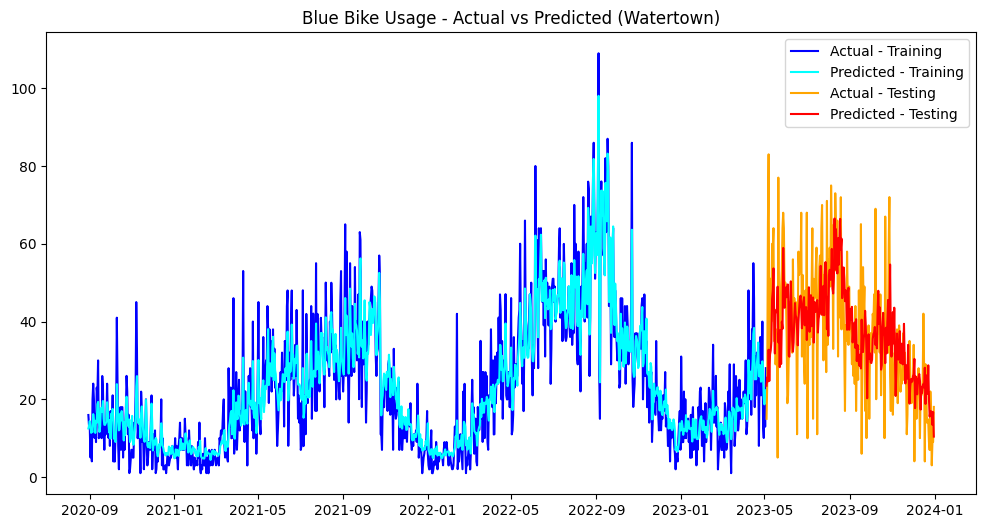


District: Arlington
  Train RMSE: 7.30
  Test RMSE: 14.70
  Test/Train RMSE: 2.01

District: Boston
  Train RMSE: 684.20
  Test RMSE: 1231.17
  Test/Train RMSE: 1.80

District: Brookline
  Train RMSE: 37.37
  Test RMSE: 67.61
  Test/Train RMSE: 1.81

District: Cambridge
  Train RMSE: 383.16
  Test RMSE: 841.97
  Test/Train RMSE: 2.20

District: Chelsea
  Train RMSE: 2.52
  Test RMSE: 4.58
  Test/Train RMSE: 1.82

District: Everett
  Train RMSE: 6.76
  Test RMSE: 14.87
  Test/Train RMSE: 2.20

District: Malden
  Train RMSE: 2.17
  Test RMSE: 4.65
  Test/Train RMSE: 2.14

District: Medford
  Train RMSE: 2.61
  Test RMSE: 8.91
  Test/Train RMSE: 3.41

District: Newton
  Train RMSE: 6.48
  Test RMSE: 12.11
  Test/Train RMSE: 1.87

District: Revere
  Train RMSE: 2.64
  Test RMSE: 5.93
  Test/Train RMSE: 2.24

District: Salem
  Train RMSE: 6.49
  Test RMSE: 27.37
  Test/Train RMSE: 4.22

District: Somerville
  Train RMSE: 61.94
  Test RMSE: 140.24
  Test/Train RMSE: 2.26

District: Watertow

In [54]:
# Function to add noise to the target variable
def add_noise_to_data(df, noise_factor=0.02):
    df['Totalrides'] = df['Totalrides'] + noise_factor * np.random.randn(len(df))
    return df

# Load the original dataset (df2) and process for district-based forecasts
df2['date'] = df2['starttime'].dt.date  # Convert starttime to date
df2['date'] = pd.to_datetime(df2['date'])  # Ensure datetime format

# Group data by district and date, calculating total rides per day
df_grouped = df2.groupby(['District', 'date']).size().reset_index(name='Totalrides')

# Prepare lag features for each district
def create_lag_features_by_district(df, lag, target_col):
    districts = df['District'].unique()
    all_dfs = []
    for district in districts:
        district_df = df[df['District'] == district].copy()
        for i in range(1, lag + 1):
            district_df[f'lag_{i}'] = district_df[target_col].shift(i)
        all_dfs.append(district_df)
    return pd.concat(all_dfs)

# Add lag features
lag = 30  # Number of lag days to include
df_with_lags = create_lag_features_by_district(df_grouped, lag, target_col='Totalrides')

# Drop rows with NaN values caused by lagging
df_with_lags.dropna(inplace=True)

# Iterate over each district and train the XGBoost model
districts = df_with_lags['District'].unique()
results = {}

# Set the train-test ratio to 80/20 (train_ratio = 0.8)
train_ratio = 0.8

for district in districts:
    print(f"\n--- Forecasting for District: {district} ---")
    
    # Filter data for the current district
    district_data = df_with_lags[df_with_lags['District'] == district]
    
    # Sort data chronologically
    district_data = district_data.sort_values('date')
    
    # Data Augmentation:
    augmented_data = district_data.copy()
    
    augmented_data = add_noise_to_data(augmented_data, noise_factor=0.02)  # Add 2% noise
    
    # Determine the split index
    split_index = int(len(district_data) * train_ratio)
    
    # Split into training and testing sets
    train = augmented_data.iloc[:split_index]
    test = augmented_data.iloc[split_index:]
    
    # Define features and target
    X_train = train[[f'lag_{i}' for i in range(1, lag + 1)]]
    y_train = train['Totalrides']
    X_test = test[[f'lag_{i}' for i in range(1, lag + 1)]]
    y_test = test['Totalrides']
    
    # Initialize and train the XGBoost model
    xgb_model = XGBRegressor(
        n_estimators=1000,
        learning_rate=0.01,
        max_depth=3,
        subsample=0.8,
        colsample_bytree=0.8,
        random_state=42
    )
    
    xgb_model.fit(
        X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        verbose=False
    )
    
    # Make predictions
    train_predictions = xgb_model.predict(X_train)
    test_predictions = xgb_model.predict(X_test)
    
    # Calculate RMSE
    train_rmse = np.sqrt(mean_squared_error(y_train, train_predictions))
    test_rmse = np.sqrt(mean_squared_error(y_test, test_predictions))
    
    # Store results
    results[district] = {
        "model": xgb_model,
        "train_rmse": train_rmse,
        "test_rmse": test_rmse,
        "train_predictions": train_predictions,
        "test_predictions": test_predictions,
        "X_train": X_train,
        "X_test": X_test,
        "y_train": y_train,
        "y_test": y_test,
        "train_dates": train['date'],
        "test_dates": test['date']
    }
    
    # Print RMSE for the district
    print(f"Train RMSE: {train_rmse:.2f}")
    print(f"Test RMSE: {test_rmse:.2f}")
    print(f"Ratio: {(test_rmse/train_rmse):.2f}")
    
    # Plot training and validation loss
    results_eval = xgb_model.evals_result_
    plt.figure(figsize=(12, 6))
    plt.plot(results_eval['validation_0']['rmse'], label='Training Loss', color='blue')
    plt.plot(results_eval['validation_1']['rmse'], label='Validation Loss', color='orange')
    plt.title(f'XGBoost Loss Over Epochs - {district}')
    plt.xlabel('Epochs')
    plt.ylabel('RMSE')
    plt.legend()
    plt.show()
    
    # Plot actual vs predicted
    plt.figure(figsize=(12, 6))
    plt.plot(train['date'], y_train, label="Actual - Training", color="blue")
    plt.plot(train['date'], train_predictions, label="Predicted - Training", color="cyan")
    plt.plot(test['date'], y_test, label="Actual - Testing", color="orange")
    plt.plot(test['date'], test_predictions, label="Predicted - Testing", color="red")
    plt.title(f"Blue Bike Usage - Actual vs Predicted ({district})")
    plt.legend()
    plt.show()

# Display overall results summary
for district, result in results.items():
    print(f"\nDistrict: {district}")
    print(f"  Train RMSE: {result['train_rmse']:.2f}")
    print(f"  Test RMSE: {result['test_rmse']:.2f}")
    print(f"  Test/Train RMSE: {(result['test_rmse']/result['train_rmse']):.2f}")


--- Forecasting for District: Arlington ---
Train RMSE: 7.37
Test RMSE: 15.10
Ratio: 2.05


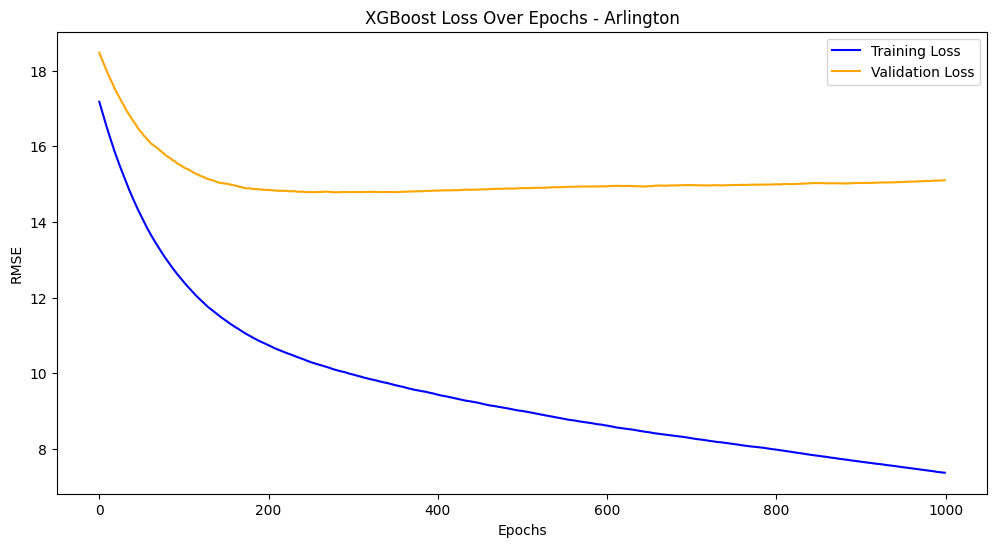

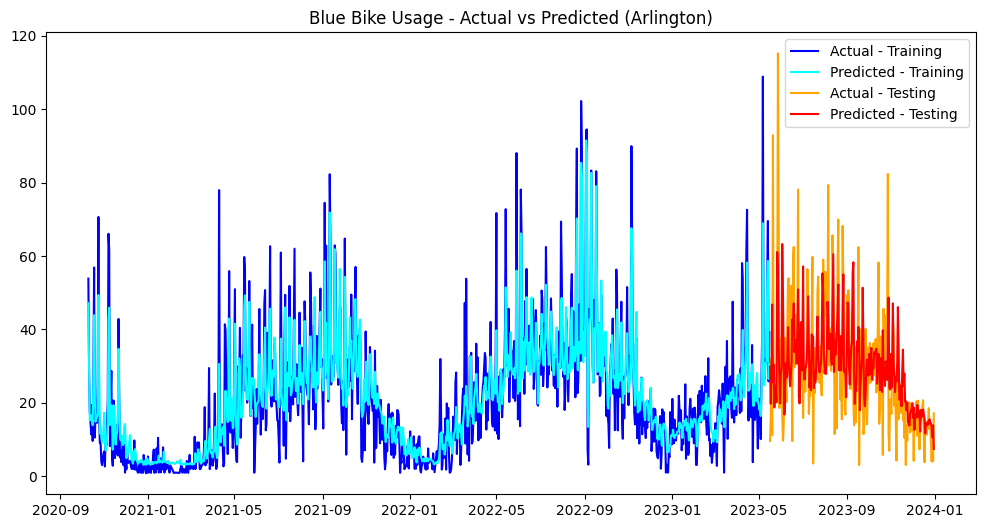


--- Forecasting for District: Boston ---
Train RMSE: 698.23
Test RMSE: 1266.37
Ratio: 1.81


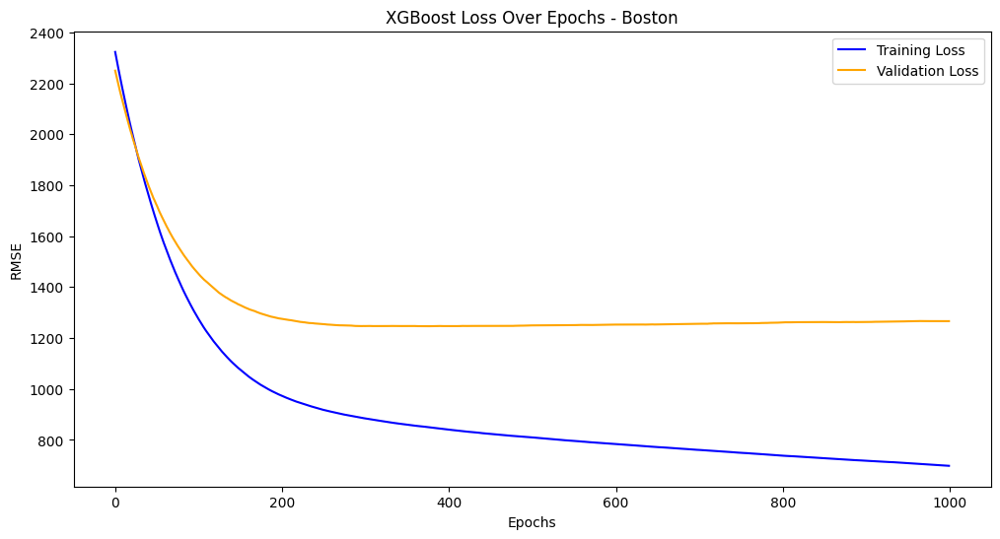

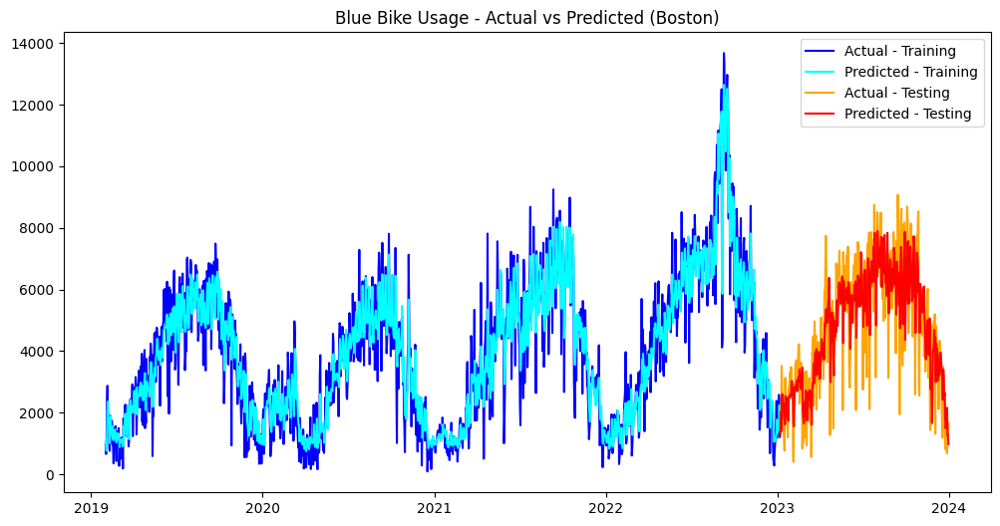


--- Forecasting for District: Brookline ---
Train RMSE: 38.32
Test RMSE: 70.82
Ratio: 1.85


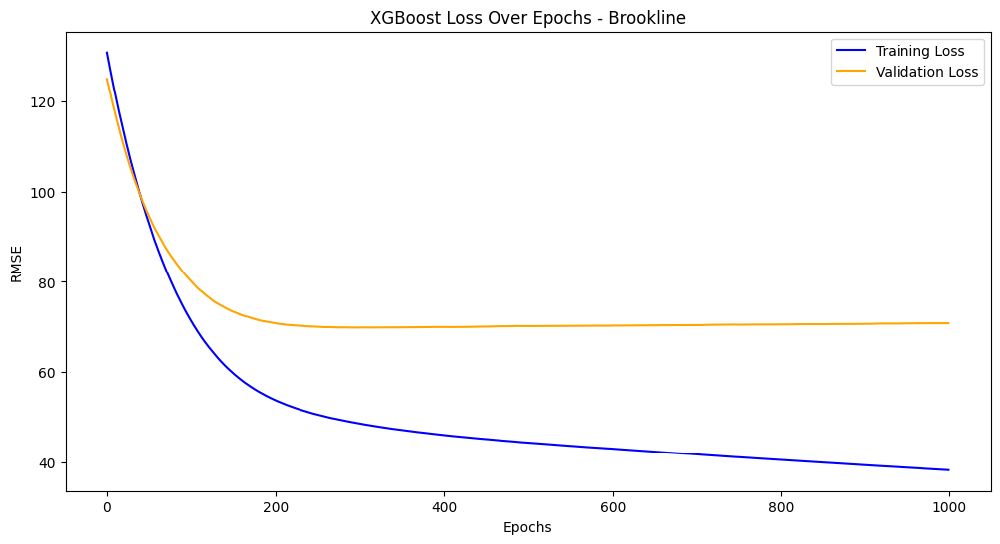

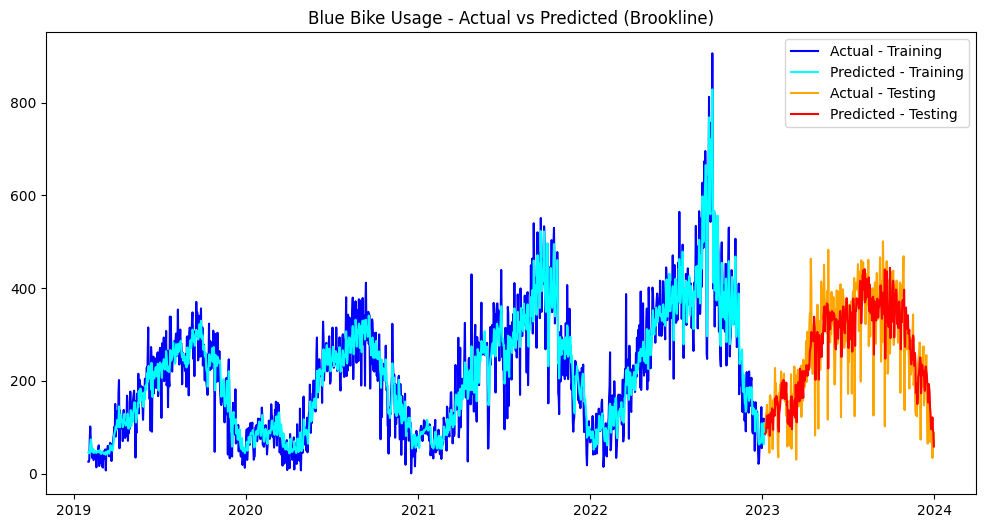


--- Forecasting for District: Cambridge ---
Train RMSE: 393.56
Test RMSE: 860.44
Ratio: 2.19


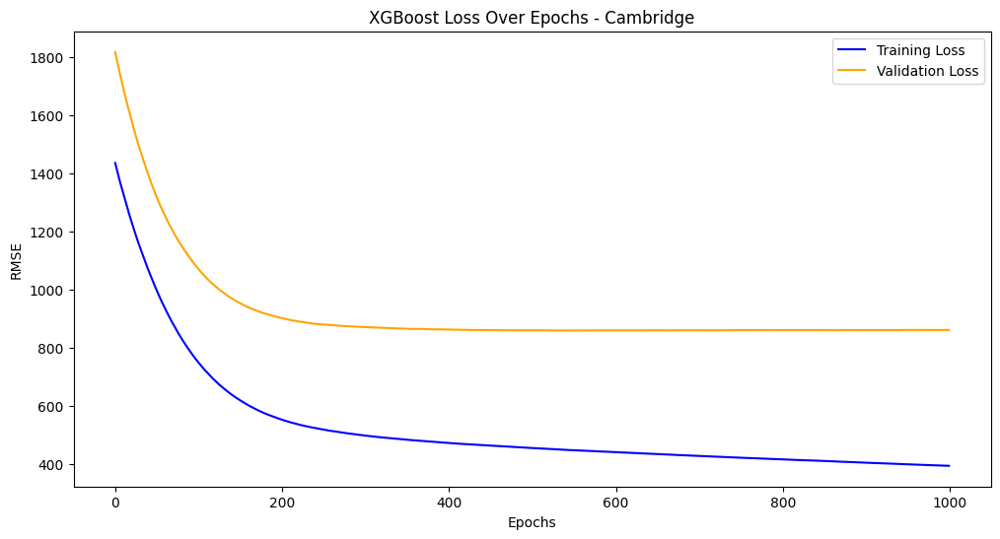

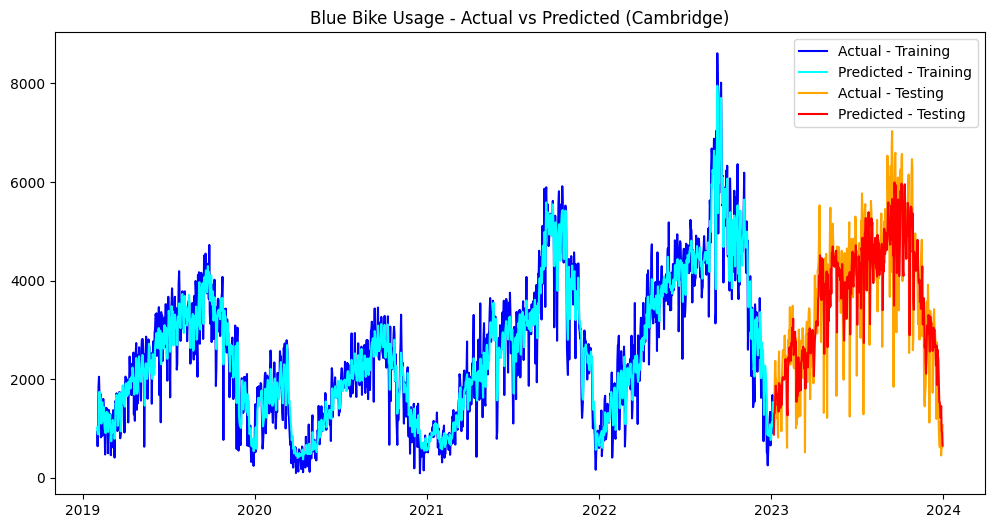


--- Forecasting for District: Chelsea ---
Train RMSE: 2.51
Test RMSE: 4.59
Ratio: 1.83


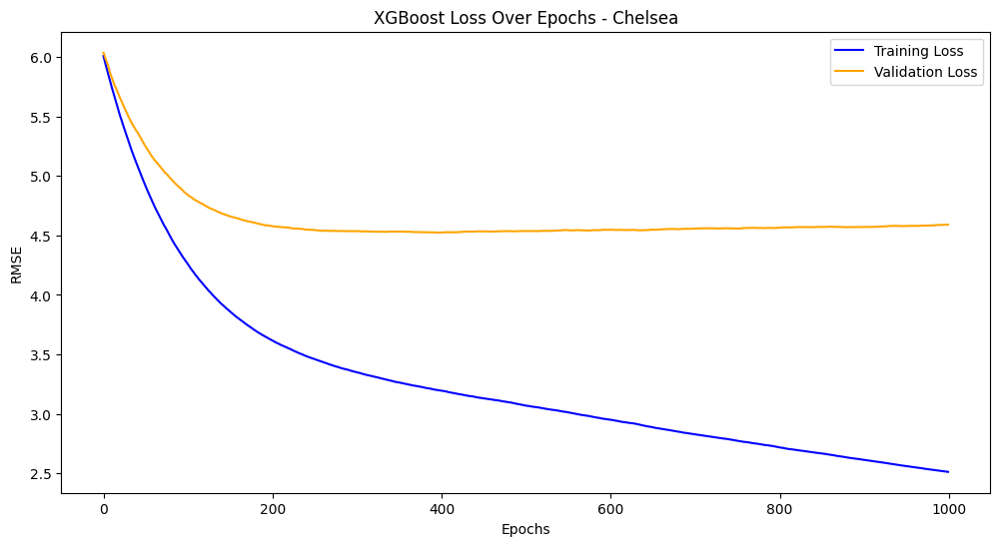

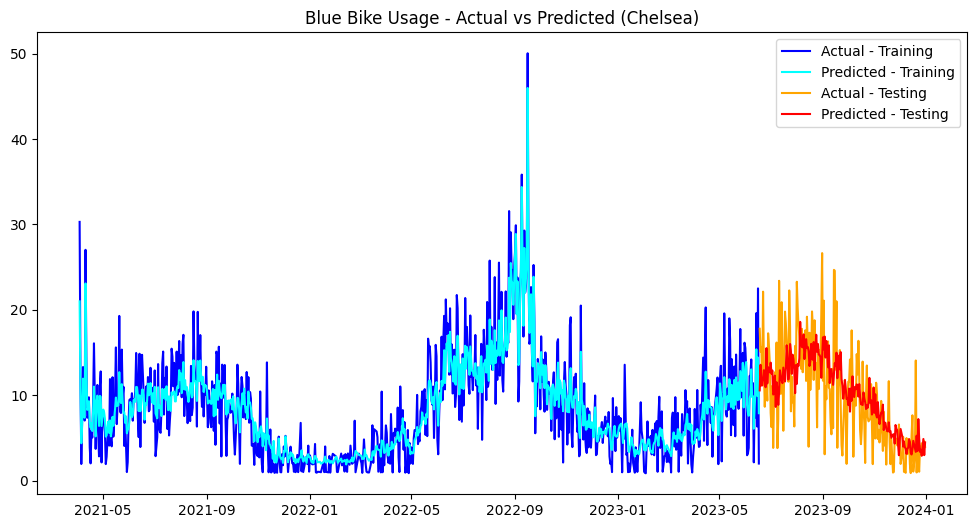


--- Forecasting for District: Everett ---
Train RMSE: 6.84
Test RMSE: 15.32
Ratio: 2.24


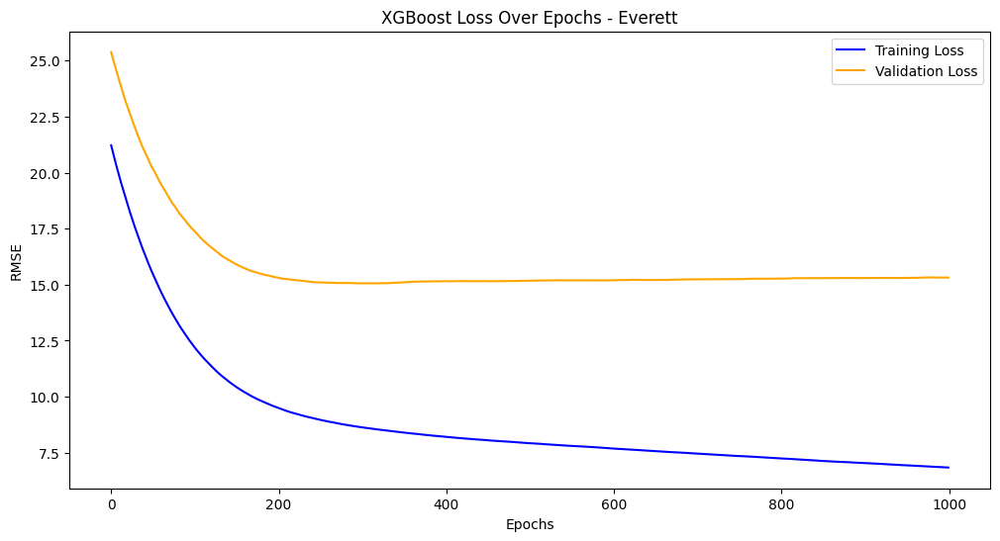

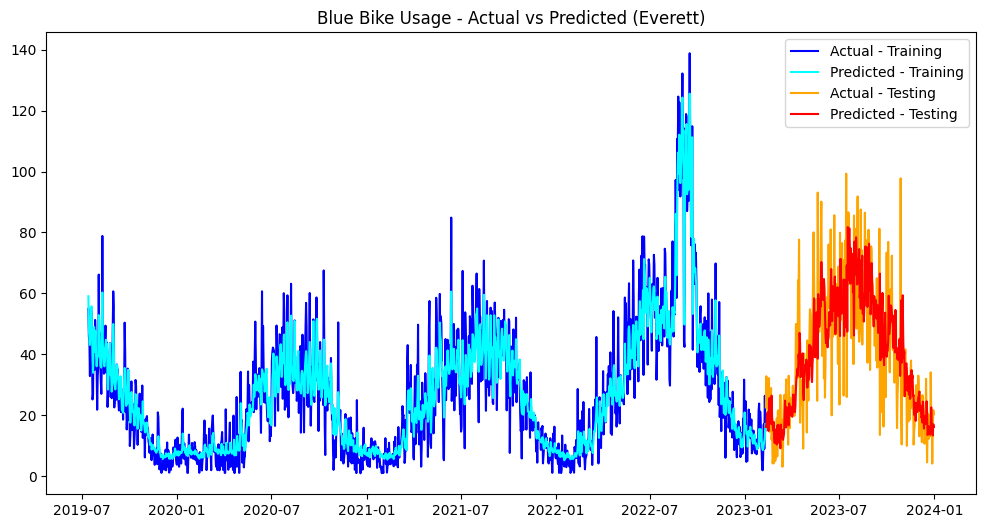


--- Forecasting for District: Malden ---
Train RMSE: 2.21
Test RMSE: 4.63
Ratio: 2.10


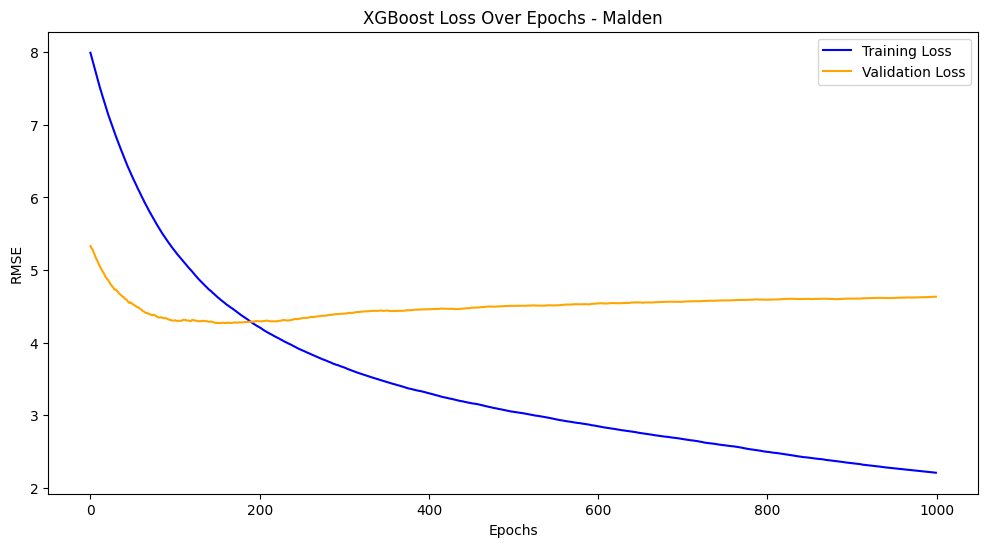

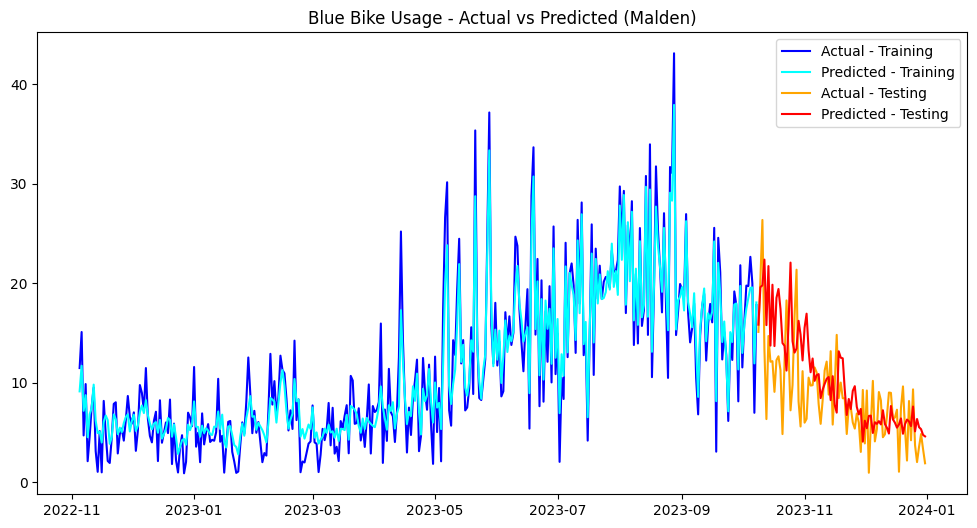


--- Forecasting for District: Medford ---
Train RMSE: 2.65
Test RMSE: 9.17
Ratio: 3.46


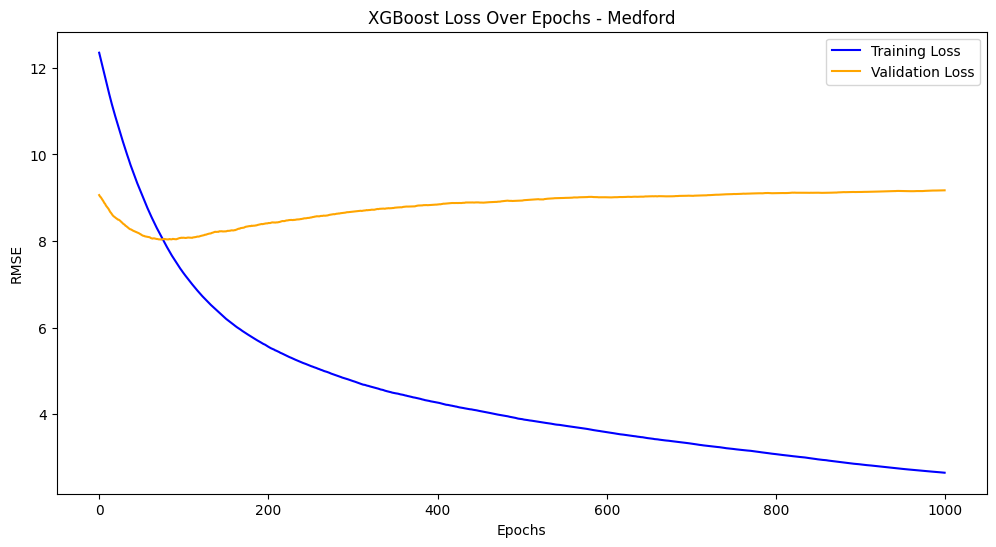

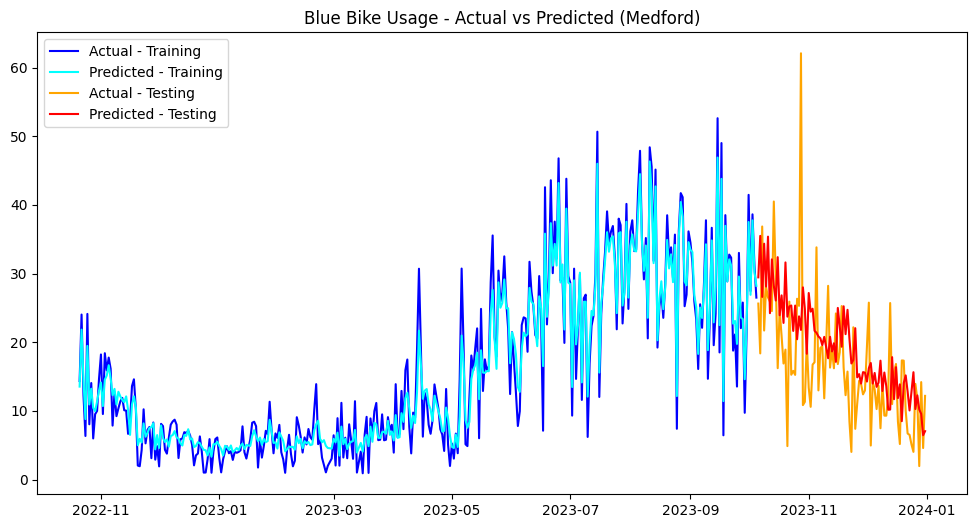


--- Forecasting for District: Newton ---
Train RMSE: 6.59
Test RMSE: 12.12
Ratio: 1.84


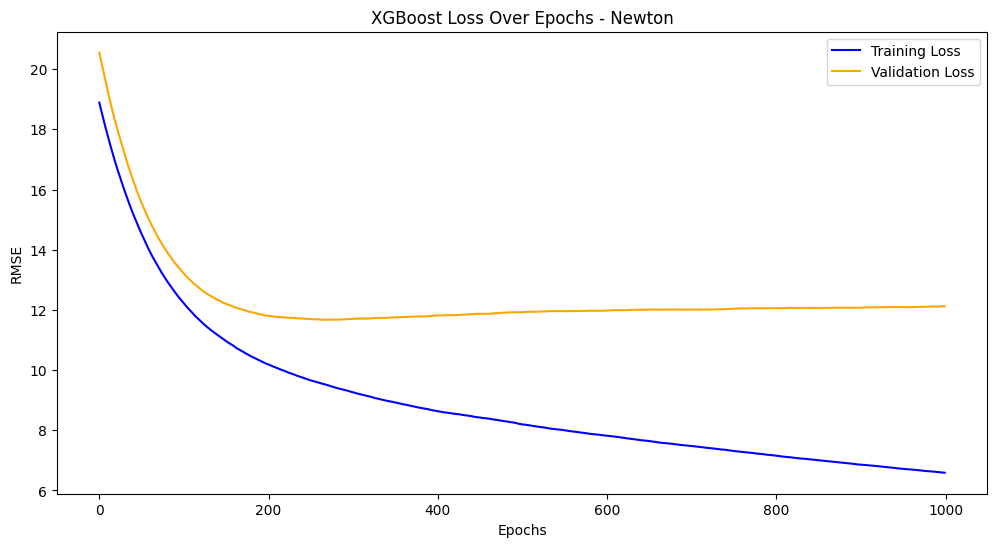

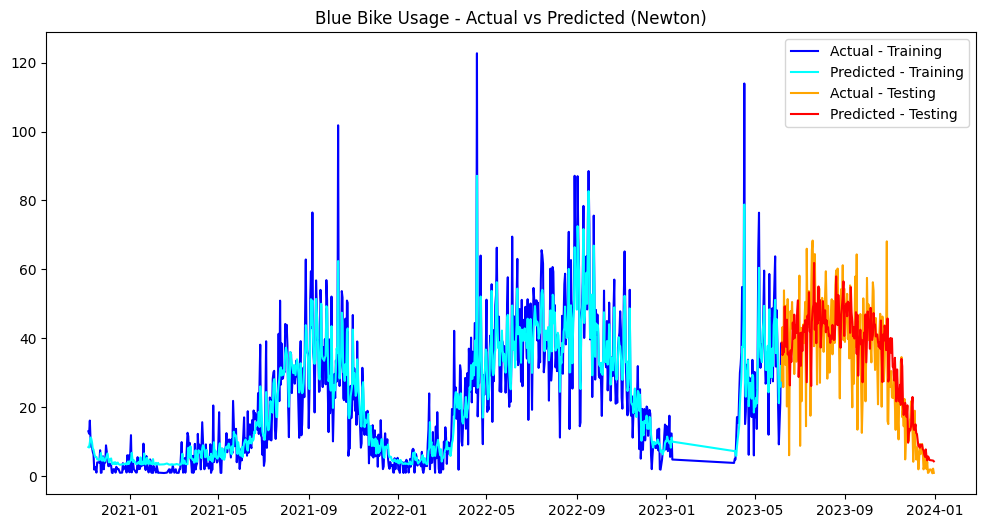


--- Forecasting for District: Revere ---
Train RMSE: 2.63
Test RMSE: 5.94
Ratio: 2.26


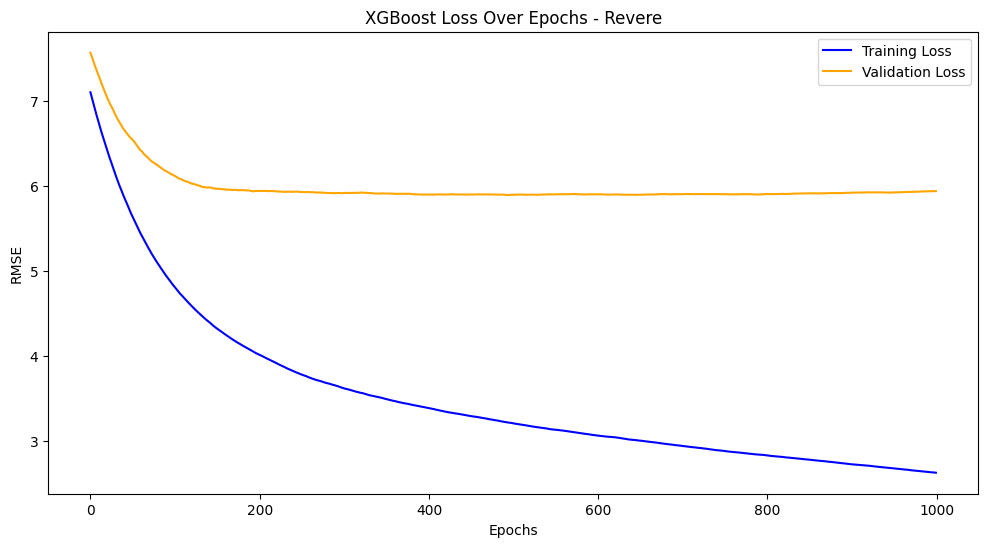

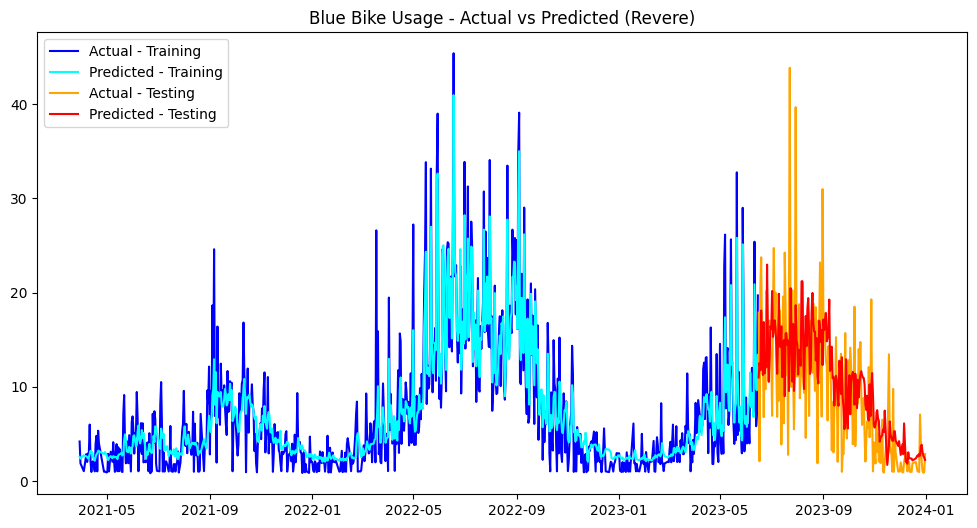


--- Forecasting for District: Salem ---
Train RMSE: 6.45
Test RMSE: 27.19
Ratio: 4.22


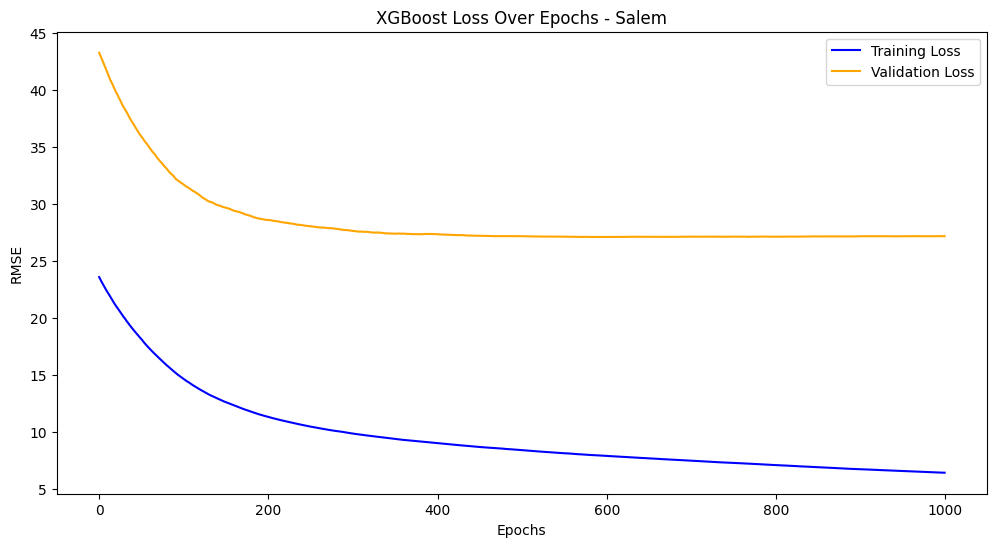

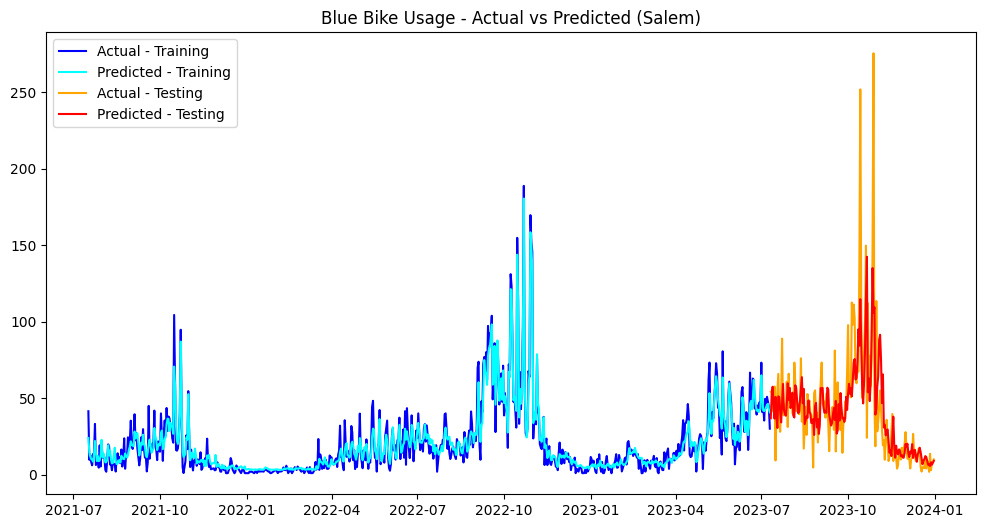


--- Forecasting for District: Somerville ---
Train RMSE: 63.85
Test RMSE: 143.80
Ratio: 2.25


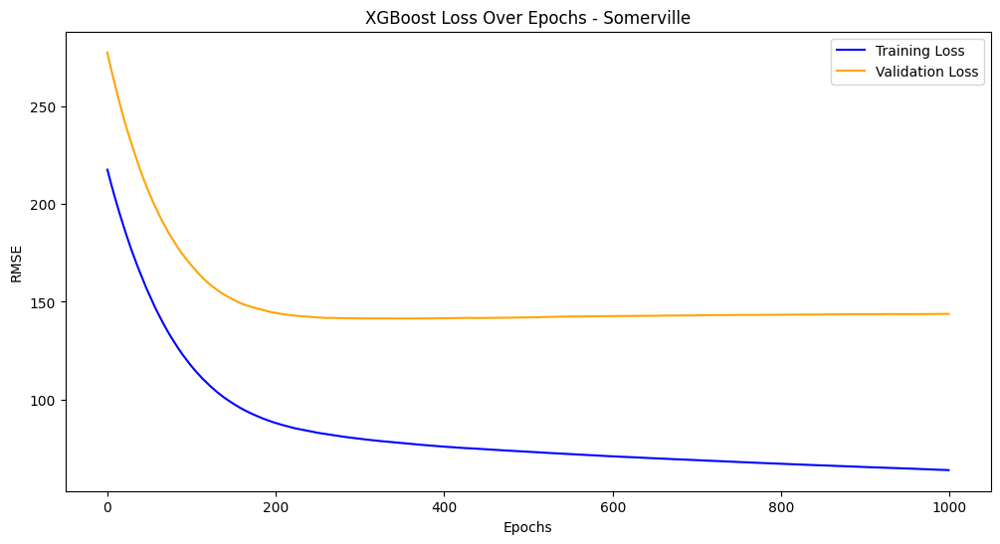

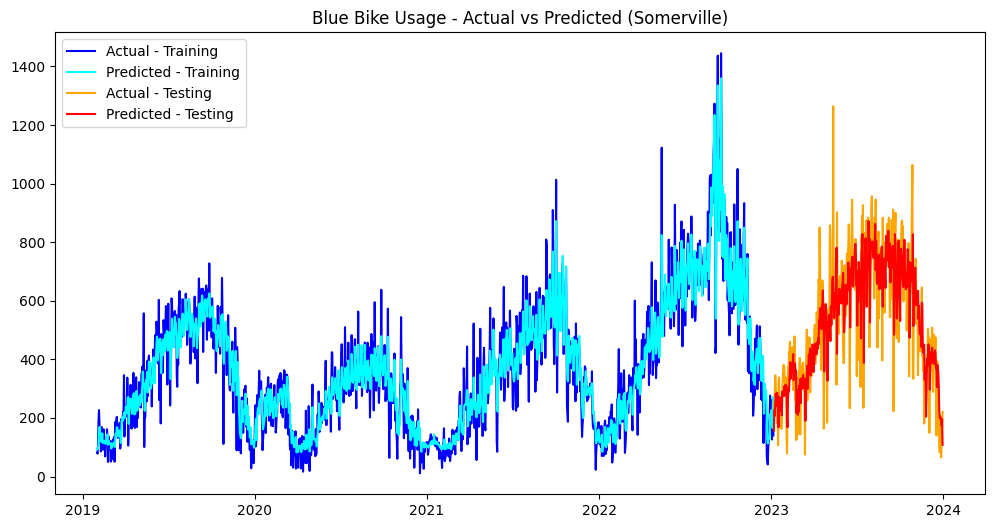


--- Forecasting for District: Watertown ---
Train RMSE: 6.26
Test RMSE: 14.68
Ratio: 2.34


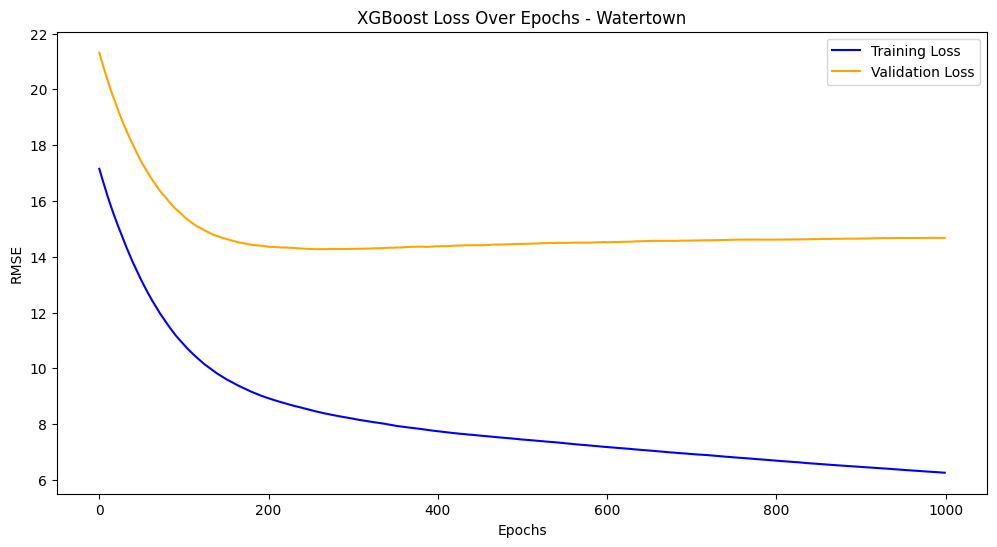

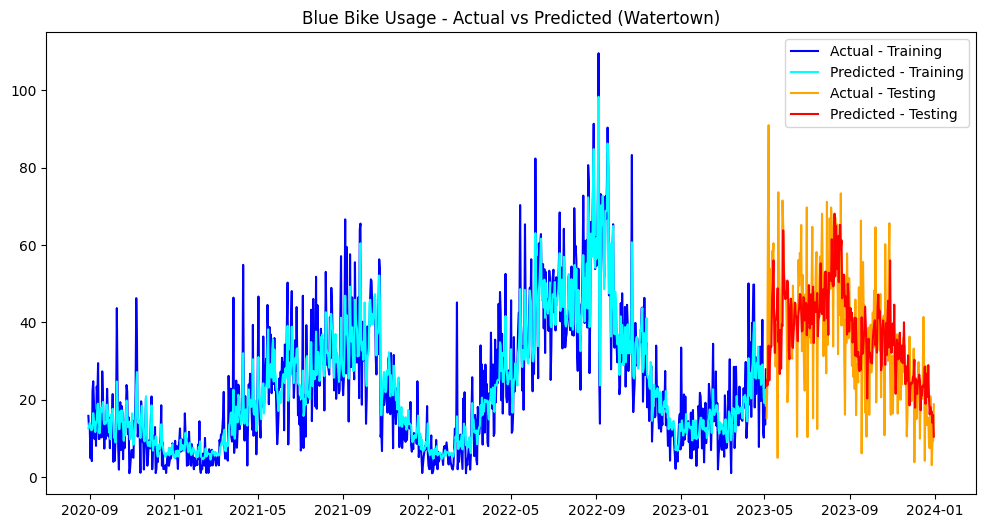


District: Arlington
  Train RMSE: 7.37
  Test RMSE: 15.10
  Test/Train RMSE: 2.05

District: Boston
  Train RMSE: 698.23
  Test RMSE: 1266.37
  Test/Train RMSE: 1.81

District: Brookline
  Train RMSE: 38.32
  Test RMSE: 70.82
  Test/Train RMSE: 1.85

District: Cambridge
  Train RMSE: 393.56
  Test RMSE: 860.44
  Test/Train RMSE: 2.19

District: Chelsea
  Train RMSE: 2.51
  Test RMSE: 4.59
  Test/Train RMSE: 1.83

District: Everett
  Train RMSE: 6.84
  Test RMSE: 15.32
  Test/Train RMSE: 2.24

District: Malden
  Train RMSE: 2.21
  Test RMSE: 4.63
  Test/Train RMSE: 2.10

District: Medford
  Train RMSE: 2.65
  Test RMSE: 9.17
  Test/Train RMSE: 3.46

District: Newton
  Train RMSE: 6.59
  Test RMSE: 12.12
  Test/Train RMSE: 1.84

District: Revere
  Train RMSE: 2.63
  Test RMSE: 5.94
  Test/Train RMSE: 2.26

District: Salem
  Train RMSE: 6.45
  Test RMSE: 27.19
  Test/Train RMSE: 4.22

District: Somerville
  Train RMSE: 63.85
  Test RMSE: 143.80
  Test/Train RMSE: 2.25

District: Watertow

In [55]:
# Function to apply scaling to the data
def scale_data(df, scale_factor=0.05):
    df['Totalrides'] = df['Totalrides'] * (1 + scale_factor * np.random.randn(len(df)))
    return df

# Load the original dataset (df2) and process for district-based forecasts
df2['date'] = df2['starttime'].dt.date  # Convert starttime to date
df2['date'] = pd.to_datetime(df2['date'])  # Ensure datetime format

# Group data by district and date, calculating total rides per day
df_grouped = df2.groupby(['District', 'date']).size().reset_index(name='Totalrides')

# Prepare lag features for each district
def create_lag_features_by_district(df, lag, target_col):
    districts = df['District'].unique()
    all_dfs = []
    for district in districts:
        district_df = df[df['District'] == district].copy()
        for i in range(1, lag + 1):
            district_df[f'lag_{i}'] = district_df[target_col].shift(i)
        all_dfs.append(district_df)
    return pd.concat(all_dfs)

# Add lag features
lag = 30  # Number of lag days to include
df_with_lags = create_lag_features_by_district(df_grouped, lag, target_col='Totalrides')

# Drop rows with NaN values caused by lagging
df_with_lags.dropna(inplace=True)

# Iterate over each district and train the XGBoost model
districts = df_with_lags['District'].unique()
results = {}

# Set the train-test ratio to 80/20 (train_ratio = 0.8)
train_ratio = 0.8

for district in districts:
    print(f"\n--- Forecasting for District: {district} ---")
    
    # Filter data for the current district
    district_data = df_with_lags[df_with_lags['District'] == district]
    
    # Sort data chronologically
    district_data = district_data.sort_values('date')
    
    # Data Augmentation:
    augmented_data = district_data.copy()
    
    augmented_data = scale_data(augmented_data, scale_factor=0.05)  # Scale data by ±5%
    
    # Determine the split index
    split_index = int(len(district_data) * train_ratio)
    
    # Split into training and testing sets
    train = augmented_data.iloc[:split_index]
    test = augmented_data.iloc[split_index:]
    
    # Define features and target
    X_train = train[[f'lag_{i}' for i in range(1, lag + 1)]]
    y_train = train['Totalrides']
    X_test = test[[f'lag_{i}' for i in range(1, lag + 1)]]
    y_test = test['Totalrides']
    
    # Initialize and train the XGBoost model
    xgb_model = XGBRegressor(
        n_estimators=1000,
        learning_rate=0.01,
        max_depth=3,
        subsample=0.8,
        colsample_bytree=0.8,
        random_state=42
    )
    
    xgb_model.fit(
        X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        verbose=False
    )
    
    # Make predictions
    train_predictions = xgb_model.predict(X_train)
    test_predictions = xgb_model.predict(X_test)
    
    # Calculate RMSE
    train_rmse = np.sqrt(mean_squared_error(y_train, train_predictions))
    test_rmse = np.sqrt(mean_squared_error(y_test, test_predictions))
    
    # Store results
    results[district] = {
        "model": xgb_model,
        "train_rmse": train_rmse,
        "test_rmse": test_rmse,
        "train_predictions": train_predictions,
        "test_predictions": test_predictions,
        "X_train": X_train,
        "X_test": X_test,
        "y_train": y_train,
        "y_test": y_test,
        "train_dates": train['date'],
        "test_dates": test['date']
    }
    
    # Print RMSE for the district
    print(f"Train RMSE: {train_rmse:.2f}")
    print(f"Test RMSE: {test_rmse:.2f}")
    print(f"Ratio: {(test_rmse/train_rmse):.2f}")
    
    # Plot training and validation loss
    results_eval = xgb_model.evals_result_
    plt.figure(figsize=(12, 6))
    plt.plot(results_eval['validation_0']['rmse'], label='Training Loss', color='blue')
    plt.plot(results_eval['validation_1']['rmse'], label='Validation Loss', color='orange')
    plt.title(f'XGBoost Loss Over Epochs - {district}')
    plt.xlabel('Epochs')
    plt.ylabel('RMSE')
    plt.legend()
    plt.show()
    
    # Plot actual vs predicted
    plt.figure(figsize=(12, 6))
    plt.plot(train['date'], y_train, label="Actual - Training", color="blue")
    plt.plot(train['date'], train_predictions, label="Predicted - Training", color="cyan")
    plt.plot(test['date'], y_test, label="Actual - Testing", color="orange")
    plt.plot(test['date'], test_predictions, label="Predicted - Testing", color="red")
    plt.title(f"Blue Bike Usage - Actual vs Predicted ({district})")
    plt.legend()
    plt.show()

# Display overall results summary
for district, result in results.items():
    print(f"\nDistrict: {district}")
    print(f"  Train RMSE: {result['train_rmse']:.2f}")
    print(f"  Test RMSE: {result['test_rmse']:.2f}")
    print(f"  Test/Train RMSE: {(result['test_rmse']/result['train_rmse']):.2f}")

# LSTM Ride Predictions per District

### ( used for comparison against the original XGBoost hyperparameters)

In [52]:
def district_demand_forecast_LSTM(rmse_train, rmse_test, district):
    print(district)
    df_pred = df2
    df_pred = df_pred[df_pred.District == district]

    df_pred['date'] = df_pred.starttime.dt.date
    df_pred = df_pred.groupby(['year', 'month', 'date']).size().reset_index(name='Totalrides')
    df_pred['date'] = pd.to_datetime(df_pred.date)

    dataset = pd.DataFrame(df_pred.Totalrides.values)
    dataset = dataset.astype('float32')

    scaler = MinMaxScaler(feature_range=(0, 1))
    dataset = scaler.fit_transform(dataset)

    train_size = int(len(dataset) * 0.80)
    test_size = len(dataset) - train_size
    train, test = dataset[0:train_size, :], dataset[train_size:len(dataset), :]

    look_back = 1
    X_train, y_train = create_dataset(train, look_back)
    X_test, y_test = create_dataset(test, look_back)

    model = Sequential()
    model.add(LSTM(4, input_shape=(1, look_back), activation='tanh'))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')
    history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=10, batch_size=1, verbose=2)

    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    y_train_pred = scaler.inverse_transform(y_train_pred)
    y_train = scaler.inverse_transform([y_train])
    y_test_pred = scaler.inverse_transform(y_test_pred)
    y_test = scaler.inverse_transform([y_test])

    rmse_for_train = math.sqrt(mean_squared_error(y_train[0], y_train_pred[:, 0]))
    rmse_for_test = math.sqrt(mean_squared_error(y_test[0], y_test_pred[:, 0]))
    
    print(f"Train RMSE: {rmse_for_train:.2f}")
    print(f"Test RMSE: {rmse_for_test:.2f}")
    
    rmse_train.append(rmse_for_train)
    rmse_test.append(rmse_for_test)

    training_loss = history.history['loss']
    test_loss = history.history['val_loss']

    # Create count of the number of epochs
    epoch_count = range(1, len(training_loss) + 1)

    # Visualize loss history
    plt.plot(epoch_count, training_loss, 'r--')
    plt.plot(epoch_count, test_loss, 'b-')
    plt.legend(['Training Loss', 'Test Loss'])
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.grid()
    plt.show()

    dataset = scaler.inverse_transform(dataset)
    return dataset, y_train_pred, y_test_pred, rmse_train, rmse_test

Cambridge
Epoch 1/10
1457/1457 - 8s - 5ms/step - loss: 0.0420 - val_loss: 0.0355
Epoch 2/10
1457/1457 - 5s - 3ms/step - loss: 0.0107 - val_loss: 0.0152
Epoch 3/10
1457/1457 - 5s - 3ms/step - loss: 0.0062 - val_loss: 0.0157
Epoch 4/10
1457/1457 - 5s - 3ms/step - loss: 0.0062 - val_loss: 0.0155
Epoch 5/10
1457/1457 - 5s - 3ms/step - loss: 0.0062 - val_loss: 0.0158
Epoch 6/10
1457/1457 - 5s - 3ms/step - loss: 0.0062 - val_loss: 0.0156
Epoch 7/10
1457/1457 - 4s - 3ms/step - loss: 0.0062 - val_loss: 0.0161
Epoch 8/10
1457/1457 - 4s - 3ms/step - loss: 0.0062 - val_loss: 0.0156
Epoch 9/10
1457/1457 - 4s - 3ms/step - loss: 0.0062 - val_loss: 0.0158
Epoch 10/10
1457/1457 - 4s - 3ms/step - loss: 0.0062 - val_loss: 0.0157
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Train RMSE: 606.51
Test RMSE: 974.20


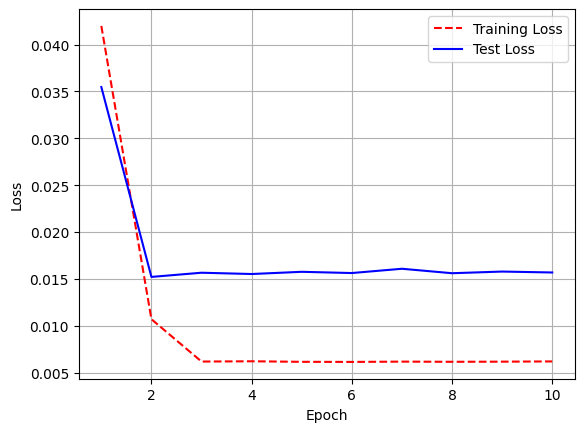

Boston
Epoch 1/10
1457/1457 - 8s - 5ms/step - loss: 0.0250 - val_loss: 0.0133
Epoch 2/10
1457/1457 - 4s - 3ms/step - loss: 0.0082 - val_loss: 0.0110
Epoch 3/10
1457/1457 - 5s - 3ms/step - loss: 0.0070 - val_loss: 0.0112
Epoch 4/10
1457/1457 - 4s - 3ms/step - loss: 0.0070 - val_loss: 0.0113
Epoch 5/10
1457/1457 - 4s - 3ms/step - loss: 0.0071 - val_loss: 0.0113
Epoch 6/10
1457/1457 - 4s - 3ms/step - loss: 0.0070 - val_loss: 0.0110
Epoch 7/10
1457/1457 - 5s - 3ms/step - loss: 0.0071 - val_loss: 0.0112
Epoch 8/10
1457/1457 - 4s - 3ms/step - loss: 0.0071 - val_loss: 0.0114
Epoch 9/10
1457/1457 - 4s - 3ms/step - loss: 0.0071 - val_loss: 0.0113
Epoch 10/10
1457/1457 - 5s - 3ms/step - loss: 0.0070 - val_loss: 0.0113
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Train RMSE: 1121.70
Test RMSE: 1424.90


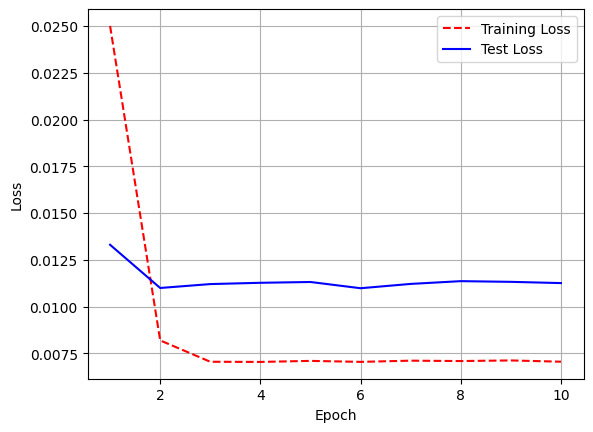

Somerville
Epoch 1/10
1457/1457 - 8s - 5ms/step - loss: 0.0259 - val_loss: 0.0201
Epoch 2/10
1457/1457 - 5s - 3ms/step - loss: 0.0071 - val_loss: 0.0127
Epoch 3/10
1457/1457 - 5s - 3ms/step - loss: 0.0052 - val_loss: 0.0128
Epoch 4/10
1457/1457 - 4s - 3ms/step - loss: 0.0052 - val_loss: 0.0133
Epoch 5/10
1457/1457 - 4s - 3ms/step - loss: 0.0052 - val_loss: 0.0130
Epoch 6/10
1457/1457 - 5s - 3ms/step - loss: 0.0053 - val_loss: 0.0125
Epoch 7/10
1457/1457 - 5s - 3ms/step - loss: 0.0053 - val_loss: 0.0128
Epoch 8/10
1457/1457 - 4s - 3ms/step - loss: 0.0052 - val_loss: 0.0124
Epoch 9/10
1457/1457 - 5s - 3ms/step - loss: 0.0052 - val_loss: 0.0127
Epoch 10/10
1457/1457 - 5s - 3ms/step - loss: 0.0052 - val_loss: 0.0127
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Train RMSE: 102.13
Test RMSE: 160.55


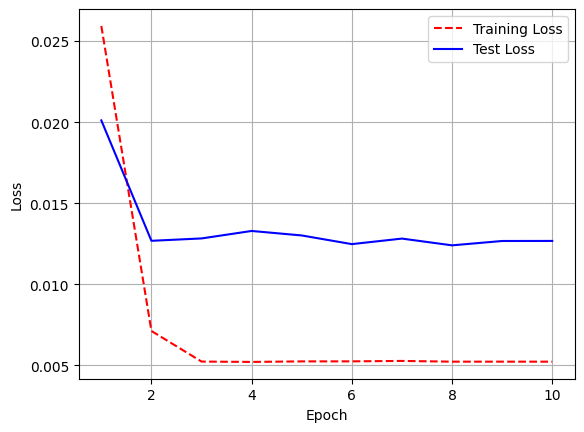

Brookline
Epoch 1/10
1457/1457 - 8s - 6ms/step - loss: 0.0172 - val_loss: 0.0094
Epoch 2/10
1457/1457 - 5s - 3ms/step - loss: 0.0052 - val_loss: 0.0083
Epoch 3/10
1457/1457 - 5s - 3ms/step - loss: 0.0051 - val_loss: 0.0081
Epoch 4/10
1457/1457 - 5s - 3ms/step - loss: 0.0051 - val_loss: 0.0083
Epoch 5/10
1457/1457 - 5s - 3ms/step - loss: 0.0050 - val_loss: 0.0081
Epoch 6/10
1457/1457 - 5s - 3ms/step - loss: 0.0051 - val_loss: 0.0081
Epoch 7/10
1457/1457 - 5s - 3ms/step - loss: 0.0050 - val_loss: 0.0083
Epoch 8/10
1457/1457 - 5s - 3ms/step - loss: 0.0051 - val_loss: 0.0082
Epoch 9/10
1457/1457 - 4s - 3ms/step - loss: 0.0051 - val_loss: 0.0083
Epoch 10/10
1457/1457 - 5s - 3ms/step - loss: 0.0051 - val_loss: 0.0082
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Train RMSE: 61.16
Test RMSE: 78.57


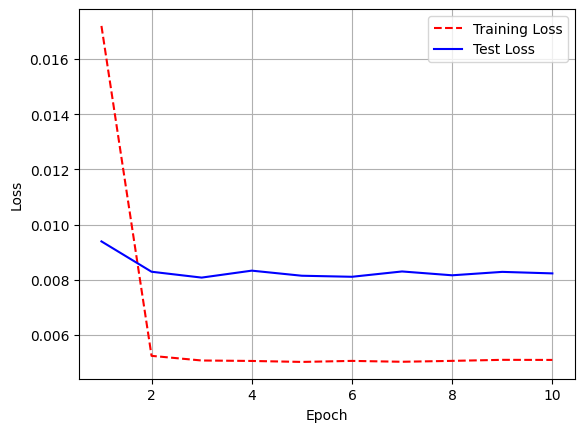

Everett
Epoch 1/10
1318/1318 - 7s - 6ms/step - loss: 0.0139 - val_loss: 0.0168
Epoch 2/10
1318/1318 - 4s - 3ms/step - loss: 0.0086 - val_loss: 0.0165
Epoch 3/10
1318/1318 - 4s - 3ms/step - loss: 0.0085 - val_loss: 0.0159
Epoch 4/10
1318/1318 - 4s - 3ms/step - loss: 0.0084 - val_loss: 0.0162
Epoch 5/10
1318/1318 - 4s - 3ms/step - loss: 0.0084 - val_loss: 0.0162
Epoch 6/10
1318/1318 - 4s - 3ms/step - loss: 0.0084 - val_loss: 0.0169
Epoch 7/10
1318/1318 - 4s - 3ms/step - loss: 0.0083 - val_loss: 0.0165
Epoch 8/10
1318/1318 - 4s - 3ms/step - loss: 0.0084 - val_loss: 0.0161
Epoch 9/10
1318/1318 - 4s - 3ms/step - loss: 0.0083 - val_loss: 0.0161
Epoch 10/10
1318/1318 - 4s - 3ms/step - loss: 0.0084 - val_loss: 0.0161
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Train RMSE: 11.97
Test RMSE: 16.73


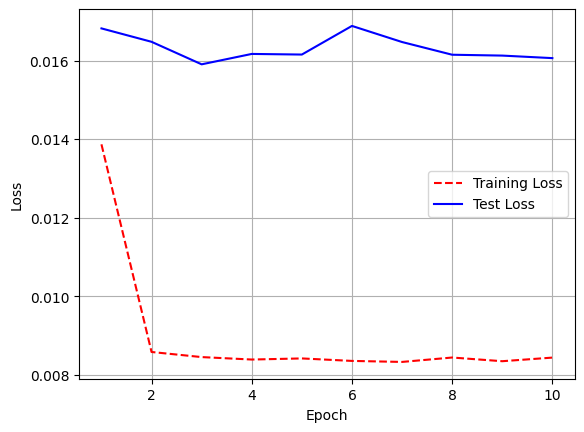

Watertown
Epoch 1/10
989/989 - 6s - 6ms/step - loss: 0.0243 - val_loss: 0.0291
Epoch 2/10
989/989 - 3s - 3ms/step - loss: 0.0138 - val_loss: 0.0244
Epoch 3/10
989/989 - 3s - 3ms/step - loss: 0.0113 - val_loss: 0.0245
Epoch 4/10
989/989 - 3s - 3ms/step - loss: 0.0112 - val_loss: 0.0248
Epoch 5/10
989/989 - 3s - 3ms/step - loss: 0.0111 - val_loss: 0.0263
Epoch 6/10
989/989 - 3s - 3ms/step - loss: 0.0111 - val_loss: 0.0243
Epoch 7/10
989/989 - 3s - 3ms/step - loss: 0.0112 - val_loss: 0.0246
Epoch 8/10
989/989 - 3s - 3ms/step - loss: 0.0111 - val_loss: 0.0242
Epoch 9/10
989/989 - 3s - 3ms/step - loss: 0.0111 - val_loss: 0.0259
Epoch 10/10
989/989 - 3s - 3ms/step - loss: 0.0111 - val_loss: 0.0248
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Train RMSE: 11.30
Test RMSE: 17.01


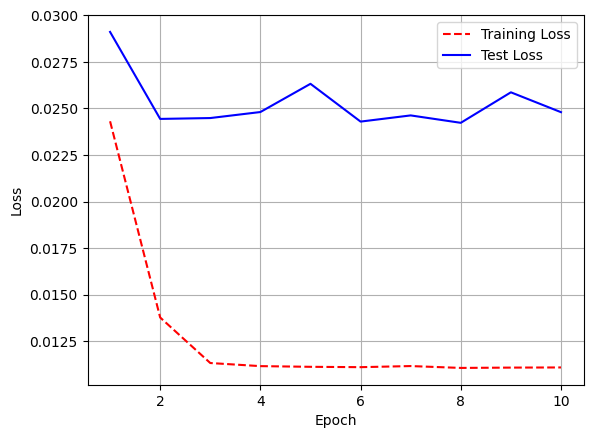

Arlington
Epoch 1/10
938/938 - 6s - 6ms/step - loss: 0.0269 - val_loss: 0.0271
Epoch 2/10
938/938 - 3s - 3ms/step - loss: 0.0203 - val_loss: 0.0250
Epoch 3/10
938/938 - 3s - 3ms/step - loss: 0.0189 - val_loss: 0.0256
Epoch 4/10
938/938 - 3s - 3ms/step - loss: 0.0187 - val_loss: 0.0252
Epoch 5/10
938/938 - 3s - 3ms/step - loss: 0.0185 - val_loss: 0.0259
Epoch 6/10
938/938 - 3s - 3ms/step - loss: 0.0185 - val_loss: 0.0250
Epoch 7/10
938/938 - 3s - 3ms/step - loss: 0.0183 - val_loss: 0.0253
Epoch 8/10
938/938 - 3s - 3ms/step - loss: 0.0182 - val_loss: 0.0258
Epoch 9/10
938/938 - 3s - 3ms/step - loss: 0.0182 - val_loss: 0.0257
Epoch 10/10
938/938 - 3s - 3ms/step - loss: 0.0182 - val_loss: 0.0251
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Train RMSE: 13.94
Test RMSE: 16.48


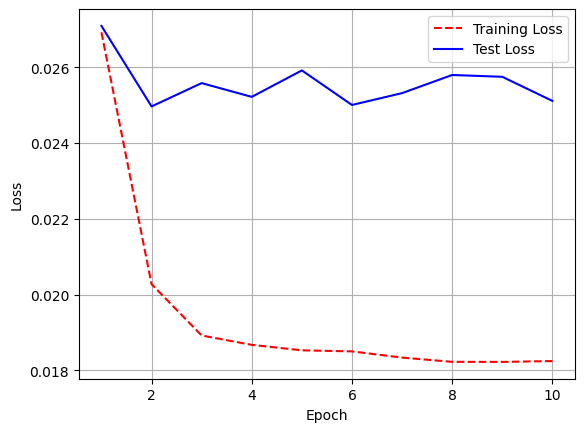

Newton
Epoch 1/10
846/846 - 6s - 7ms/step - loss: 0.0165 - val_loss: 0.0170
Epoch 2/10
846/846 - 3s - 3ms/step - loss: 0.0118 - val_loss: 0.0137
Epoch 3/10
846/846 - 3s - 3ms/step - loss: 0.0110 - val_loss: 0.0123
Epoch 4/10
846/846 - 3s - 3ms/step - loss: 0.0108 - val_loss: 0.0126
Epoch 5/10
846/846 - 3s - 3ms/step - loss: 0.0106 - val_loss: 0.0128
Epoch 6/10
846/846 - 3s - 3ms/step - loss: 0.0106 - val_loss: 0.0124
Epoch 7/10
846/846 - 3s - 3ms/step - loss: 0.0104 - val_loss: 0.0117
Epoch 8/10
846/846 - 3s - 3ms/step - loss: 0.0103 - val_loss: 0.0123
Epoch 9/10
846/846 - 3s - 3ms/step - loss: 0.0103 - val_loss: 0.0124
Epoch 10/10
846/846 - 3s - 3ms/step - loss: 0.0102 - val_loss: 0.0118
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
Train RMSE: 12.47
Test RMSE: 13.61


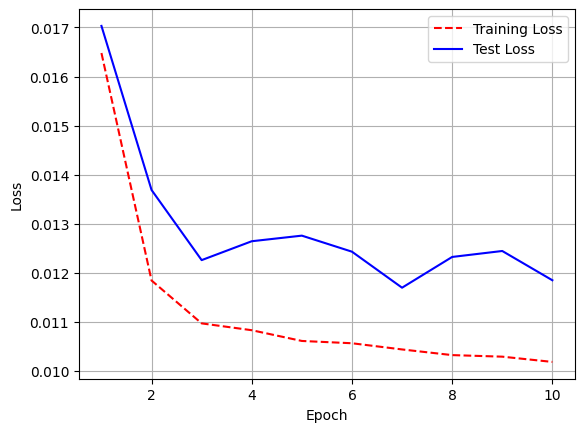

Revere
Epoch 1/10
764/764 - 6s - 7ms/step - loss: 0.0326 - val_loss: 0.0347
Epoch 2/10
764/764 - 3s - 3ms/step - loss: 0.0247 - val_loss: 0.0277
Epoch 3/10
764/764 - 2s - 3ms/step - loss: 0.0200 - val_loss: 0.0238
Epoch 4/10
764/764 - 2s - 3ms/step - loss: 0.0170 - val_loss: 0.0231
Epoch 5/10
764/764 - 2s - 3ms/step - loss: 0.0158 - val_loss: 0.0236
Epoch 6/10
764/764 - 2s - 3ms/step - loss: 0.0154 - val_loss: 0.0251
Epoch 7/10
764/764 - 2s - 3ms/step - loss: 0.0153 - val_loss: 0.0251
Epoch 8/10
764/764 - 2s - 3ms/step - loss: 0.0154 - val_loss: 0.0239
Epoch 9/10
764/764 - 2s - 3ms/step - loss: 0.0151 - val_loss: 0.0256
Epoch 10/10
764/764 - 2s - 3ms/step - loss: 0.0153 - val_loss: 0.0240
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Train RMSE: 5.45
Test RMSE: 6.81


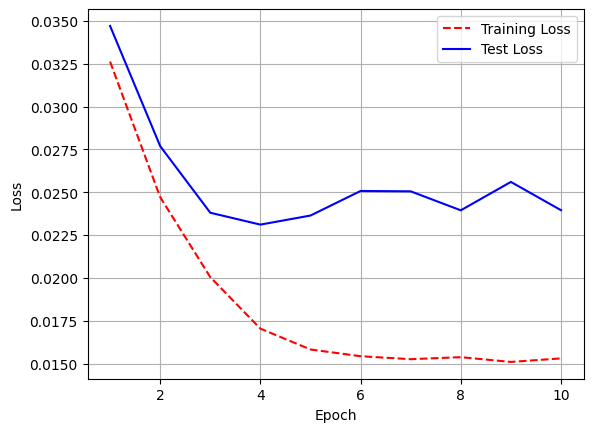

Chelsea
Epoch 1/10
793/793 - 6s - 7ms/step - loss: 0.0183 - val_loss: 0.0168
Epoch 2/10
793/793 - 2s - 3ms/step - loss: 0.0141 - val_loss: 0.0140
Epoch 3/10
793/793 - 2s - 3ms/step - loss: 0.0122 - val_loss: 0.0136
Epoch 4/10
793/793 - 2s - 3ms/step - loss: 0.0111 - val_loss: 0.0137
Epoch 5/10
793/793 - 2s - 3ms/step - loss: 0.0106 - val_loss: 0.0130
Epoch 6/10
793/793 - 2s - 3ms/step - loss: 0.0104 - val_loss: 0.0130
Epoch 7/10
793/793 - 2s - 3ms/step - loss: 0.0103 - val_loss: 0.0135
Epoch 8/10
793/793 - 2s - 3ms/step - loss: 0.0102 - val_loss: 0.0132
Epoch 9/10
793/793 - 2s - 3ms/step - loss: 0.0103 - val_loss: 0.0131
Epoch 10/10
793/793 - 2s - 3ms/step - loss: 0.0103 - val_loss: 0.0131
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Train RMSE: 4.64
Test RMSE: 5.27


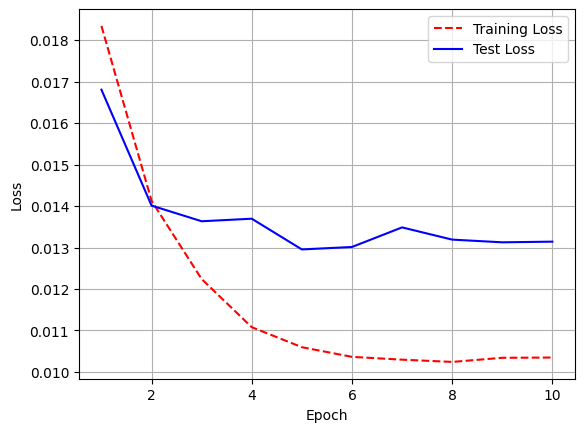

Salem
Epoch 1/10
710/710 - 5s - 8ms/step - loss: 0.0063 - val_loss: 0.0199
Epoch 2/10
710/710 - 2s - 3ms/step - loss: 0.0047 - val_loss: 0.0141
Epoch 3/10
710/710 - 2s - 3ms/step - loss: 0.0037 - val_loss: 0.0132
Epoch 4/10
710/710 - 2s - 3ms/step - loss: 0.0034 - val_loss: 0.0132
Epoch 5/10
710/710 - 2s - 3ms/step - loss: 0.0033 - val_loss: 0.0130
Epoch 6/10
710/710 - 2s - 3ms/step - loss: 0.0033 - val_loss: 0.0133
Epoch 7/10
710/710 - 2s - 3ms/step - loss: 0.0033 - val_loss: 0.0142
Epoch 8/10
710/710 - 2s - 3ms/step - loss: 0.0034 - val_loss: 0.0133
Epoch 9/10
710/710 - 2s - 3ms/step - loss: 0.0034 - val_loss: 0.0132
Epoch 10/10
710/710 - 2s - 3ms/step - loss: 0.0033 - val_loss: 0.0127
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Train RMSE: 15.93
Test RMSE: 31.45


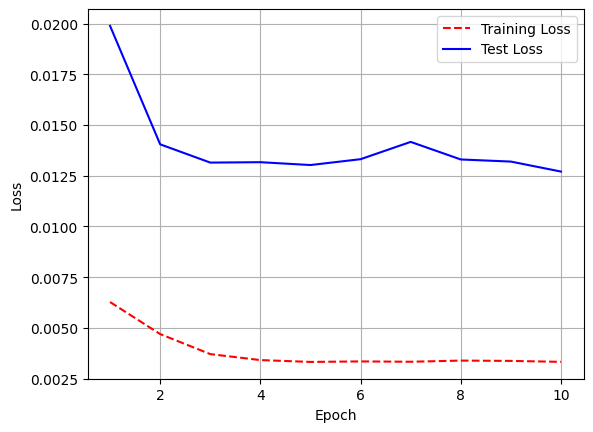

Medford
Epoch 1/10
368/368 - 6s - 15ms/step - loss: 0.0522 - val_loss: 0.0266
Epoch 2/10
368/368 - 1s - 3ms/step - loss: 0.0326 - val_loss: 0.0244
Epoch 3/10
368/368 - 1s - 3ms/step - loss: 0.0267 - val_loss: 0.0232
Epoch 4/10
368/368 - 1s - 3ms/step - loss: 0.0222 - val_loss: 0.0228
Epoch 5/10
368/368 - 1s - 3ms/step - loss: 0.0200 - val_loss: 0.0236
Epoch 6/10
368/368 - 1s - 3ms/step - loss: 0.0191 - val_loss: 0.0243
Epoch 7/10
368/368 - 1s - 3ms/step - loss: 0.0188 - val_loss: 0.0246
Epoch 8/10
368/368 - 1s - 3ms/step - loss: 0.0186 - val_loss: 0.0252
Epoch 9/10
368/368 - 1s - 3ms/step - loss: 0.0187 - val_loss: 0.0250
Epoch 10/10
368/368 - 1s - 3ms/step - loss: 0.0186 - val_loss: 0.0255
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step  
Train RMSE: 8.32
Test RMSE: 9.74


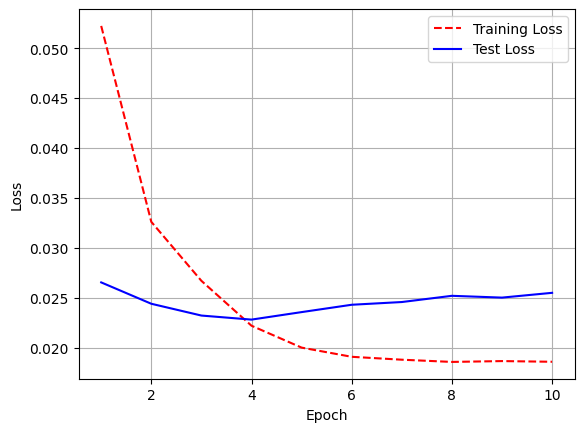

Malden
Epoch 1/10
358/358 - 5s - 13ms/step - loss: 0.0416 - val_loss: 0.0134
Epoch 2/10
358/358 - 1s - 3ms/step - loss: 0.0288 - val_loss: 0.0120
Epoch 3/10
358/358 - 1s - 3ms/step - loss: 0.0269 - val_loss: 0.0115
Epoch 4/10
358/358 - 1s - 3ms/step - loss: 0.0254 - val_loss: 0.0125
Epoch 5/10
358/358 - 1s - 4ms/step - loss: 0.0248 - val_loss: 0.0111
Epoch 6/10
358/358 - 1s - 3ms/step - loss: 0.0243 - val_loss: 0.0114
Epoch 7/10
358/358 - 1s - 4ms/step - loss: 0.0240 - val_loss: 0.0103
Epoch 8/10
358/358 - 1s - 3ms/step - loss: 0.0241 - val_loss: 0.0112
Epoch 9/10
358/358 - 1s - 3ms/step - loss: 0.0240 - val_loss: 0.0120
Epoch 10/10
358/358 - 1s - 3ms/step - loss: 0.0239 - val_loss: 0.0103
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
Train RMSE: 6.33
Test RMSE: 4.17


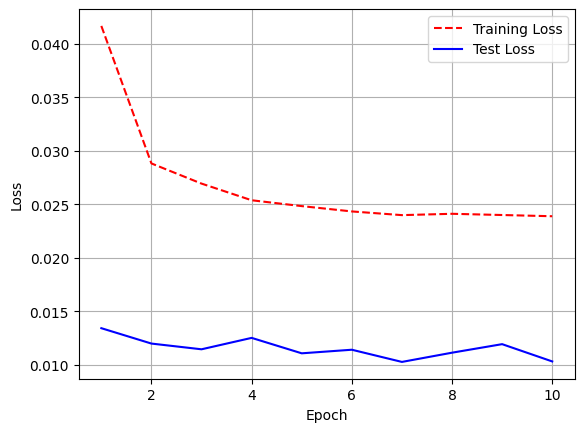

In [53]:
district_dict = {}
dataset_lst = []
y_train_pred_lst = []
y_test_pred_lst = []
rmse_train = []
rmse_test = []

for district in df2["District"].unique():
    dataset, y_train_pred, y_test_pred, rmse_train, rmse_test = district_demand_forecast_LSTM(
        rmse_train, rmse_test, district=district
    )
    dataset_lst.append(dataset)
    y_train_pred_lst.append(y_train_pred)
    y_test_pred_lst.append(y_test_pred)

In [54]:
print('Train Score: %.2f RMSE' % np.mean(rmse_train))
print('Test Score: %.2f RMSE' % np.mean(rmse_test))

Train Score: 152.45 RMSE
Test Score: 212.27 RMSE


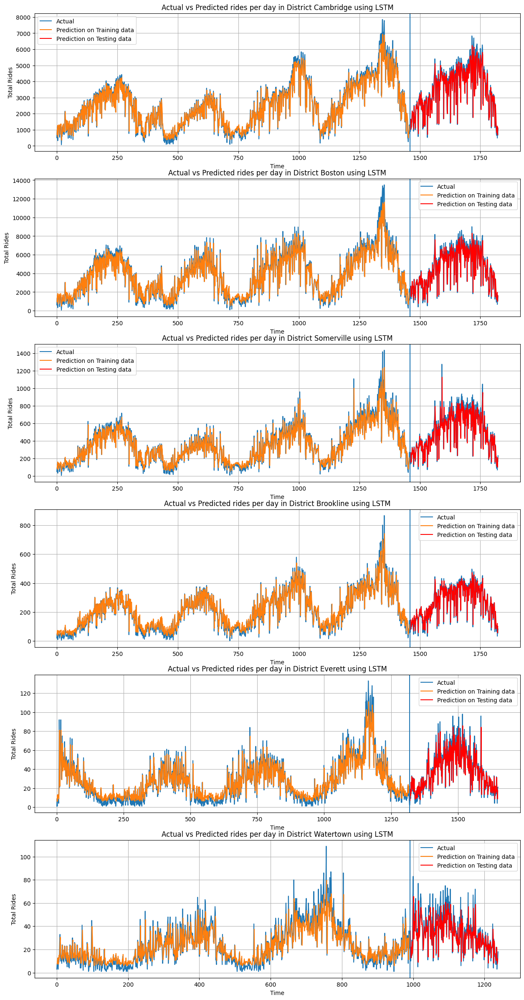

In [55]:
# Plotting the actual and predicted values
district_list = df2["District"].unique()
result = list(zip(district_list, dataset_lst, y_train_pred_lst, y_test_pred_lst))

fig, axs = plt.subplots(6, figsize=(15, 30))
for i in range(6):
    look_back = 1

    district = result[i][0]
    dataset = result[i][1]
    trainPredict = result[i][2]
    testPredict = result[i][3]

    train_size = int(len(dataset) * 0.80)

    dataset_plot = dataset

    y_train_pred_plot = np.empty_like(dataset)
    y_train_pred_plot[:, :] = np.nan
    y_train_pred_plot[look_back: len(trainPredict) + look_back, :] = trainPredict

    y_test_pred_plot = np.empty_like(dataset)
    y_test_pred_plot[:, :] = np.nan
    y_test_pred_plot[len(trainPredict) + (look_back * 2) + 1 : len(dataset) - 1, :] = testPredict

    axs[i].plot(dataset_plot, label="Actual")
    axs[i].plot(y_train_pred_plot, label="Prediction on Training data")
    axs[i].plot(y_test_pred_plot, label="Prediction on Testing data", color="red")
    axs[i].axvline(x=train_size)
    axs[i].set_title("Actual vs Predicted rides per day in District {} using LSTM".format(district))
    axs[i].set_xlabel('Time')
    axs[i].set_ylabel('Total Rides')
    axs[i].legend()
    axs[i].grid()

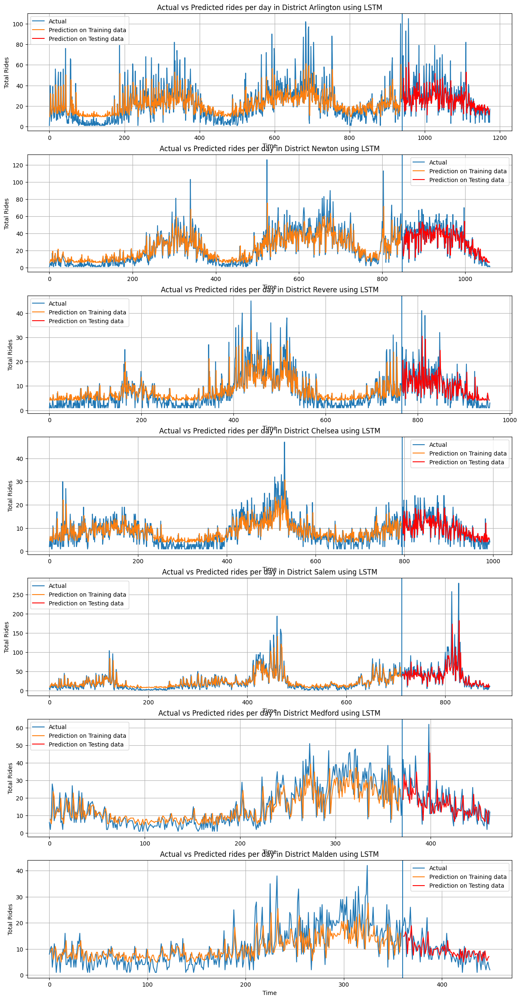

In [56]:
# Plotting the actual and predicted values
district_list = df2["District"].unique()
result = list(zip(district_list, dataset_lst, y_train_pred_lst, y_test_pred_lst))

fig, axs = plt.subplots(7, figsize=(15, 30))
for i in range(6, len(result)):
    look_back = 1

    district = result[i][0]
    dataset = result[i][1]
    trainPredict = result[i][2]
    testPredict = result[i][3]

    train_size = int(len(dataset) * 0.80)

    dataset_plot = dataset

    y_train_pred_plot = np.empty_like(dataset)
    y_train_pred_plot[:, :] = np.nan
    y_train_pred_plot[look_back: len(trainPredict) + look_back, :] = trainPredict

    y_test_pred_plot = np.empty_like(dataset)
    y_test_pred_plot[:, :] = np.nan
    y_test_pred_plot[len(trainPredict) + (look_back * 2) + 1 : len(dataset) - 1, :] = testPredict

    axs[i - 6].plot(dataset_plot, label="Actual")
    axs[i - 6].plot(y_train_pred_plot, label="Prediction on Training data")
    axs[i - 6].plot(y_test_pred_plot, label="Prediction on Testing data", color="red")
    axs[i - 6].axvline(x=train_size)
    axs[i - 6].set_title("Actual vs Predicted rides per day in District {} using LSTM".format(district))
    axs[i - 6].set_xlabel('Time')
    axs[i - 6].set_ylabel('Total Rides')
    axs[i - 6].legend()
    axs[i - 6].grid()